# Error analysis notebook (validation data)

## Import packages

In [13]:
import pandas as pd
import math

import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from elasticsearch import Elasticsearch

import warnings
import matplotlib
warnings.filterwarnings("ignore",category=matplotlib.cbook.mplDeprecation)
warnings.filterwarnings("ignore")

from enum import IntEnum

import json


## Set filepaths

In [14]:
ranking_ac_base_A_9 = '../evaluation/resources/2020/jsonruns/ac_controller_train10_meta_9_linear_author_none_train.json'
ranking_ac_base_A_99 = '../evaluation/resources/2020/jsonruns/ac_controller_train10_meta_99_linear_author_none_train.json'
ranking_ac_base_B_9 = '../evaluation/resources/2020/jsonruns/ac_controller_train10_text_9_linear_author_none_train.json'
ranking_ac_base_B_99 = '../evaluation/resources/2020/jsonruns/ac_controller_train10_text_99_linear_author_none_train.json'

ranking_lm_base = '../evaluation/resources/2020/jsonruns/lambdamart_mrfr_train_90_10_split_lm_ndcg_nofeat_random_state=0.json'

eval_result_ac_base_A_9 = '../evaluation/resources/2020/eval_results/ac_controller_train10_meta_9_linear_author_none_train_TREC-Fair-Ranking-training-sample_-10-full-annotations-DocHLevel-mixed_group-qrels.tsv'
eval_result_ac_base_A_99 = '../evaluation/resources/2020/eval_results/ac_controller_train10_meta_99_linear_author_none_train_TREC-Fair-Ranking-training-sample_-10-full-annotations-DocHLevel-mixed_group-qrels.tsv'
eval_result_ac_base_B_9 = '../evaluation/resources/2020/eval_results/ac_controller_train10_text_9_linear_author_none_train_TREC-Fair-Ranking-training-sample_-10-full-annotations-DocHLevel-mixed_group-qrels.tsv'
eval_result_ac_base_B_99 = '../evaluation/resources/2020/eval_results/ac_controller_train10_text_99_linear_author_none_train_TREC-Fair-Ranking-training-sample_-10-full-annotations-DocHLevel-mixed_group-qrels.tsv'

eval_result_lm_base ='../evaluation/resources/2020/eval_results/lambdamart_mrfr_train_90_10_split_lm_ndcg_nofeat_random_state=0_TREC-Fair-Ranking-training-sample_-10-full-annotations-DocHLevel-mixed_group-qrels.tsv'


gt = '../pre_processing/resources/training/2020/TREC-Fair-Ranking-training-sample.json'

erels_A = '../reranking/resources/relevances/Training_rel_scores_model_A.csv'
erels_B = '../reranking/resources/relevances/Training_rel_scores_model_B.csv'


annotations = '../pre_pre_processing/resources/merged-annotations.json'
mapping = '../reranking/resources/mappings/doc_to_author.json'

## Prepare dataframes

In [15]:
def eval_results_to_df(eval_result):
    df = pd.read_csv(eval_result, sep='\t', names=['key', 'qid', 'value'])
    df = df.pivot(index='qid', columns='key', values='value')
    df = df.reset_index()
    df = df.sort_values('difference')
    return df

In [16]:
# ranking df
rdf_ac_base_A_9 = pd.read_json(ranking_ac_base_A_9, lines=True)
rdf_ac_base_A_99 = pd.read_json(ranking_ac_base_A_99, lines=True)
rdf_ac_base_B_9 = pd.read_json(ranking_ac_base_B_9, lines=True)
rdf_ac_base_B_99 = pd.read_json(ranking_ac_base_B_99, lines=True)

rdf_lm_base = pd.read_json(ranking_lm_base, lines=True)

# ground truth df
gtdf = pd.read_json(gt, lines=True).explode('documents')
gtdf['doc_id'] = gtdf.documents.apply(lambda row: row.get('doc_id'))
gtdf['doc_rel'] = gtdf.documents.apply(lambda row: row.get('relevance'))

# paired down relevances df
reldf = gtdf[['qid','query','doc_id','doc_rel']]

# eval result dfs
edf_ac_base_A_9 = eval_results_to_df(eval_result_ac_base_A_9)
edf_ac_base_A_99 = eval_results_to_df(eval_result_ac_base_A_99)
edf_ac_base_B_9 = eval_results_to_df(eval_result_ac_base_B_9)
edf_ac_base_B_99 = eval_results_to_df(eval_result_ac_base_B_99)

edf_lm_base = eval_results_to_df(eval_result_lm_base)


# est rel df
ereldf_A = pd.read_csv(erels_A)
ereldf_B = pd.read_csv(erels_B)

# annotations
adf = pd.read_json(annotations,lines=True)
adf = adf.explode('authors')
adf[['name','wiki','country','type','valid','auth_id', 'h_index','level','region']] = adf.authors.apply(pd.Series).rename({'id':'auth_id'},axis=1)

# doc to author and reverse mapping
with open(mapping) as fp:
    doc_to_author = json.load(fp)

author_to_doc = {}
for doc, aulist in doc_to_author.items():
    for au in aulist:
        if not au in author_to_doc:
            author_to_doc[au] = []
        author_to_doc[au] = author_to_doc[au] + [doc]

In [17]:
rdf_ac_base_A_9.head(2)

,q_num,qid,ranking
0,180.0,10795,"[ef7bfa013689524c27370ef7849789b48ff42656, 4d5..."
1,180.1,10795,"[4145a64995792f84d456e62ef83f1404251893c3, 6a2..."


In [18]:
rdf_ac_base_A_99.head(2)

,q_num,qid,ranking
0,180.0,10795,"[ef7bfa013689524c27370ef7849789b48ff42656, 4d5..."
1,180.1,10795,"[ef7bfa013689524c27370ef7849789b48ff42656, 4d5..."


In [19]:
rdf_ac_base_B_9.head(2)

,q_num,qid,ranking
0,180.0,10795,"[ef7bfa013689524c27370ef7849789b48ff42656, 4d5..."
1,180.1,10795,"[4145a64995792f84d456e62ef83f1404251893c3, 6a2..."


In [20]:
rdf_ac_base_B_99.head(2)

,q_num,qid,ranking
0,180.0,10795,"[ef7bfa013689524c27370ef7849789b48ff42656, 4d5..."
1,180.1,10795,"[ef7bfa013689524c27370ef7849789b48ff42656, 4d5..."


In [21]:
rdf_lm_base.head(2)

,q_num,qid,ranking
0,180.0,10795,"[4145a64995792f84d456e62ef83f1404251893c3, 448..."
1,180.1,10795,"[4145a64995792f84d456e62ef83f1404251893c3, 448..."


In [22]:
gtdf.head(2)

,qid,query,frequency,documents,doc_id,doc_rel
0,5438,cloud computing,0.000057,{'doc_id': '3e19046c665867bbe557685da60738a407...,3e19046c665867bbe557685da60738a40738010a,0
0,5438,cloud computing,0.000057,{'doc_id': '7ef08f1fa127af817cdfd9d3bd00bdf60e...,7ef08f1fa127af817cdfd9d3bd00bdf60e32143b,0


In [23]:
reldf.head(2)

,qid,query,doc_id,doc_rel
0,5438,cloud computing,3e19046c665867bbe557685da60738a40738010a,0
0,5438,cloud computing,7ef08f1fa127af817cdfd9d3bd00bdf60e32143b,0


### EEL for each configuration

In [24]:
print('ac a 9:', round(edf_ac_base_A_9.difference.mean(),5), round(edf_ac_base_A_9.disparity.mean(),5), round(edf_ac_base_A_9.relevance.mean(),5))
print('ac a 99:', round(edf_ac_base_A_99.difference.mean(),5), round(edf_ac_base_A_99.disparity.mean(),5), round(edf_ac_base_A_99.relevance.mean(),5))
print('ac b 9:', round(edf_ac_base_B_9.difference.mean(),5), round(edf_ac_base_B_9.disparity.mean(),5), round(edf_ac_base_B_9.relevance.mean(),5))
print('ac b 99:', round(edf_ac_base_B_99.difference.mean(),5), round(edf_ac_base_B_99.disparity.mean(),5), round(edf_ac_base_B_99.relevance.mean(),5))
print('lm:',round(edf_lm_base.difference.mean(),5), round(edf_lm_base.disparity.mean(),5), round(edf_lm_base.relevance.mean(),5))

ac a 9: 0.49781 1.65309 1.12424
ac a 99: 0.45284 1.60853 1.12444
ac b 9: 0.52645 1.68113 1.12394
ac b 99: 0.51575 1.67025 1.12385
lm: 0.76191 2.15418 1.24273


In [25]:
edf_ac_base_A_9.head(2)

key,qid,difference,disparity,relevance
0,3462,0.086649,1.672805,1.349763
8,27887,0.095488,1.301946,0.955337


In [26]:
edf_ac_base_A_99.head(2)

key,qid,difference,disparity,relevance
5,12828,0.086219,1.417510,1.129789
0,3462,0.091515,1.730205,1.376030


In [27]:
edf_ac_base_B_9.head(2)

key,qid,difference,disparity,relevance
0,3462,0.078453,1.628171,1.331544
8,27887,0.092795,1.286375,0.948898


In [28]:
edf_ac_base_B_99.head(2)

key,qid,difference,disparity,relevance
0,3462,0.080165,1.680614,1.356909
8,27887,0.087944,1.267927,0.942100


In [29]:
edf_lm_base.head(2)

key,qid,difference,disparity,relevance
17,67404,0.010388,1.775892,1.736097
16,66637,0.011306,2.150781,1.995850


In [30]:
adf.head(2)

,id,missing_authors,authors,name,wiki,country,type,valid,auth_id,h_index,level,region
0,f3b7db81ee8642cf2deab7a9834e07b8df54185b,False,"{'name': 'David M. Szymanski', 'wiki': 'Texas ...",David M. Szymanski,Texas A&M University,US,academic,True,50215565.0,9.0,Advanced,Americas
0,f3b7db81ee8642cf2deab7a9834e07b8df54185b,False,"{'name': 'David H. Henard', 'wiki': 'North Car...",David H. Henard,North Carolina State University,US,academic,True,115002169.0,8.0,Advanced,Americas


## Extract information for specific query

Helper methods.

In [31]:
def extract_results_based_on_qid(qid, ranking_df):
    return ranking_df[ranking_df.qid == qid]

def extract_relevances_based_on_qid(qid, relevance_df):
    return relevance_df[relevance_df.qid == qid]

In [32]:
def count_relgrades(relevance_df):
    rel_counts = relevance_df.doc_rel.value_counts()
    rel_count = rel_counts[1]
    nonrel_count = rel_counts[0]
    return rel_count, nonrel_count

def count_relgrades_qid(qid, relevance):
    subrelevance = extract_relevances_based_on_qid(qid, relevance)
    return count_relgrades(subrelevance)


## Methods

In [33]:
def plot_rel_nonrel_per_rank(data):
    """Plot the number of times a (non)relevant item appeared at a rank."""
    
    sns.set(rc={'figure.figsize':(11.7,8.27)})
    sns.barplot(x="rank", y="count", hue="relkind", data=data)

In [34]:
def plots_for_qid(qid,ranking,relevance,k=2):
    plot_rel_nonrel_per_rank_per_relkind_for_qid(qid, ranking, relevance, regline=False)
    plot_rel_nonrel_per_rank_per_relkind_for_qid(qid, ranking, relevance, regline=True)

    plot_doc_occurrence_per_rank_for_qid(qid, ranking, relevance,k)
    plot_doc_occurrence_per_rank_for_qid(qid, ranking, relevance,k,rev=True)
    plot_doc_pos_count_for_qid(qid, ranking, relevance)

### Methods count per rank

In [35]:
def count_rel_nonrel_per_rank(rankings_df, relevance_df):
    """rankings_df and relevance_df should already be reduced to the information for a single qid"""
    countdict = {k :{'r':0,'nr':0} for k in range(1,len(rankings_df['ranking'].iloc[0]) + 1)}
    for idx, row in rankings_df.iterrows():
        for i, doc in enumerate(row['ranking']):
            rel = relevance_df[relevance_df.doc_id == doc].doc_rel.iloc[0]
            if rel == 0:
                countdict[i+1]['nr'] = countdict[i+1]['nr'] + 1
            elif rel == 1:
                countdict[i+1]['r'] = countdict[i+1]['r'] + 1
            else:
                raise ValueError
    return countdict
            

In [36]:
def rel_nonrel_per_rank_counts_to_sns_df(countdict):
    unpacked = [record for reclist in [[{**{'rank':k},**{'relkind':k2,'count':v2}} for k2,v2 in v.items()] for k,v in countdict.items()] for record in reclist]
    return pd.DataFrame(unpacked)

In [37]:
def plot_rel_nonrel_per_rank_per_relkind(data,num_rel,regline=False):
    """Plot the number of times a (non)relevant item appeared at a rank, split by rank."""
    
    pi = iter(sns.color_palette())
    pi2 = iter(sns.color_palette('dark'))
    f = next(pi)
    f2 = next(pi2)
    s = next(pi)
    s2 = next(pi2)
    next(pi)
    next(pi2)
    t = next(pi)
    t2 = next(pi2)

    fig, ax = plt.subplots(1,2,figsize = (17.7,8.27))
    ax[0].title.set_text('Relevant item counts')
    ax[1].title.set_text('Nonrelevant item counts')

    colorsf = [f] * num_rel + [f2] * (len(data) - num_rel)
    colorss = [s] * num_rel + [s2] * (len(data) - num_rel)
    
    sns.barplot(x="rank", y="count", data=data[data.relkind=='r'],ax=ax[0],palette=sns.color_palette(colorsf))
    sns.barplot(x="rank", y="count", data=data[data.relkind=='nr'],ax=ax[1],palette=sns.color_palette(colorss))

    if regline:
        colorst = [t] * num_rel + [t2] * (len(data) - num_rel)
        sns.regplot(x="rank", y="count", data=data[data.relkind=='r'],ax=ax[0], scatter_kws={"s": 0}, palette=sns.color_palette(colorst))
        sns.regplot(x="rank", y="count", data=data[data.relkind=='nr'],ax=ax[1], scatter_kws={"s": 0},palette=sns.color_palette(colorst))
    return fig


In [38]:
def plot_rel_nonrel_per_rank_per_relkind_for_qid(qid, ranking, relevance, regline=False):
    subranking = extract_results_based_on_qid(qid, ranking)
    subrelevance = extract_relevances_based_on_qid(qid, relevance)
    
    num_rel_docs, num_nonrel_docs = count_relgrades(subrelevance)
    
    rel_nonrel_counts = count_rel_nonrel_per_rank(subranking, subrelevance)
    rel_nonrel_df = rel_nonrel_per_rank_counts_to_sns_df(rel_nonrel_counts)
    fig = plot_rel_nonrel_per_rank_per_relkind(rel_nonrel_df,num_rel_docs,regline=regline)
    fig.suptitle(f"(Non-)relevant documents per rank for {qid}, top={num_rel_docs}")
    

### Methods doc occurrence in top positions

In [39]:
def count_doc_occurrence_per_rank(rankings_df):
    """Count how often each document occurs at each rank."""
    count_per_doc_per_rank = {i: {} for i in list(range(1,len(rankings_df['ranking'].iloc[0]) + 1))}

    for idx, row in rankings_df.iterrows():
        for j, doc in enumerate(row['ranking']):
            i = j + 1
            if not doc in count_per_doc_per_rank[i]:
                count_per_doc_per_rank[i][doc] = 0
            count_per_doc_per_rank[i][doc] = count_per_doc_per_rank[i][doc] + 1
    return count_per_doc_per_rank

In [40]:
def doc_occurrence_per_rank_to_sns_df(occurrence_dict, relevance_df):
    unpacked = [d for dlist in [[{'rank':k, 'doc_id':k2, 'count':v2} for k2, v2 in v.items()] for k,v in occurrence_dict.items()] for d in dlist]
    unpacked_df = pd.DataFrame(unpacked)

    return pd.merge(unpacked_df,reldf[['doc_id','doc_rel']],on='doc_id',how='left')

In [41]:
def plot_doc_occurrence_per_rank(data, k=2, rev=False):
    """Show how often each document in :data: appears at each rank <= k."""
    sns.set_palette("tab10")
    pi = iter(sns.color_palette())
    first = next(pi)
    second = next(pi)
    
    data["doc_labels"] = data.doc_id.apply(lambda row: f"{row[:4]}...")
    
    fig, ax = plt.subplots(1, k, figsize = (9*k, 8))
    
    for i in range(0,k):
        rank = i + 1
        if rev:
            rank = len(set(data["rank"].to_list())) - rank
    
        thisaxdata = data[data['rank'] == rank].sort_values(by='count',ascending=False)
    
        clrs = [first if rel == 1 else second for rel in thisaxdata.doc_rel.to_list()]
        sns.barplot(x="doc_labels", y="count",palette=clrs, data=thisaxdata,ax=ax[i])
        ax[i].title.set_text(f'Rank {rank}')
        _ = ax[i].set_xticklabels(ax[i].get_xticklabels(),rotation = -70)
        ax[i].legend(labels=["rel","nonrel"], title='relkind')
        leg = ax[i].get_legend()
        leg.legendHandles[0].set_color(first)
        leg.legendHandles[1].set_color(second)
    return fig

In [42]:
def plot_doc_occurrence_per_rank_for_qid(qid, ranking, relevance, k=2, rev=False):
    subranking = extract_results_based_on_qid(qid, ranking)
    subrelevance = extract_relevances_based_on_qid(qid, relevance)

    doc_per_rank_counts = count_doc_occurrence_per_rank(subranking)
    rank_occurrence_df = doc_occurrence_per_rank_to_sns_df(doc_per_rank_counts, subrelevance)

    fig = plot_doc_occurrence_per_rank(rank_occurrence_df, k, rev)
    fig.suptitle(f"Document counts per rank for {qid}")
    
    

### Methods number of times a doc is in a top position

In [43]:
def count_pos_of_documents(ranking_df, num_relevant_docs):
    doc_pos_count_dict = {}

    for idx, row in ranking_df.iterrows():
        for i, doc in enumerate(row['ranking']):
            if not doc in doc_pos_count_dict:
                doc_pos_count_dict[doc] = {"top": 0, "bot": 0}
            if i < num_relevant_docs:
                doc_pos_count_dict[doc]["top"] = doc_pos_count_dict[doc]["top"] + 1
            else:
                doc_pos_count_dict[doc]["bot"] = doc_pos_count_dict[doc]["bot"] + 1

    return doc_pos_count_dict        

In [44]:
def document_pos_count_to_sns_df(doc_pos_count_dict, relevance_df):
    unpacked = [d for dlist in [[{'doc_id':k, 'pos':k2, 'count':v2} for k2, v2 in v.items()] for k,v in doc_pos_count_dict.items()] for d in dlist]
    unpacked_df = pd.DataFrame(unpacked)
    
    m = pd.merge(unpacked_df,relevance_df[['doc_id','doc_rel']],on='doc_id',how='left')
    return m.drop_duplicates()

In [45]:
def document_pos_count_df_for_qid(qid,ranking,relevance):
    subranking = extract_results_based_on_qid(qid, ranking)
    subrelevance = extract_relevances_based_on_qid(qid,relevance)
    num_rel_docs, num_nonrel_docs = count_relgrades(subrelevance)

    
    doc_position_counts = count_pos_of_documents(subranking, num_rel_docs)
    doc_pos_count_df = document_pos_count_to_sns_df(doc_position_counts, subrelevance)
    return doc_pos_count_df
    

In [46]:
def plot_doc_pos_count(data,numrel,numnrel,sortby=['count'],no_author_ids=None):
    """Plot how many times each document occurred in the top and bottom positions."""
    
    
    sns.set_palette("tab10")
    pi = iter(sns.color_palette())
    first = next(pi)
    second = next(pi)

    data["doc_labels"] = data.doc_id.apply(lambda row: f"{row[:4]}...")


    fig, ax = plt.subplots(1, 2, figsize = (18, 8))
    _ = ax[0].title.set_text(f'Occurrence of doc in top pos (k={numrel})')
    _ = ax[1].title.set_text(f'Occurrence of doc in bottom pos (k={numnrel})')

    for i, pos in enumerate(["top","bot"]):
        _ = ax[i].set_xticklabels(ax[i].get_xticklabels(),rotation = -70)
        thisaxdata = data[data['pos'] == pos].sort_values(by=sortby,ascending=False)
        
     
        
        clrs = [first if rel == 1 else second for rel in thisaxdata.doc_rel.to_list()]
        
        sns.barplot(x="doc_labels", y="count",palette=clrs, data=thisaxdata,ax=ax[i])
        
        if no_author_ids:
            thisaxdata['secondcount'] = thisaxdata.apply(lambda row: row['count'] if row['doc_id'] in no_author_ids else 0, axis=1)
            sns.barplot(x="doc_labels", y="secondcount",palette=clrs, data=thisaxdata,ax=ax[i],hatch='//')
     
        ax[i].legend(labels=["rel","nonrel"], title='relkind')
        
        leg = ax[i].get_legend()
        leg.legendHandles[0].set_color(first)
        leg.legendHandles[1].set_color(second)
        
  
    return fig


In [47]:
def plot_doc_pos_count_for_qid(qid, ranking, relevance,sortby=['count'], no_author_ids=None):
    doc_pos_count_df = document_pos_count_df_for_qid(qid,ranking,relevance)
    subrelevance = extract_relevances_based_on_qid(qid,relevance)
    num_rel_docs, num_nonrel_docs = count_relgrades(subrelevance)
    fig = plot_doc_pos_count(doc_pos_count_df,num_rel_docs,num_nonrel_docs,sortby=sortby,no_author_ids=no_author_ids)

    fig.suptitle(f"Document position counts {qid}")

## Error analysis template
For each ranker and grouping, we answer the following questions to gain insight into the points of failure of the ranker.

1. How often were top positions occupied by relevant documents? Can these documents be categorized and distinguished from other documents?
2. How often were top positions occupied by non-relevant documents? Can these documents be categorized and distinguished from other documents?
3. Which relevant documents appear rarely or not at all in the top positions? Why did these documents not appear in the top positions more often?
4. How does the distribution of disparity, relevance, and constant terms change with increasing query difficulty?
5. What obvious mistakes did the system make that it could have easily avoided?
7. Other features of note  
    a. Number of top positions for this query.
8. What should the system do to improve performance?
9. What added information would be helpful? How can the system get that information?
10. Are there differences between the NIST assessment of documents and your own assessment?

## Performance stats

### edf_ac_base_A_9

In [48]:
edf_ac_base_A_9.difference.mean()

0.4978138

In [49]:
edf_ac_base_A_9.disparity.mean()

1.6530905

In [50]:
edf_ac_base_A_9.relevance.mean()

1.1242367999999998

### edf_ac_base_A_9

In [51]:
edf_ac_base_A_99.difference.mean()

0.45283700000000005

In [52]:
edf_ac_base_A_99.disparity.mean()

1.60852605

In [53]:
edf_ac_base_A_99.relevance.mean()

1.12444295

### edf_ac_base_A_9

In [54]:
edf_ac_base_B_9.difference.mean()

0.5264504999999999

In [55]:
edf_ac_base_B_9.disparity.mean()

1.6811273500000001

In [56]:
edf_ac_base_B_9.relevance.mean()

1.1239369

### edf_ac_base_A_9

In [57]:
edf_ac_base_B_99.difference.mean()

0.5157489

In [58]:
edf_ac_base_B_99.disparity.mean()

1.6702546999999999

In [59]:
edf_ac_base_B_99.relevance.mean()

1.12385135

### edf_lm_base

In [60]:
edf_lm_base.difference.mean()

0.7619147999999999

In [61]:
edf_lm_base.disparity.mean()

2.1541799999999998

In [62]:
edf_lm_base.relevance.mean()

1.2427311499999998

## Difficulty according to each ranking config

In [63]:
print("k\tA9\tA99\tB9\tB99\tLM")
for c, (i, j, k, l, m) in enumerate(zip(edf_ac_base_A_9.qid.to_list(),edf_ac_base_A_99.qid.to_list(),edf_ac_base_B_9.qid.to_list(),edf_ac_base_B_99.qid.to_list(),edf_lm_base.qid.to_list())):
        print(f"{c+1}:\t{i}\t{j}\t{k}\t{l}\t{m}")

k	A9	A99	B9	B99	LM
1:	3462	12828	3462	3462	67404
2:	27887	3462	27887	27887	66637
3:	66637	27887	66637	12073	54003
4:	10795	10795	10795	66637	12096
5:	12828	66637	12828	12828	120668
6:	54003	12073	120668	10795	12073
7:	120668	54003	12073	51432	10795
8:	12073	120668	54003	120668	49766
9:	64062	51432	12096	54003	70673
10:	12096	64062	64062	12096	3462
11:	49766	12096	67404	64062	12828
12:	67404	49766	49766	49766	43018
13:	8940	67404	51432	67404	64062
14:	70673	8940	8940	8940	25869
15:	51432	70673	70673	70673	20363
16:	25869	20363	25869	25869	51432
17:	20363	25869	20363	20363	8940
18:	43018	43018	43018	43018	27887
19:	30631	30631	30631	30631	30631
20:	31412	31412	31412	31412	31412


## Visualization

For each rank, we show how often it is occupied by a relevant document. We show this for the top and bottom 10 queries so we can determine both what documents are placed in top positions on easy queries and which on difficult queries.

### edf_ac_base_A_9

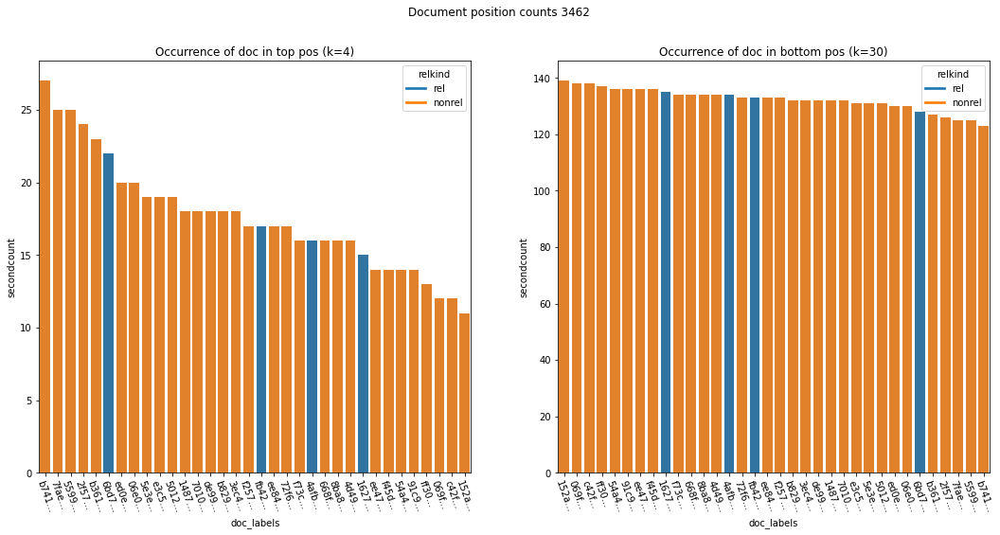

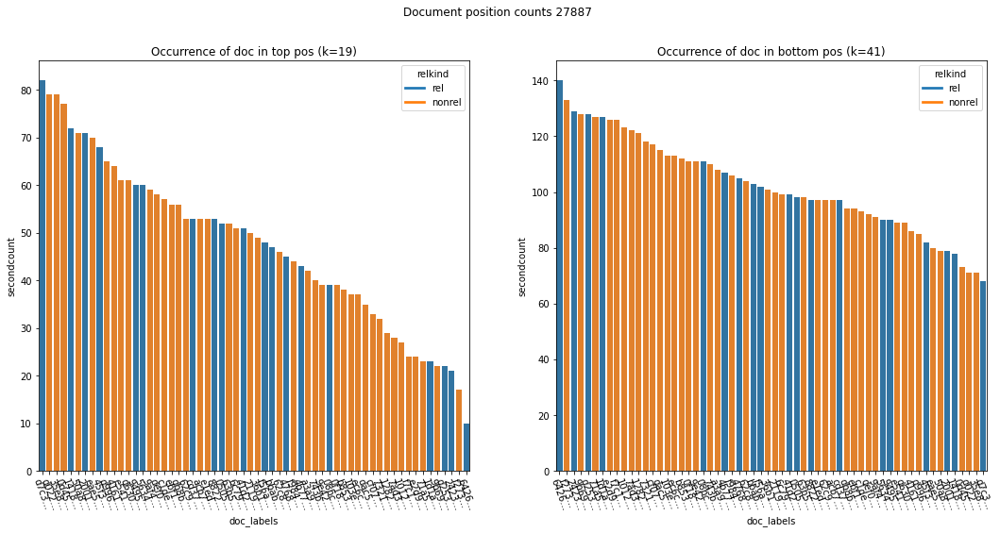

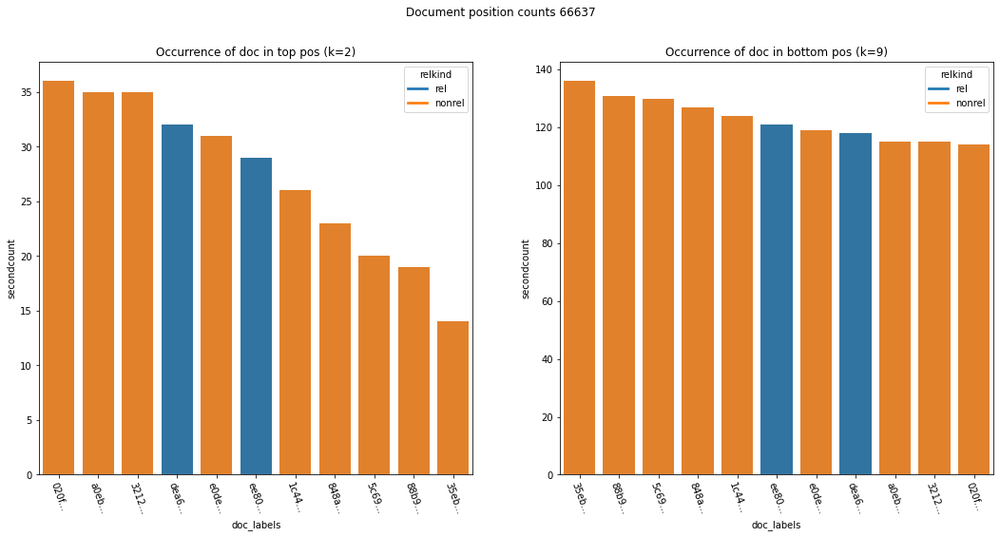

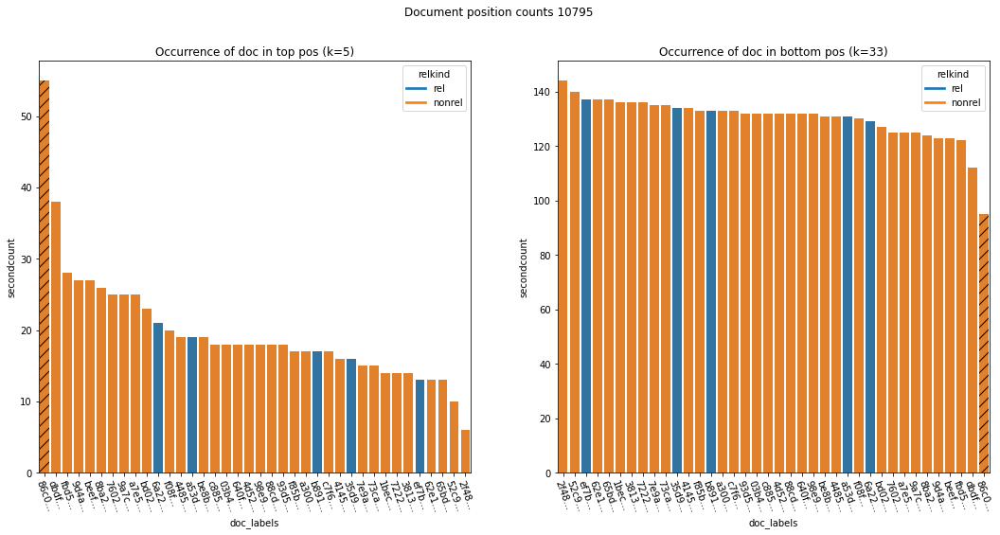

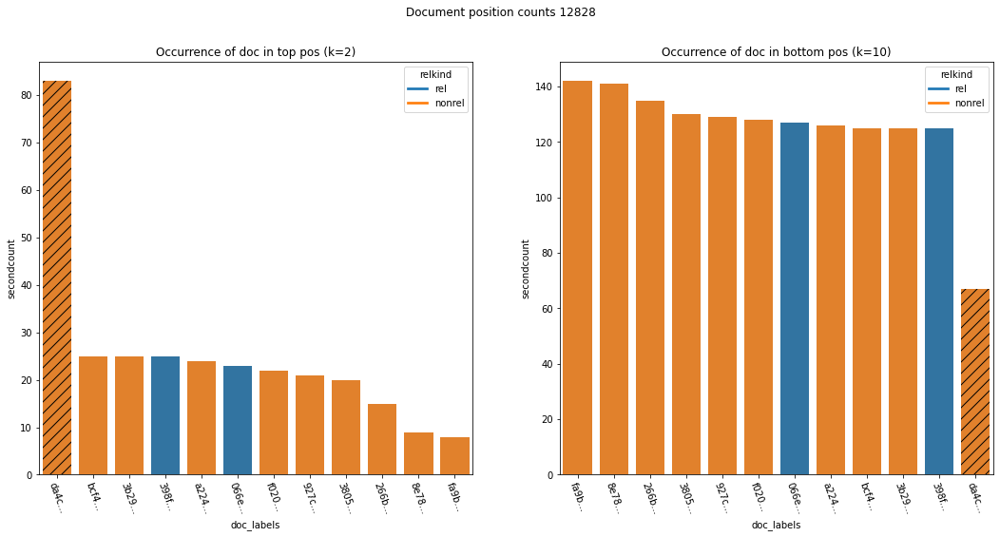

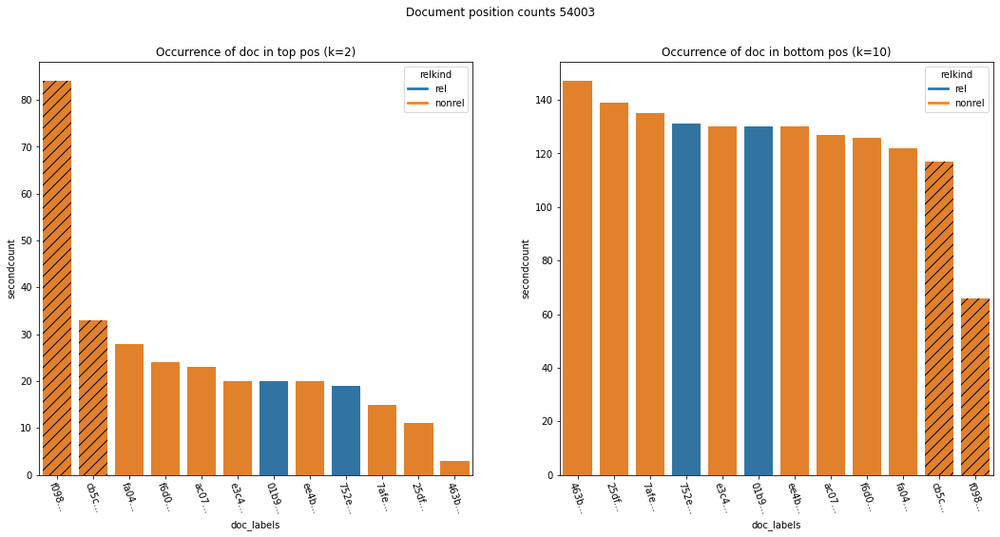

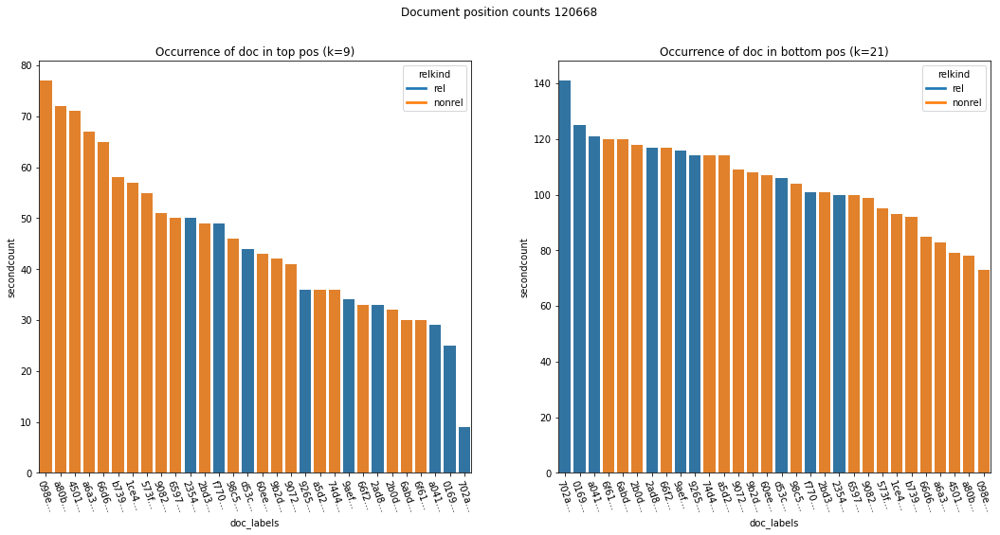

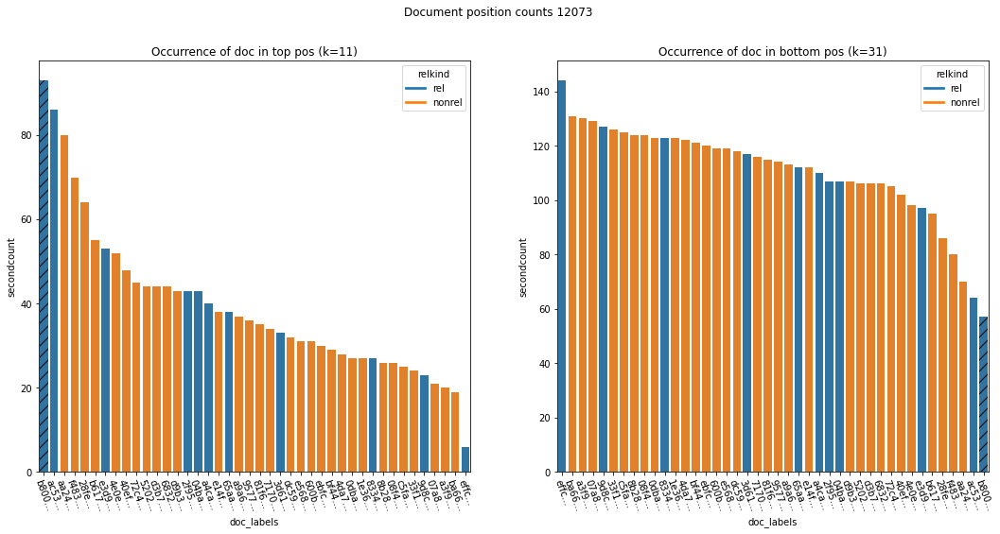

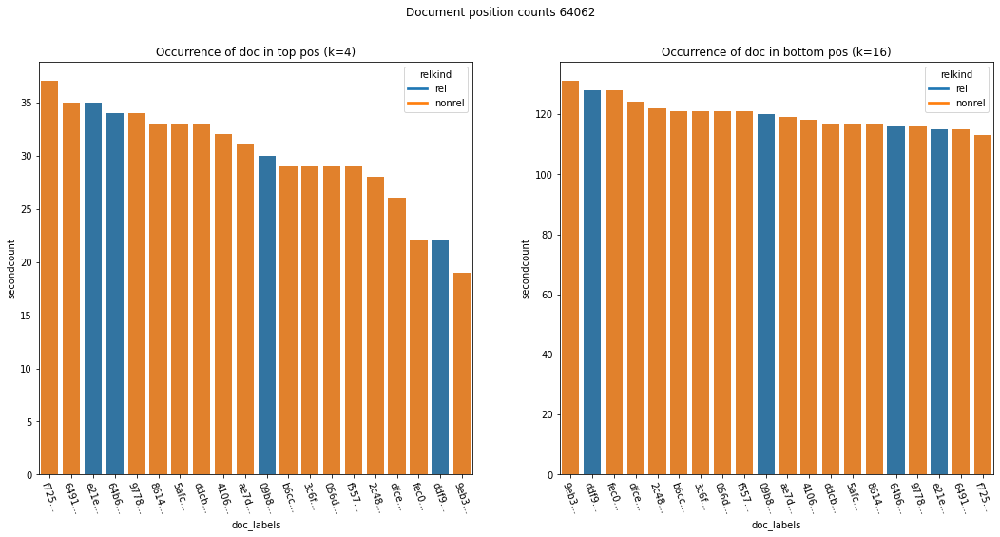

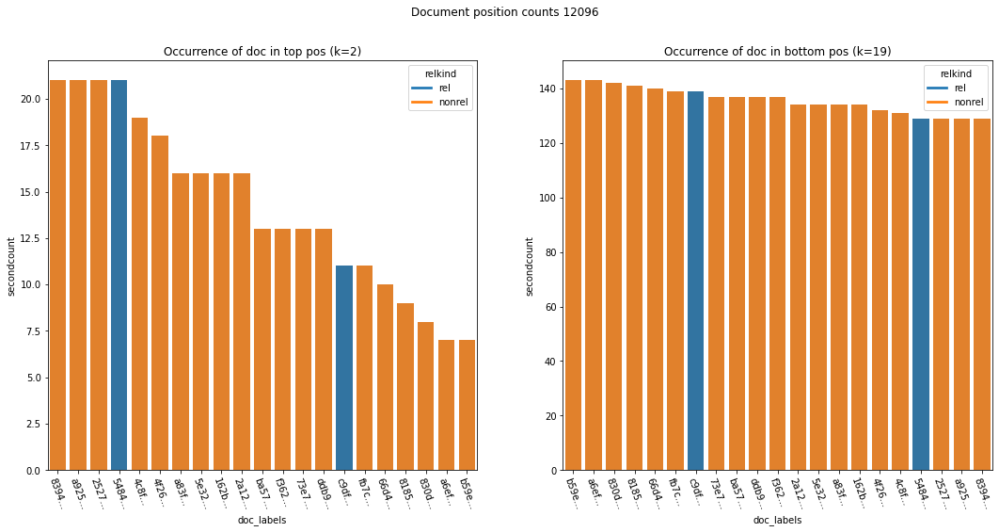

In [70]:
for i, q in enumerate(edf_ac_base_A_9.qid.to_list()):
    plot_doc_pos_count_for_qid(q,rdf_ac_base_A_9,reldf,sortby=['count'], no_author_ids=noauth_docids)
    if i == 9:
        break    

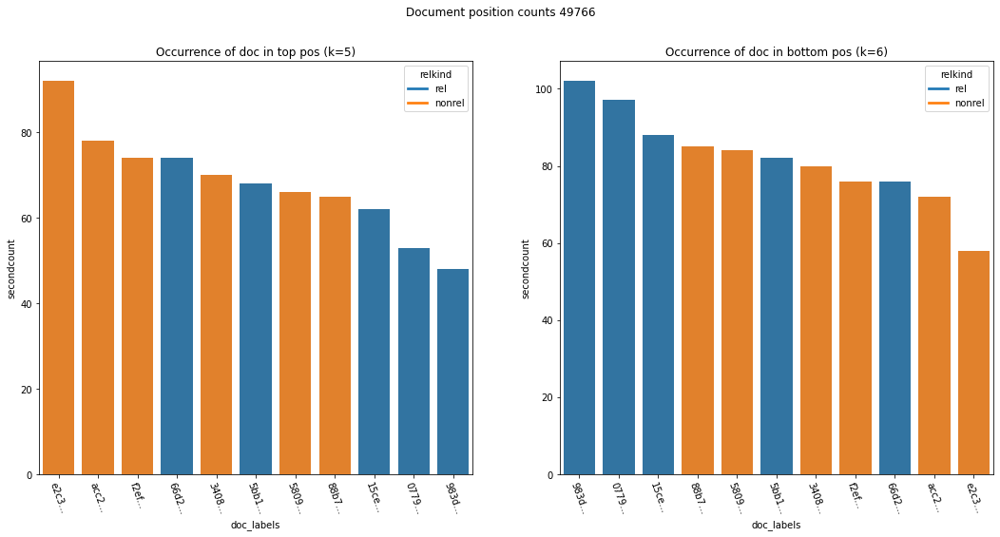

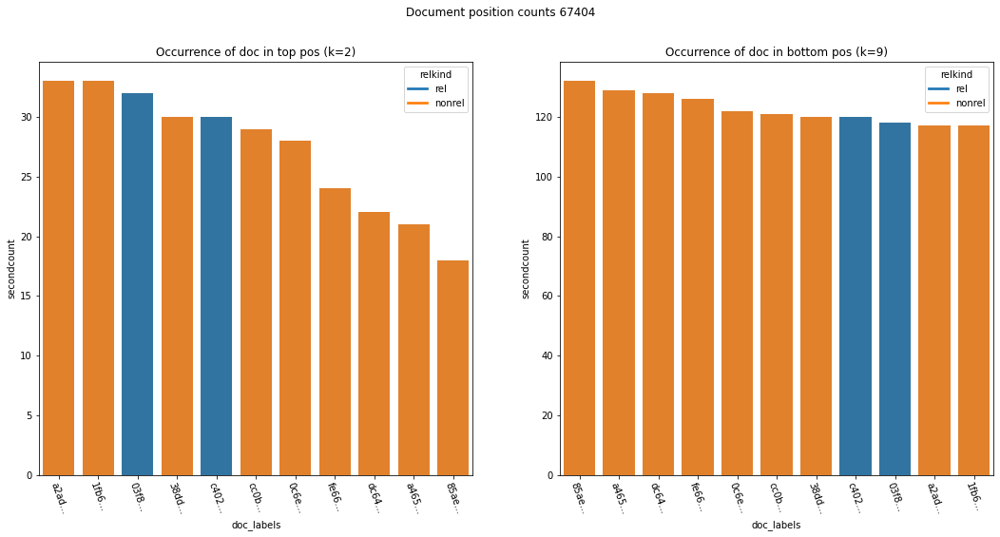

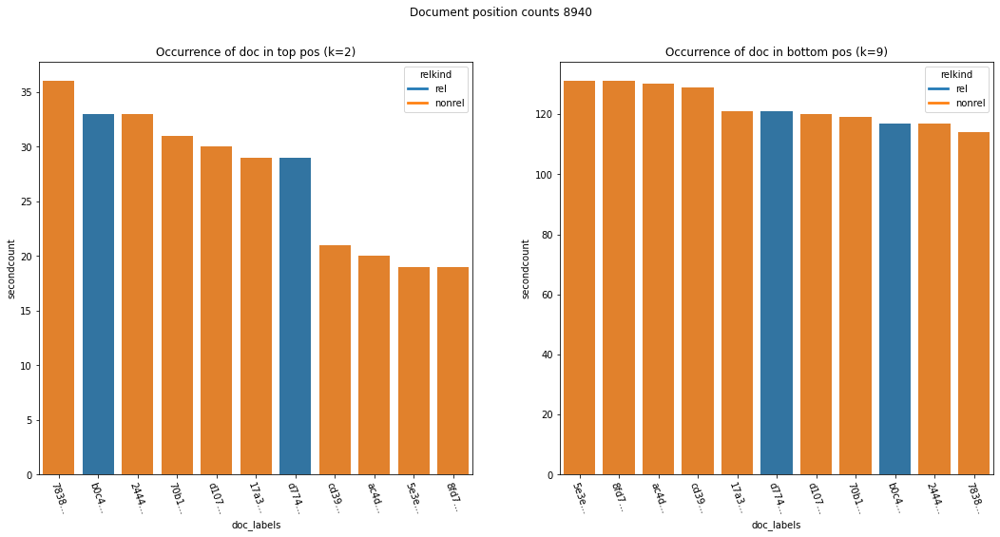

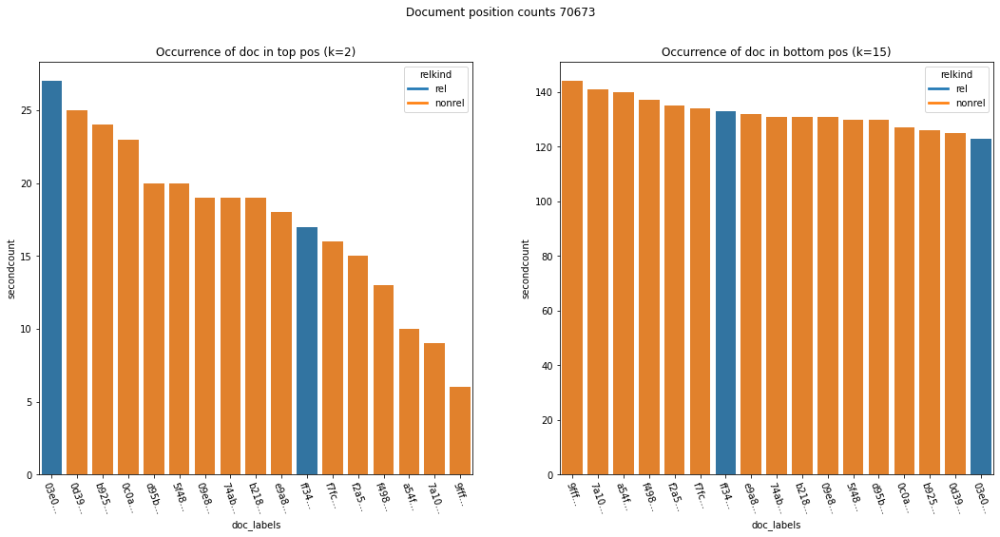

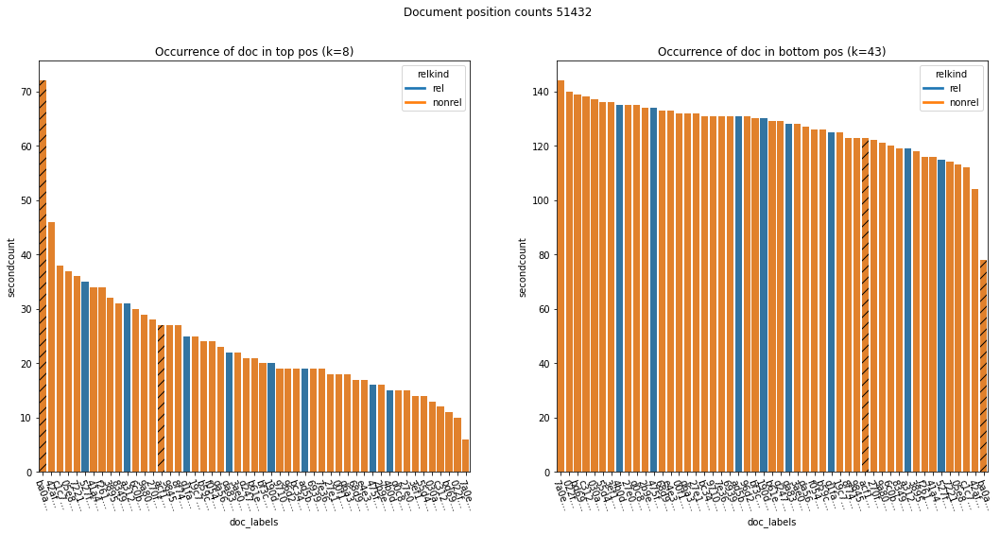

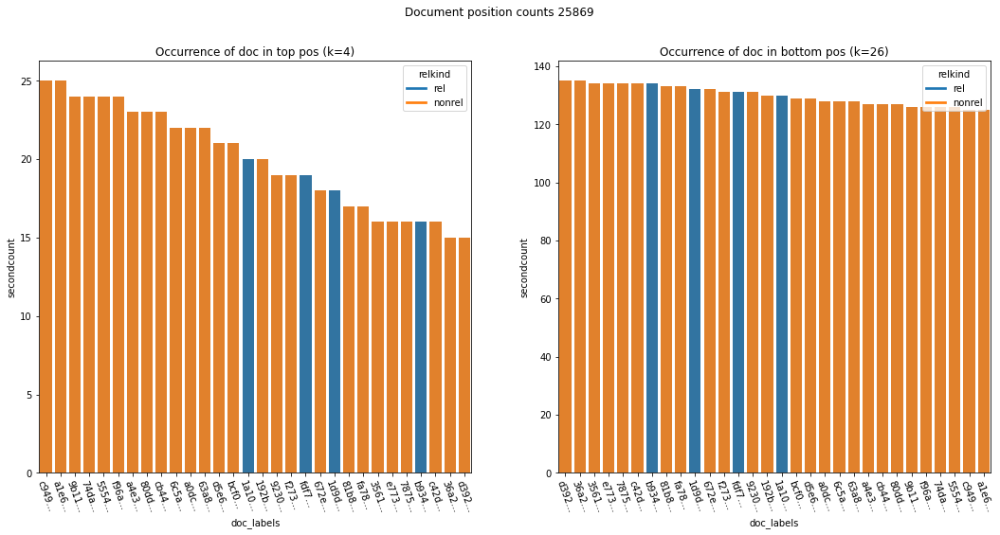

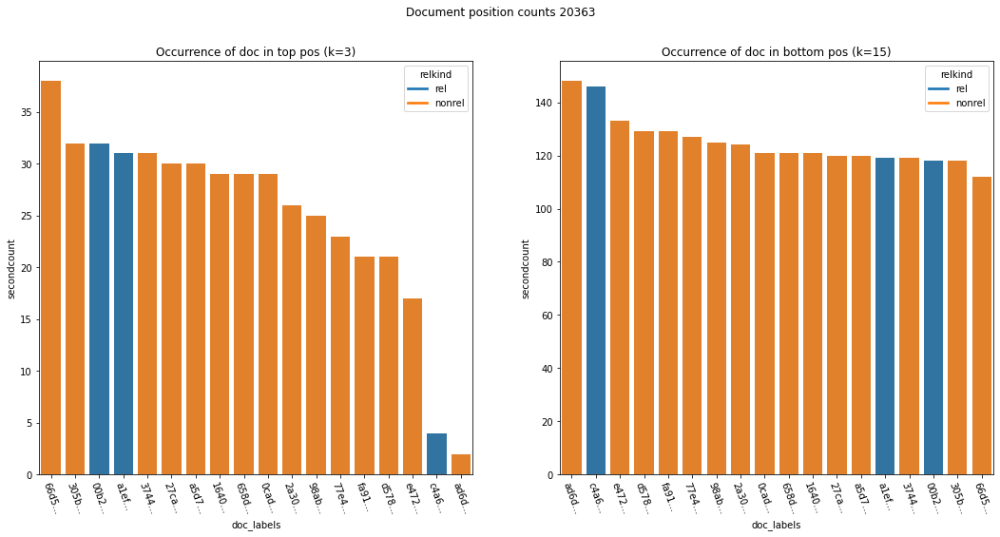

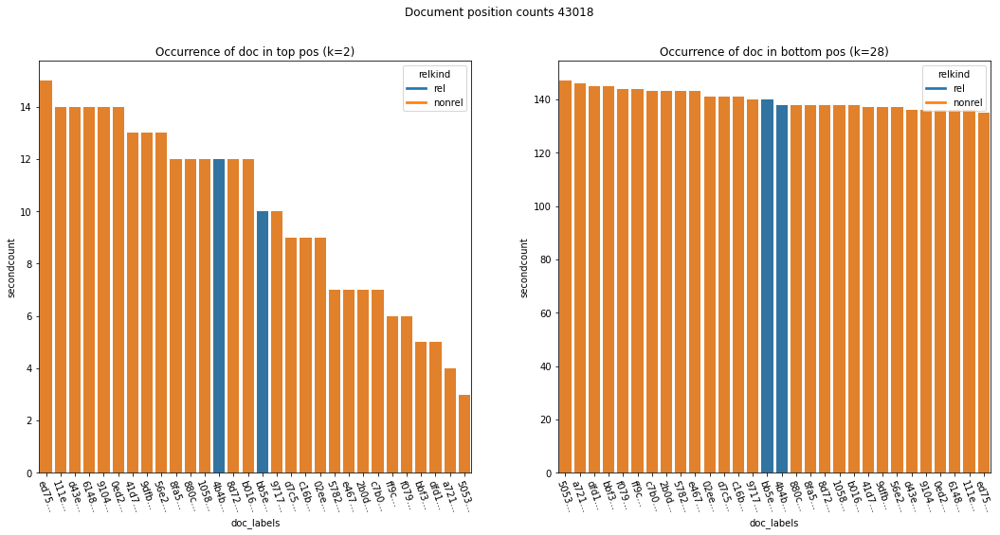

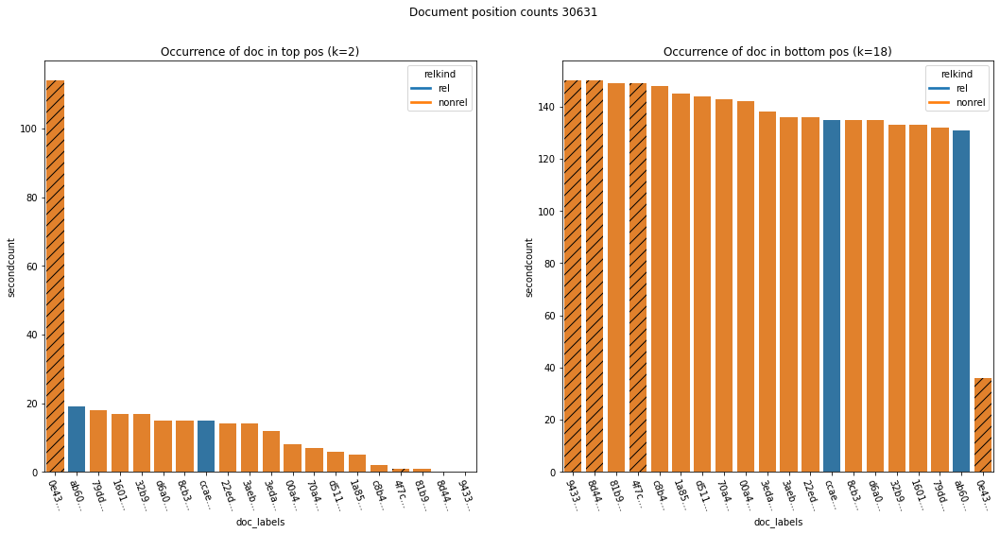

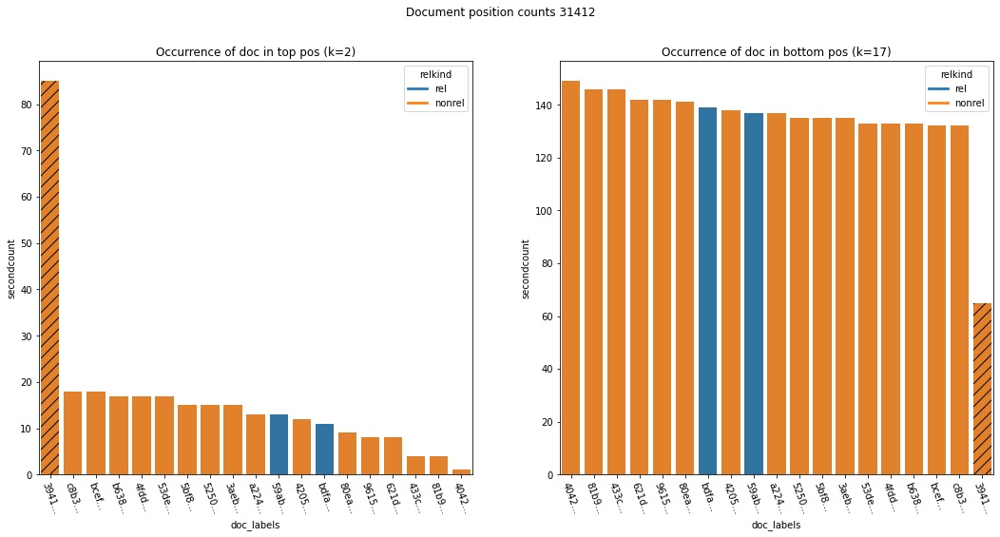

In [71]:
for i, q in enumerate(edf_ac_base_A_9.qid.to_list()):
    if i < 10:
        continue
    plot_doc_pos_count_for_qid(q,rdf_ac_base_A_9,reldf,sortby=['count'], no_author_ids=noauth_docids)

### edf_ac_base_A_99

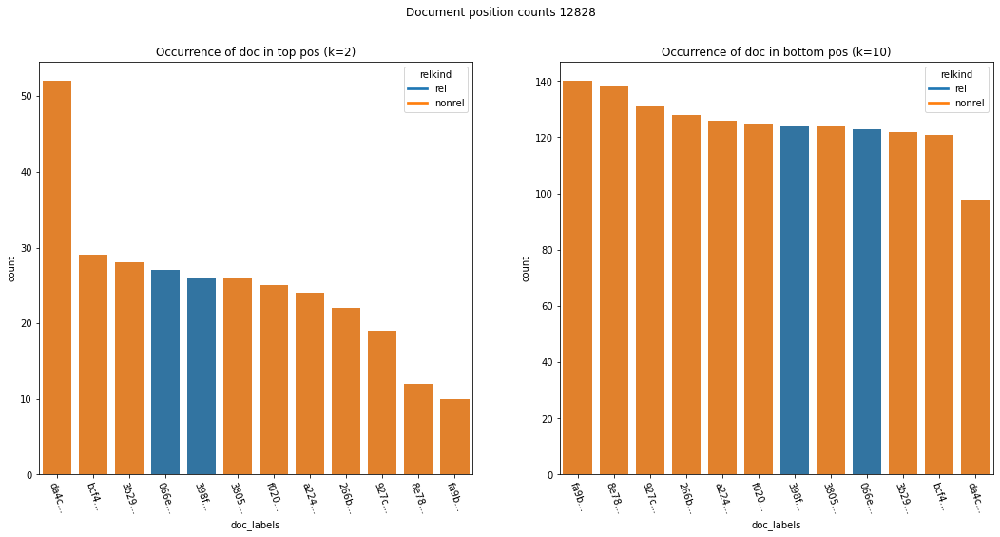

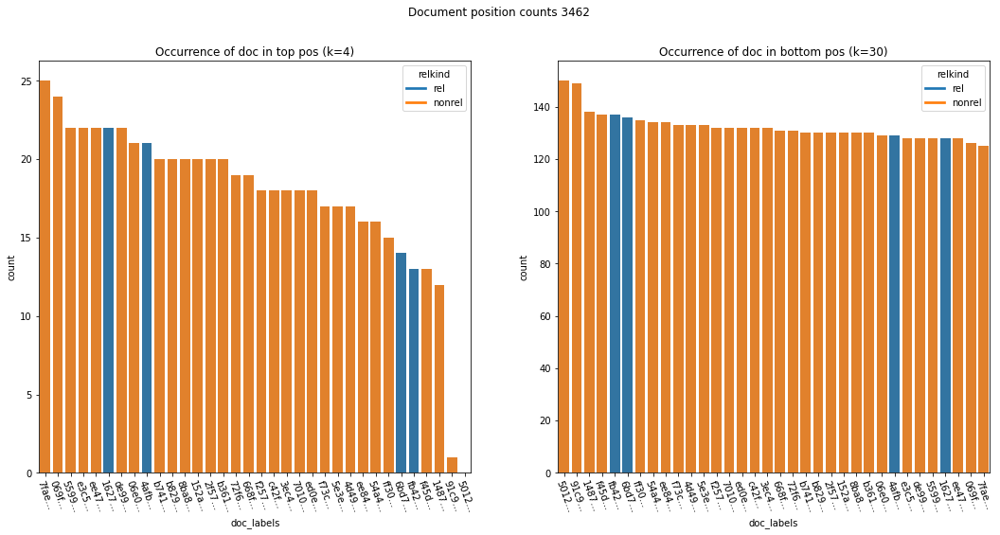

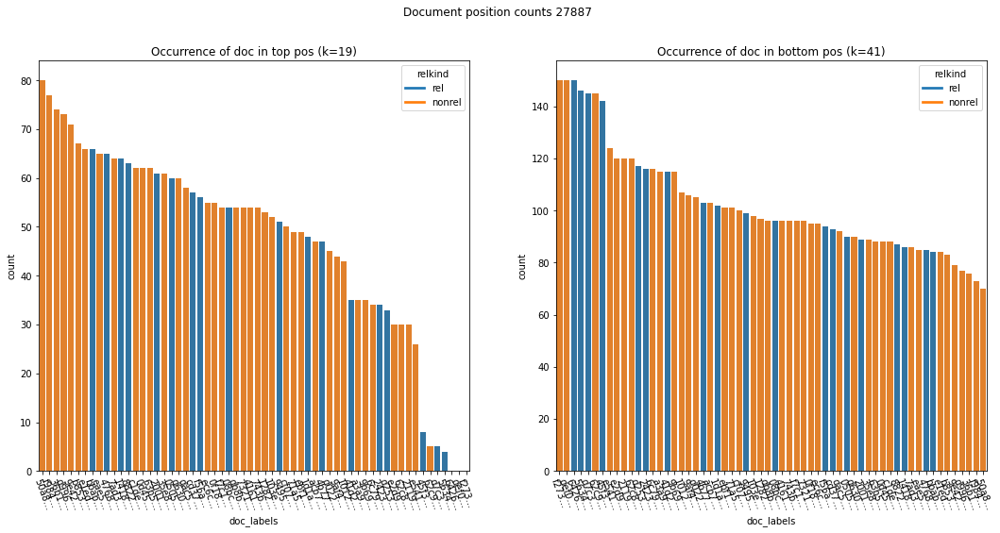

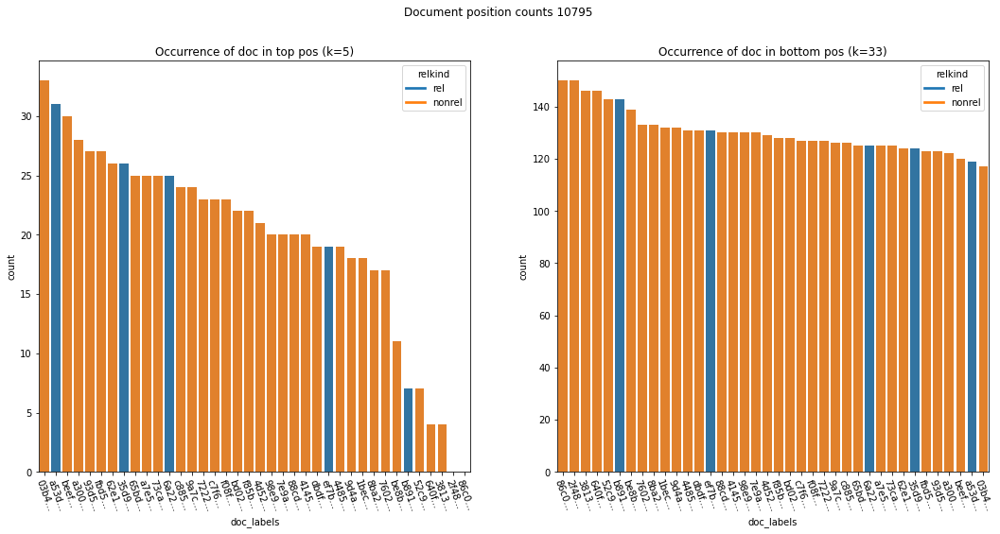

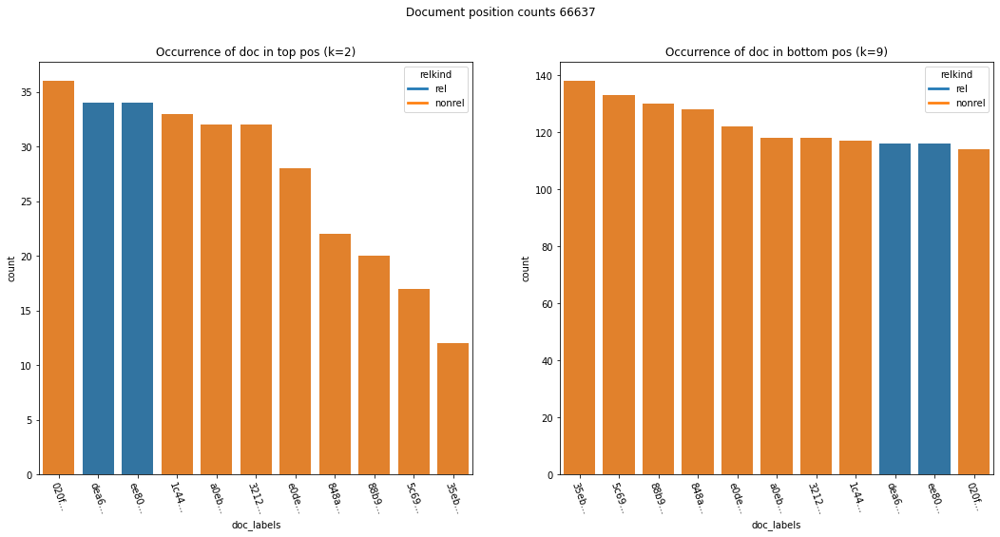

...

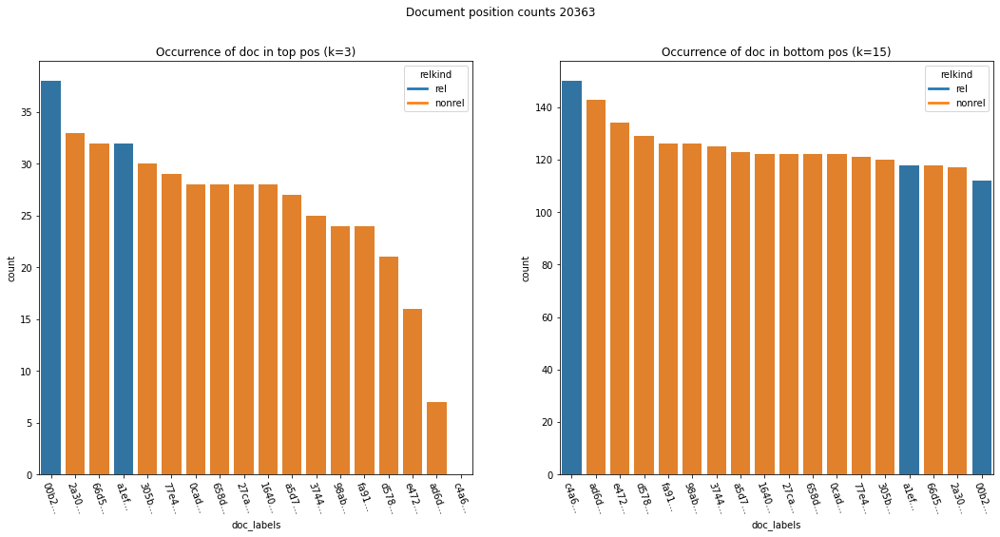

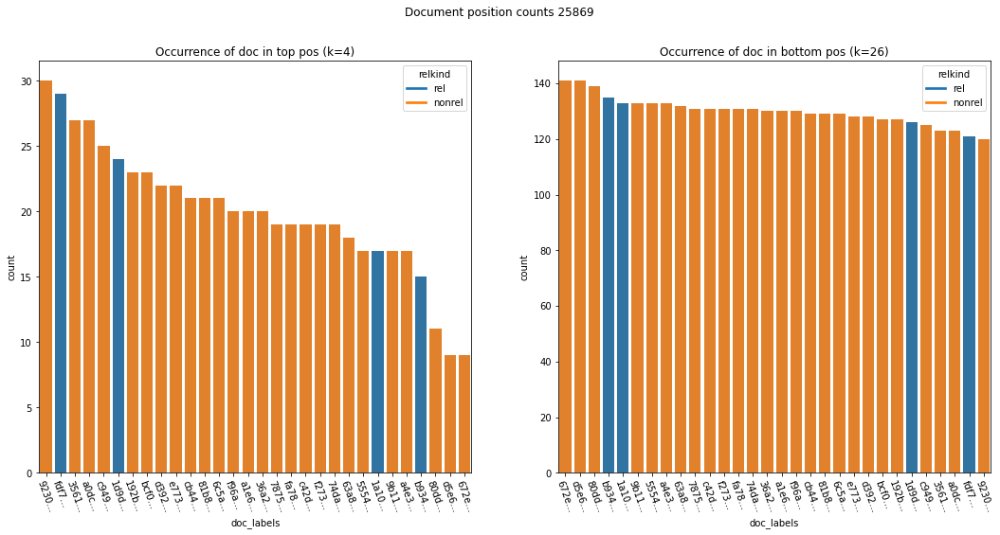

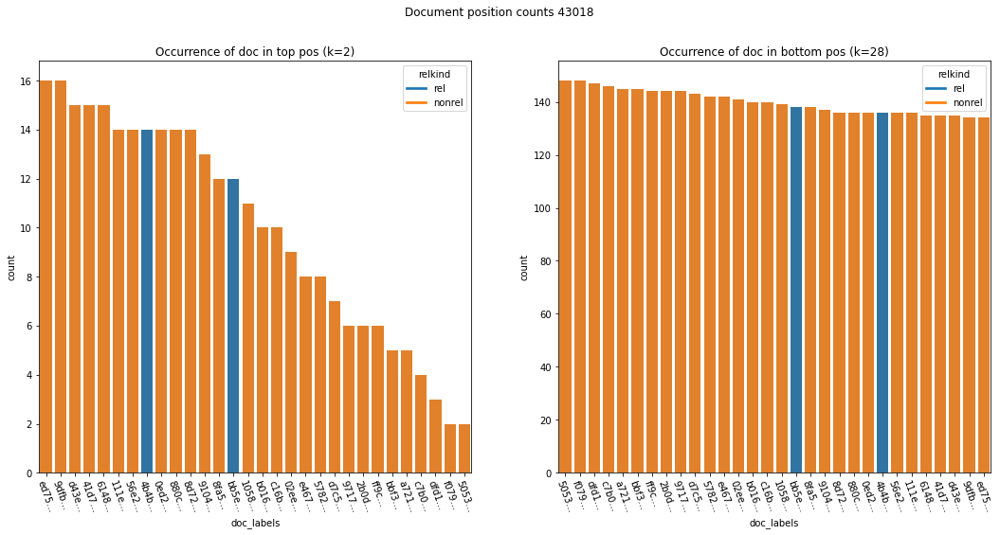

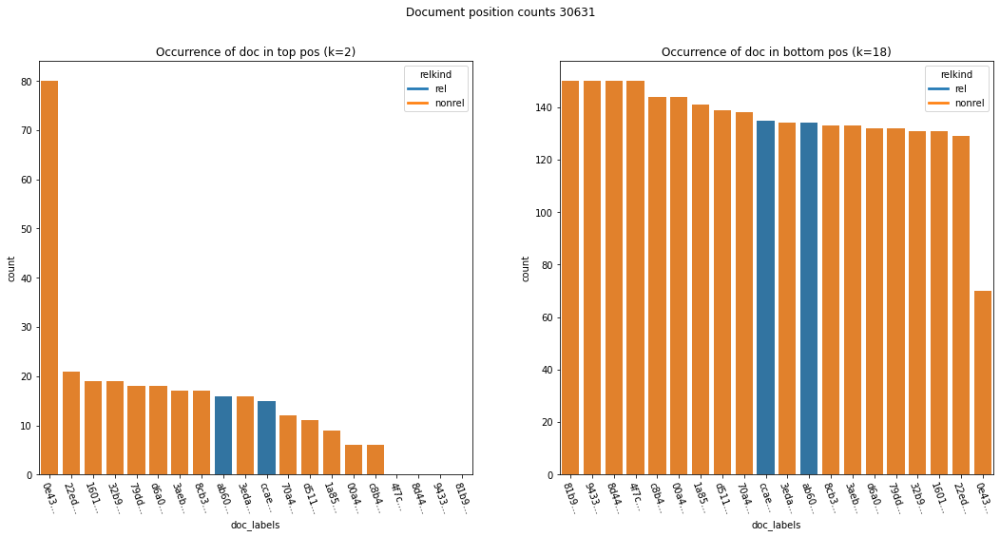

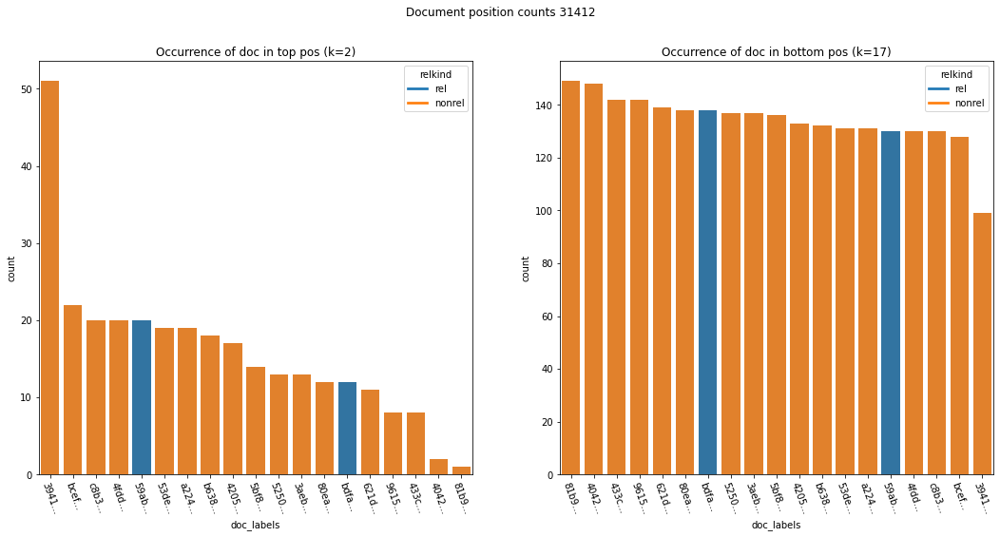

In [97]:
for q in edf_ac_base_A_99.qid.to_list():
    plot_doc_pos_count_for_qid(q,rdf_ac_base_A_99,reldf,sortby=['count'])

### edf_ac_base_B_9

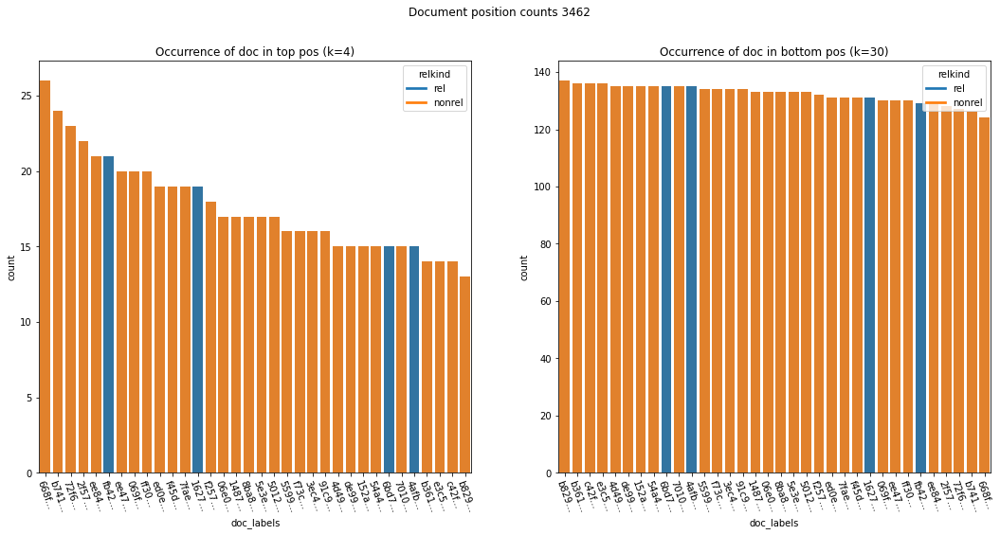

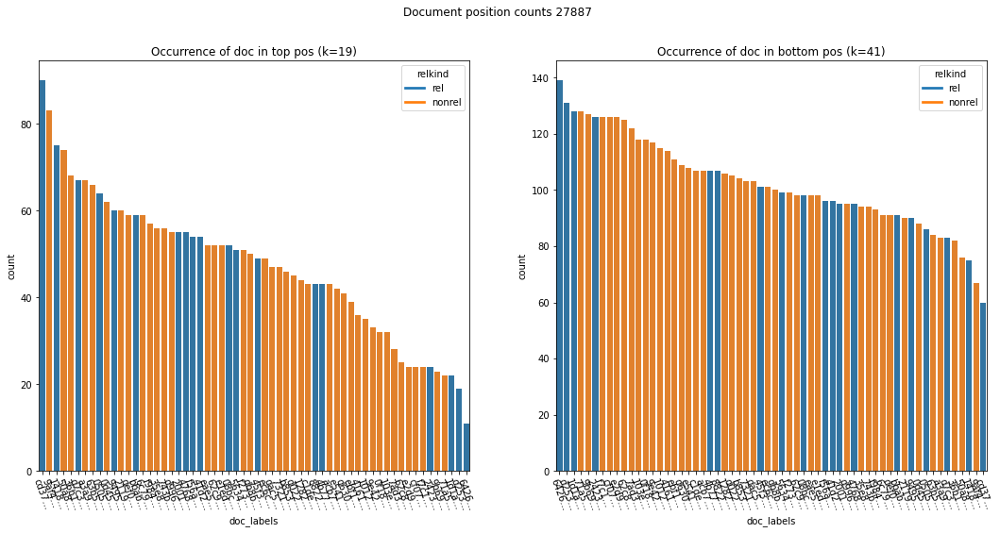

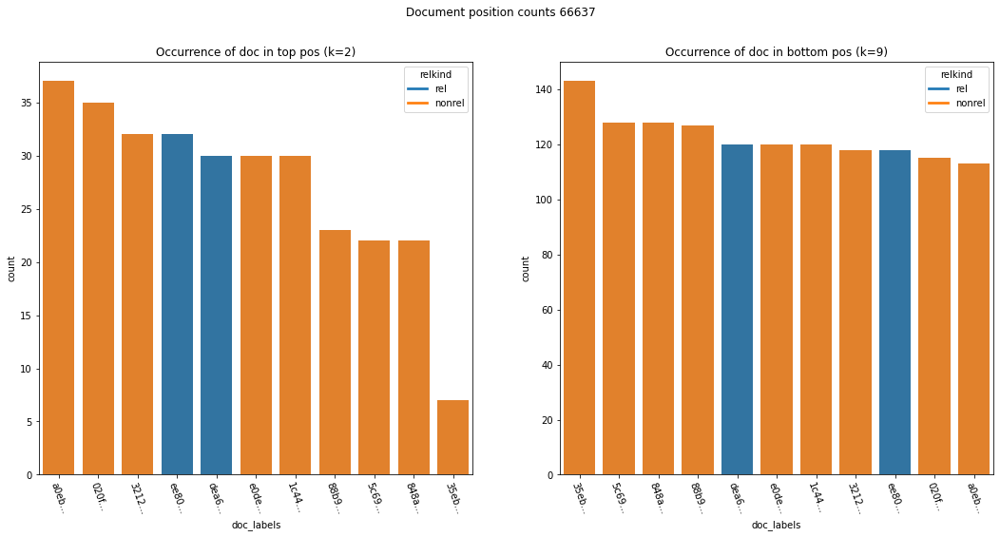

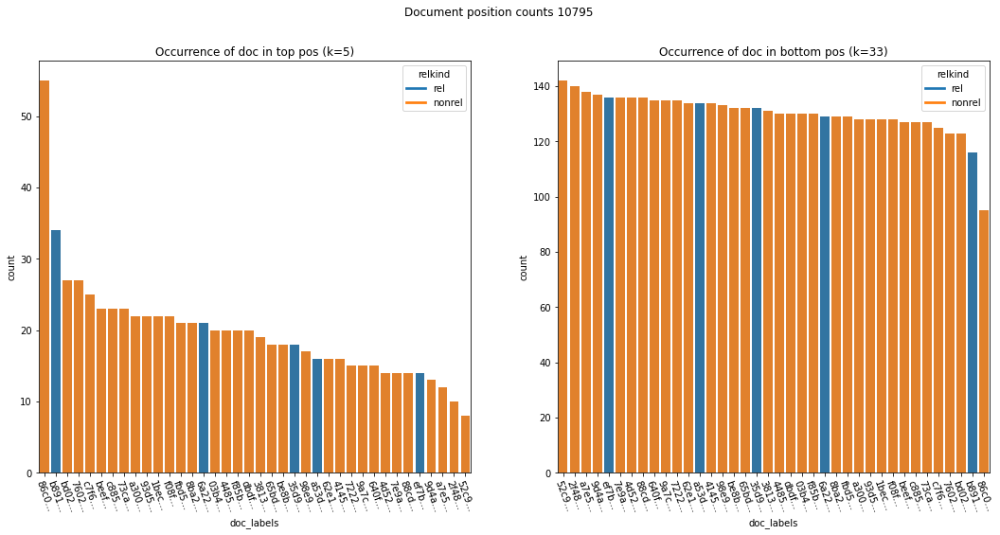

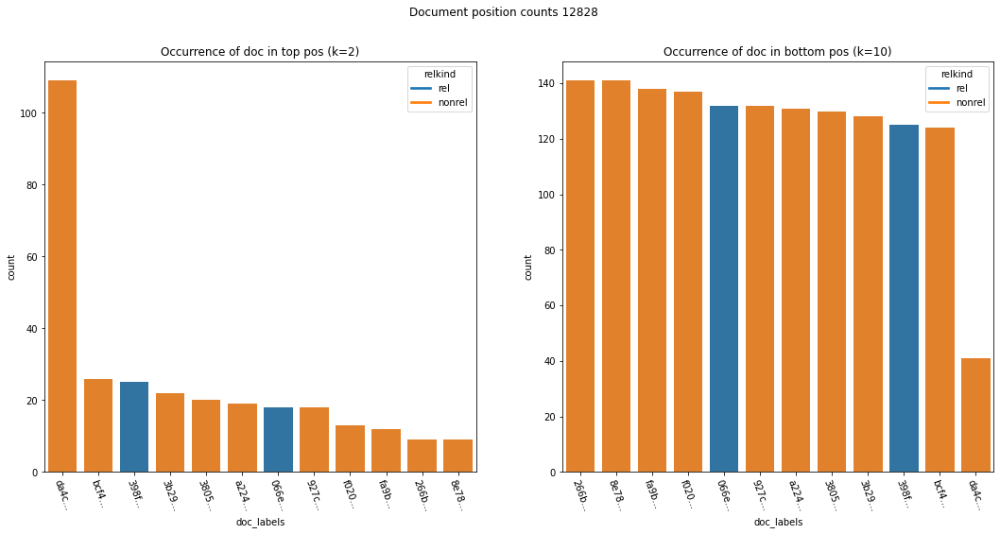

...

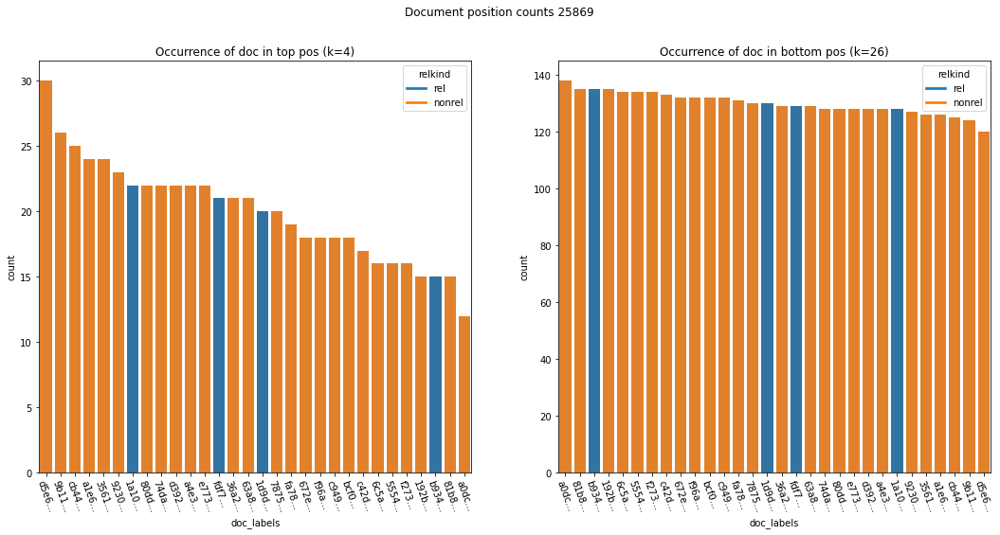

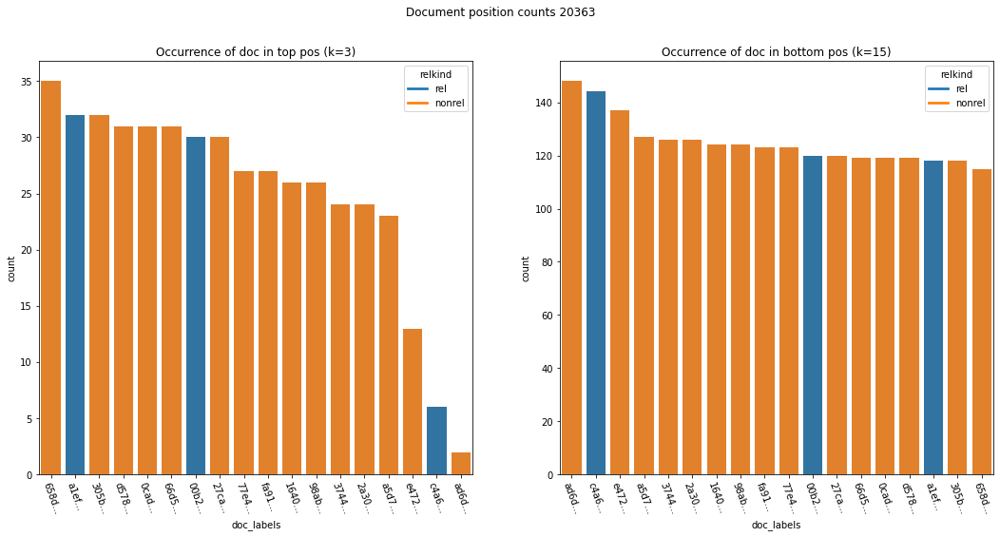

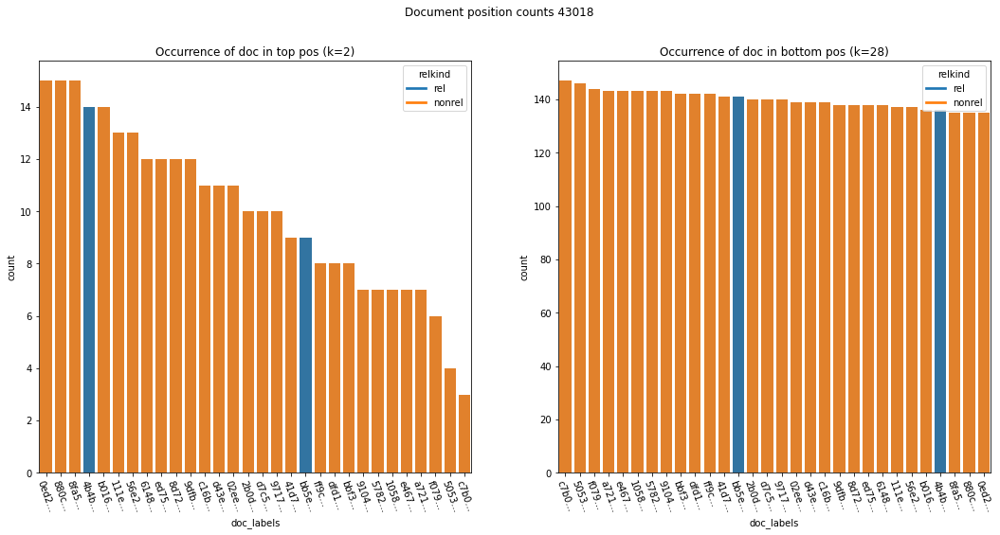

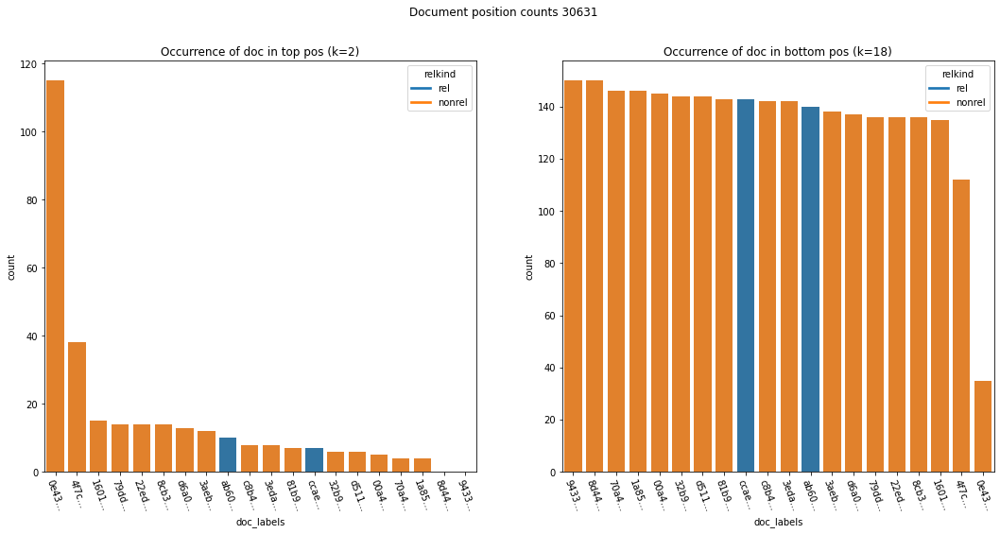

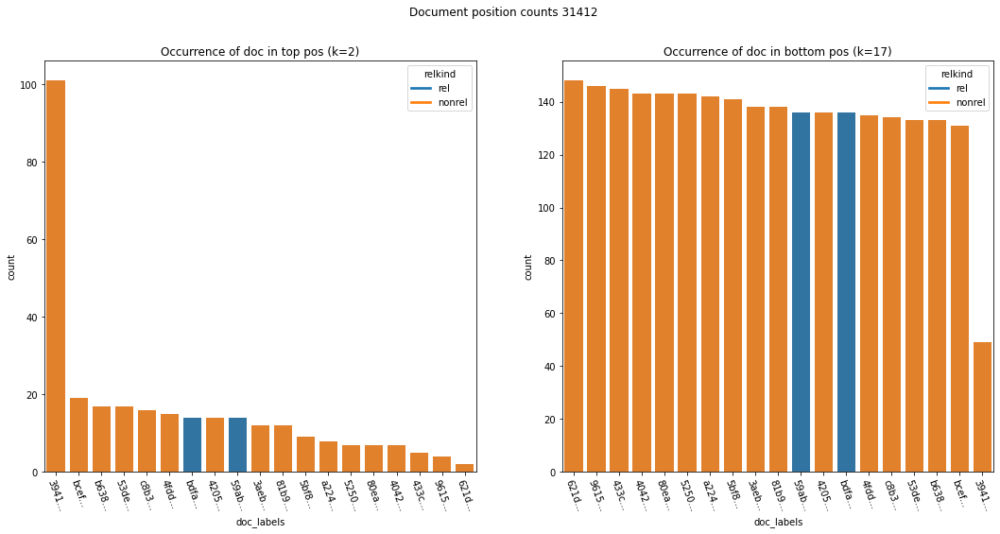

In [98]:
for q in edf_ac_base_B_9.qid.to_list():
    plot_doc_pos_count_for_qid(q,rdf_ac_base_B_9,reldf,sortby=['count'])

### edf_ac_base_B_99

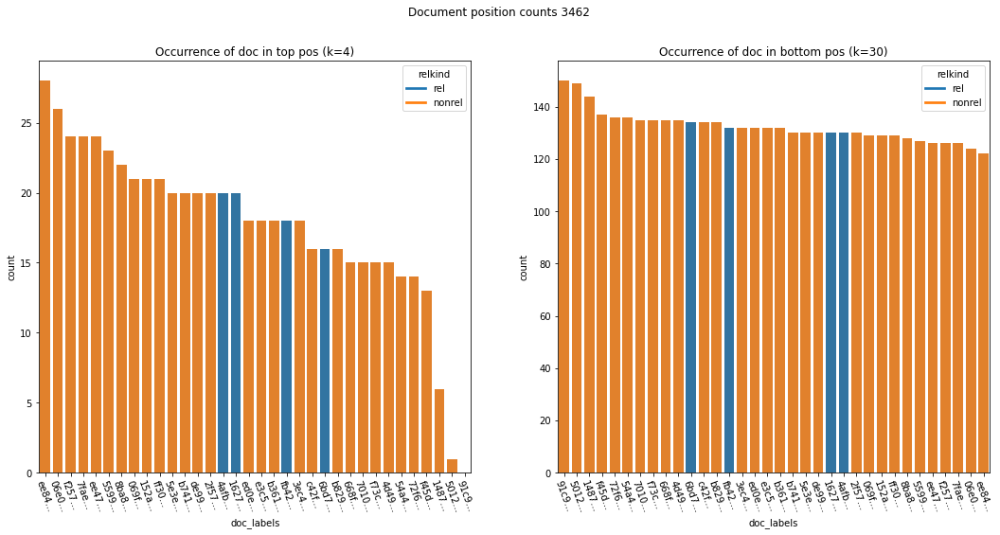

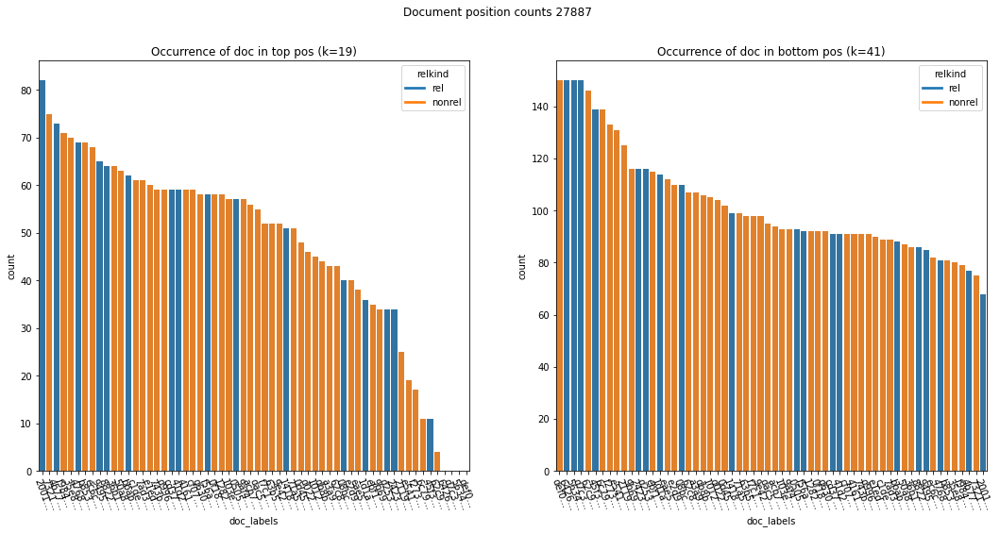

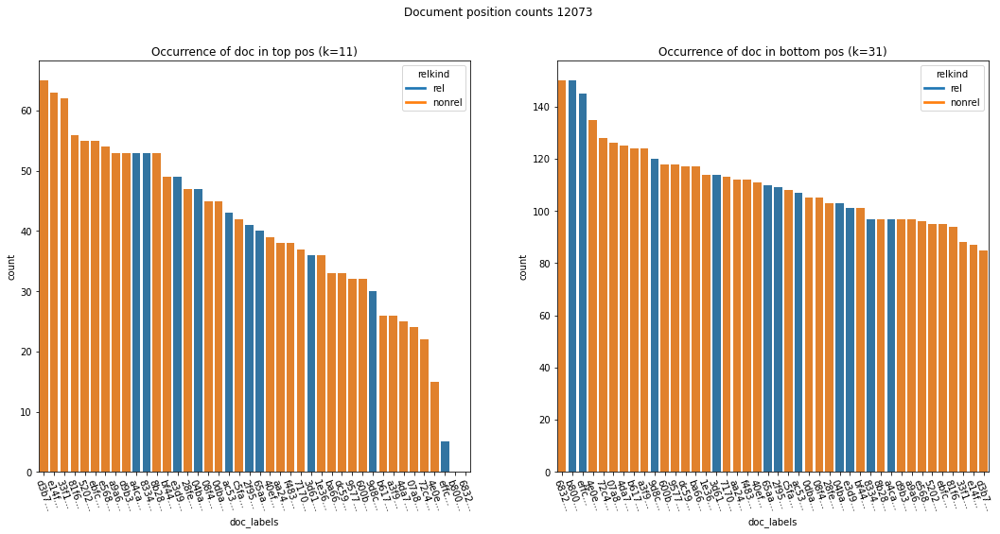

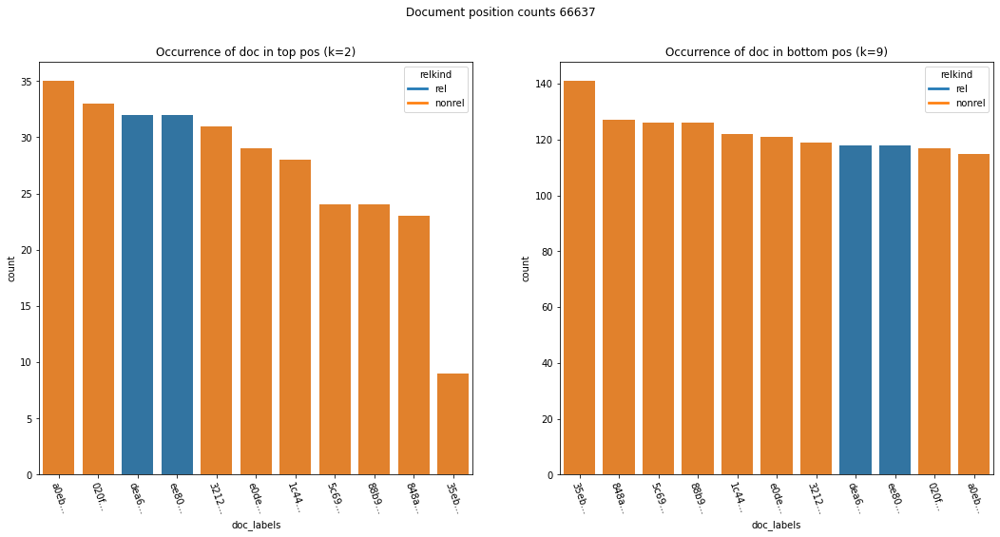

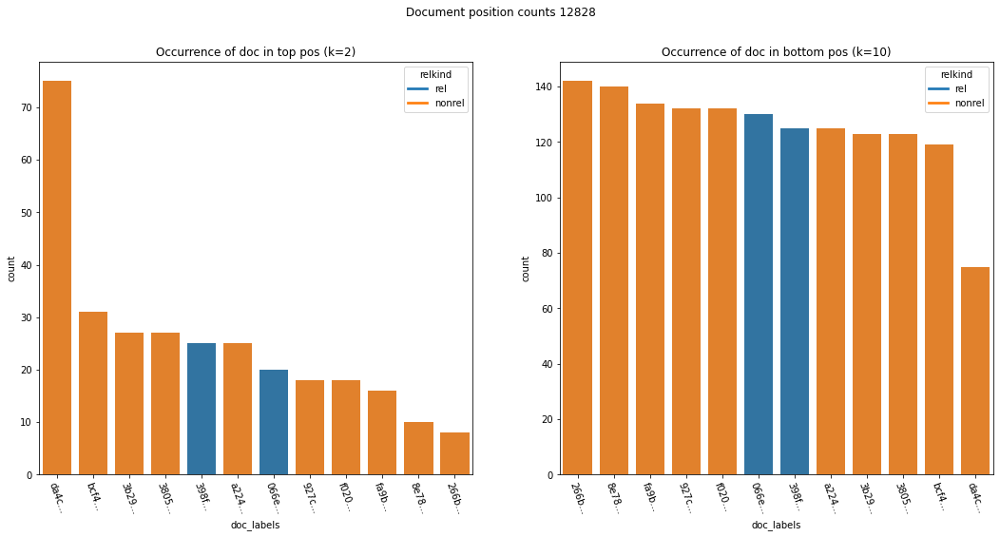

...

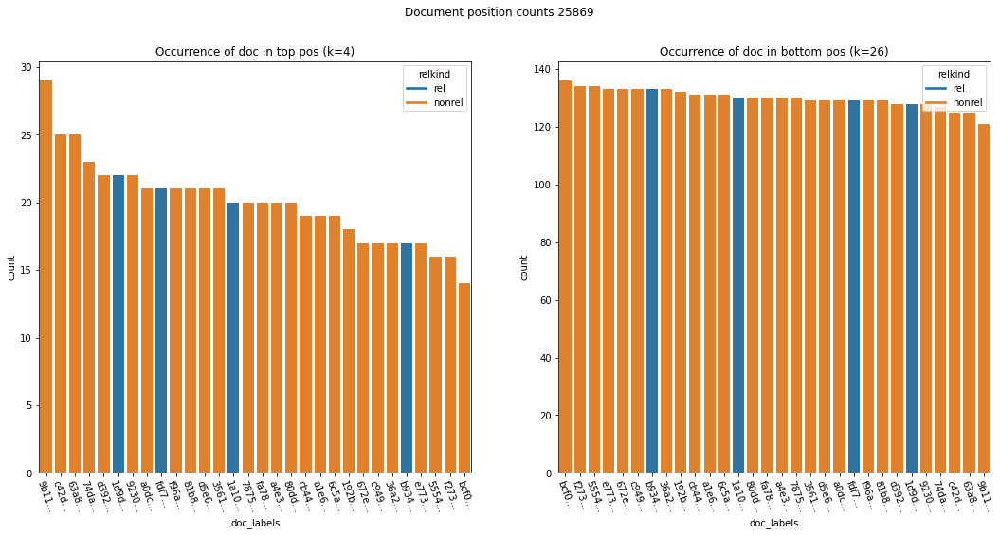

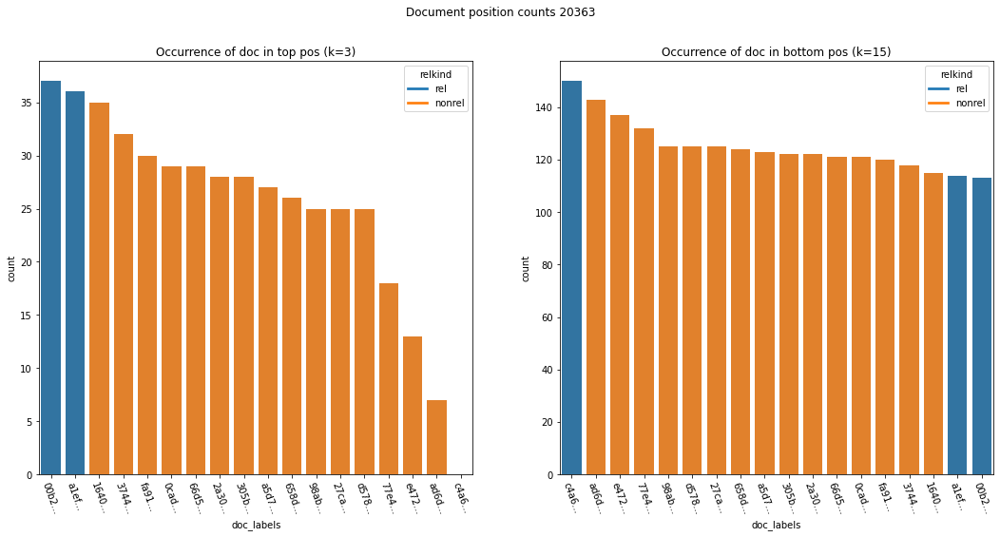

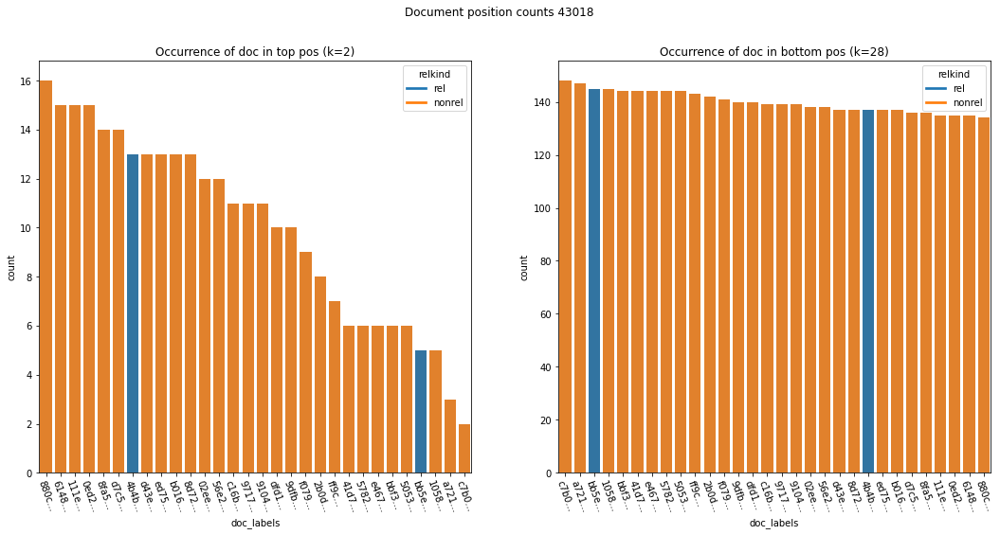

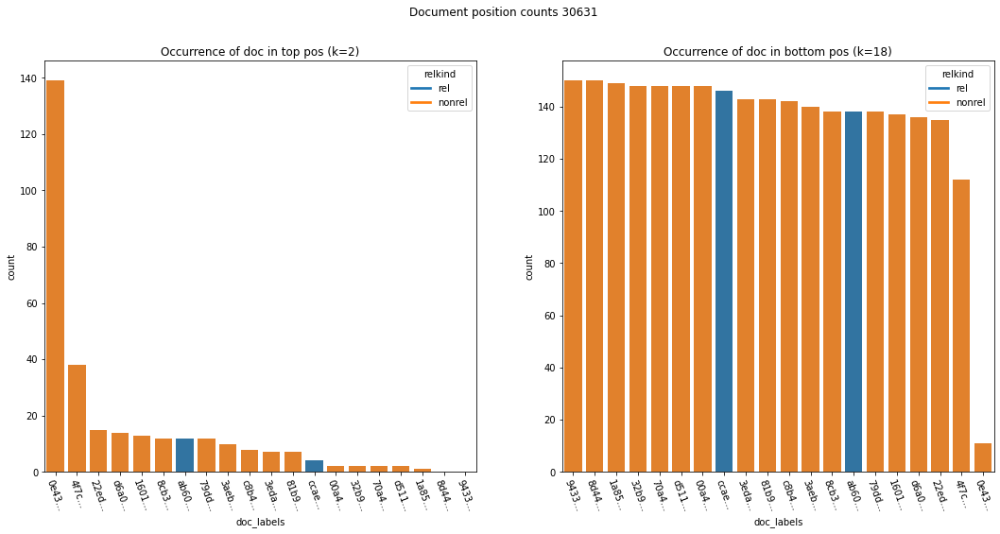

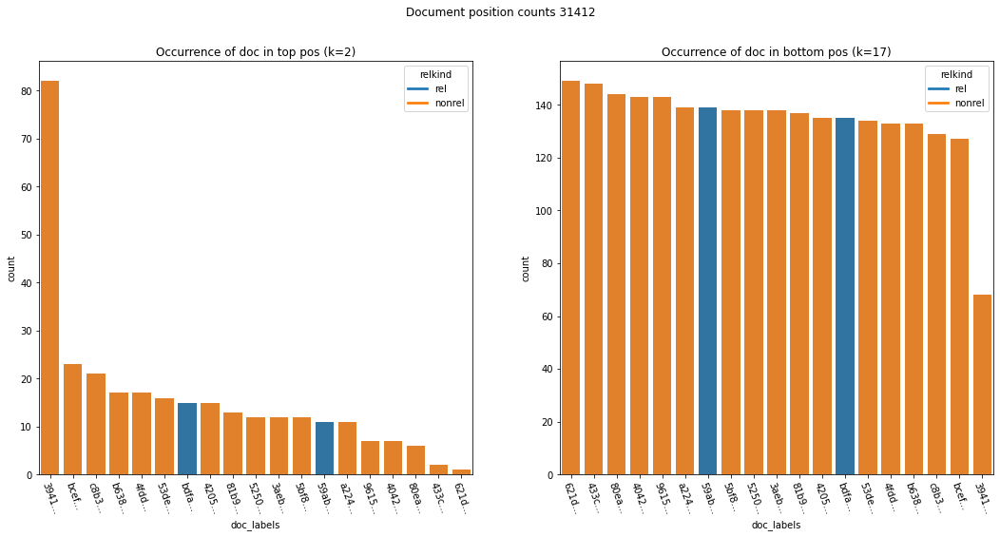

In [99]:
for q in edf_ac_base_B_99.qid.to_list():
    plot_doc_pos_count_for_qid(q,rdf_ac_base_B_99,reldf,sortby=['count'])

### edf_lm_base

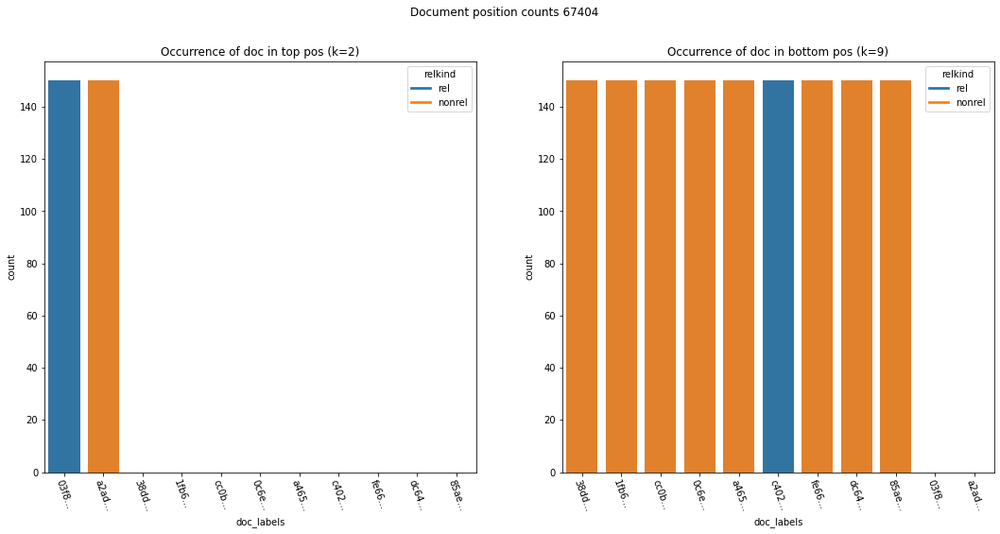

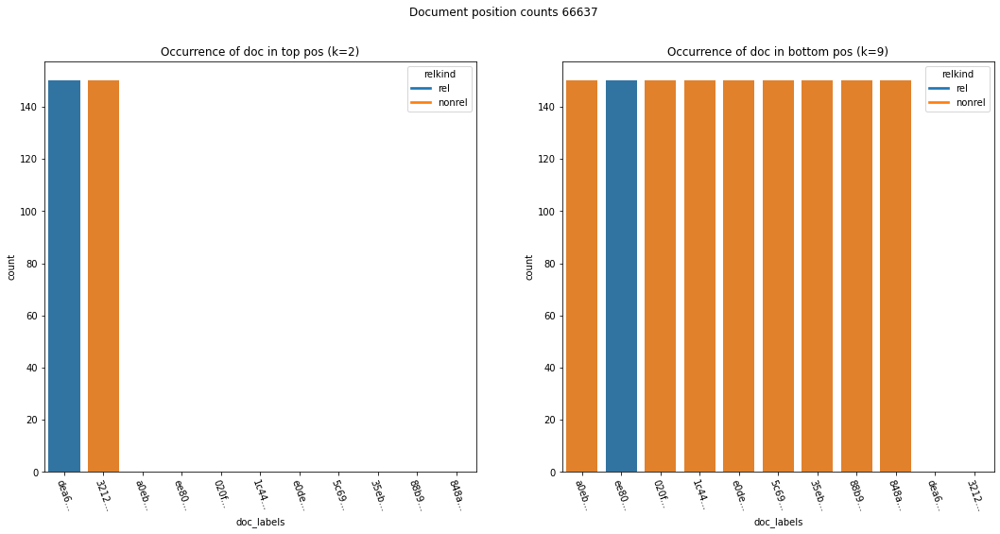

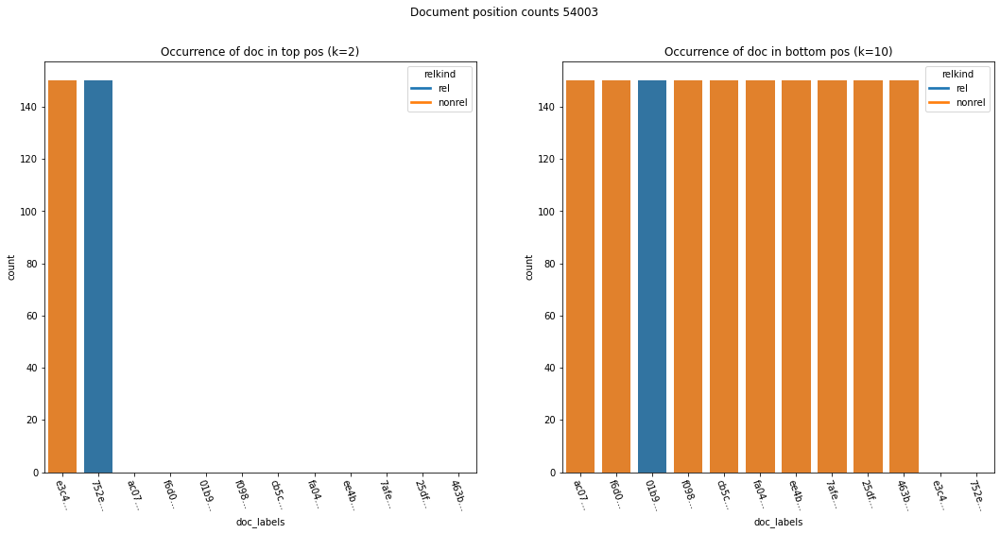

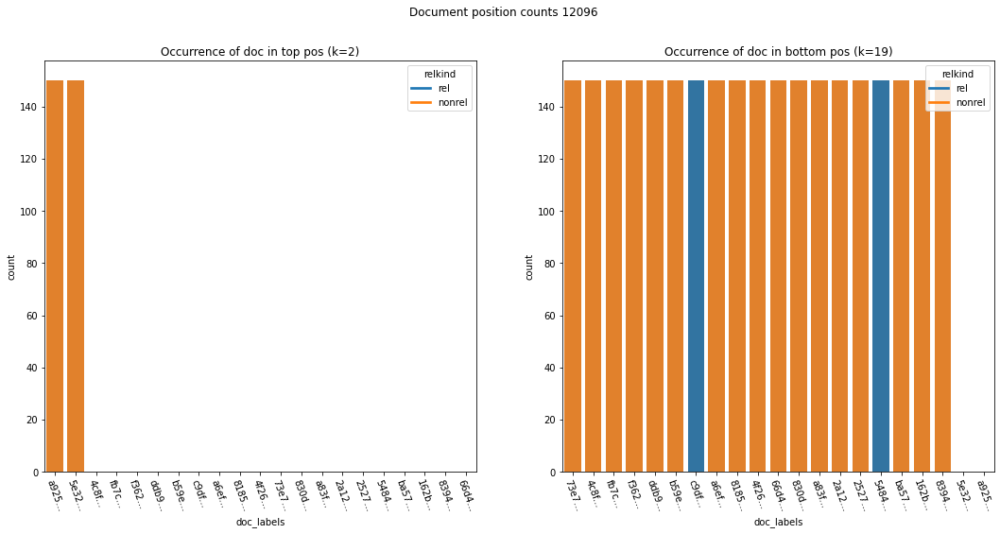

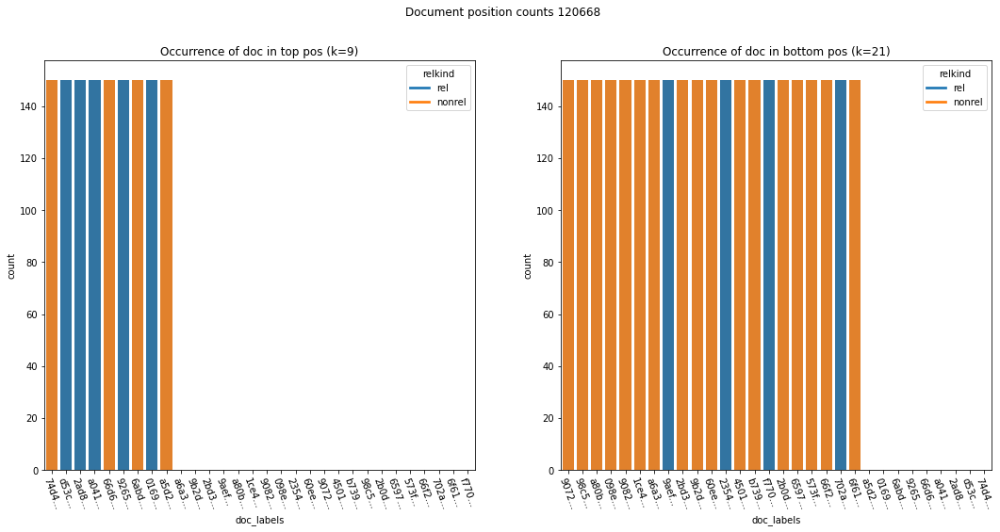

...

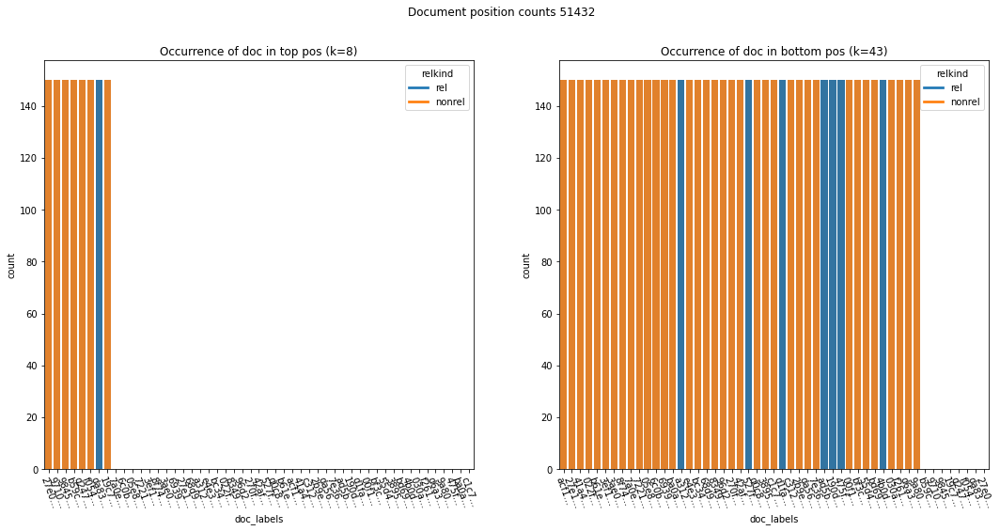

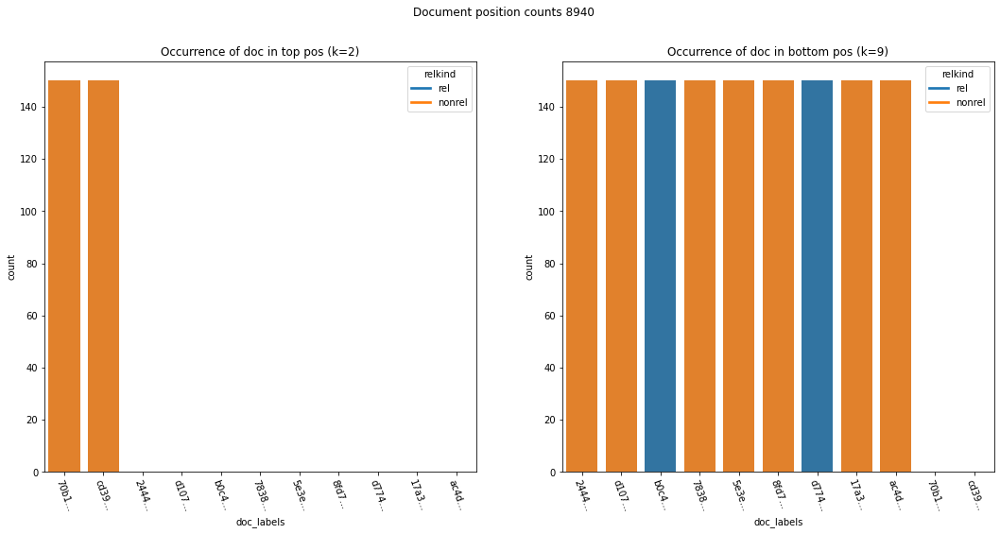

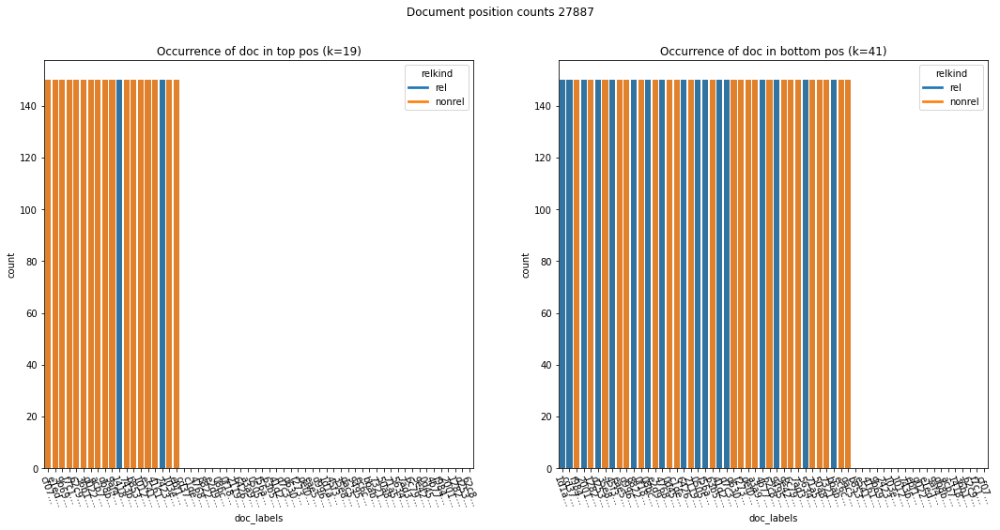

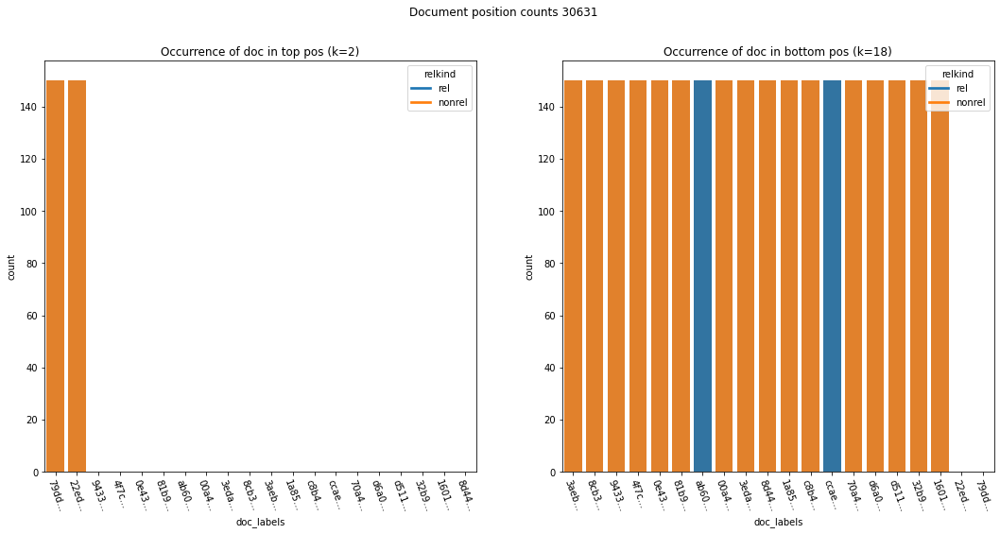

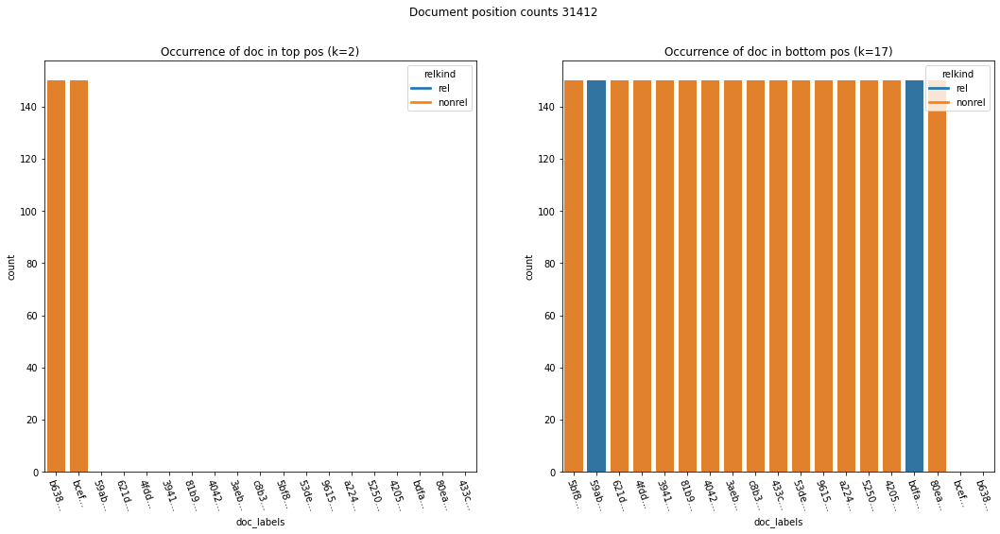

In [158]:
for q in edf_lm_base.qid.to_list():
    plot_doc_pos_count_for_qid(q,rdf_lm_base,reldf,sortby=['count'])

### All

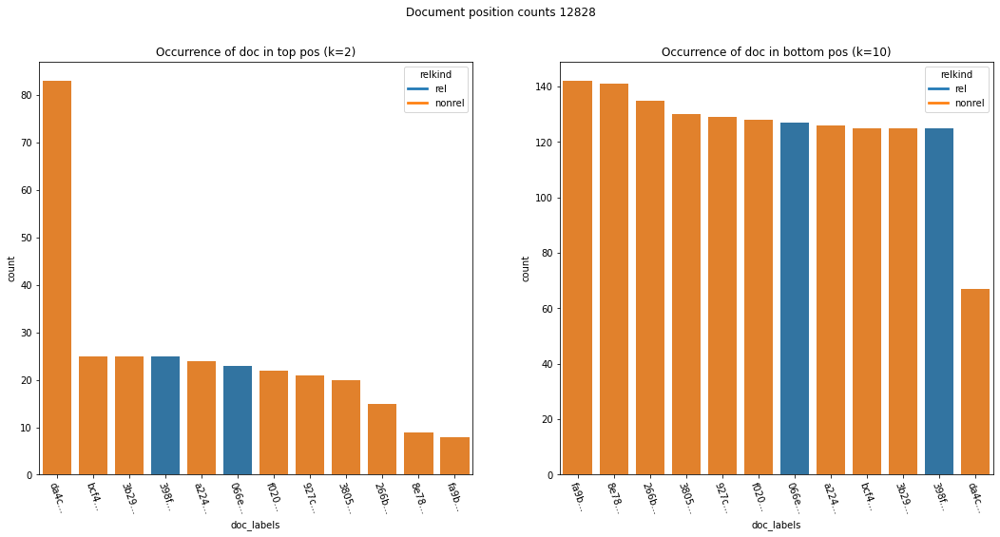

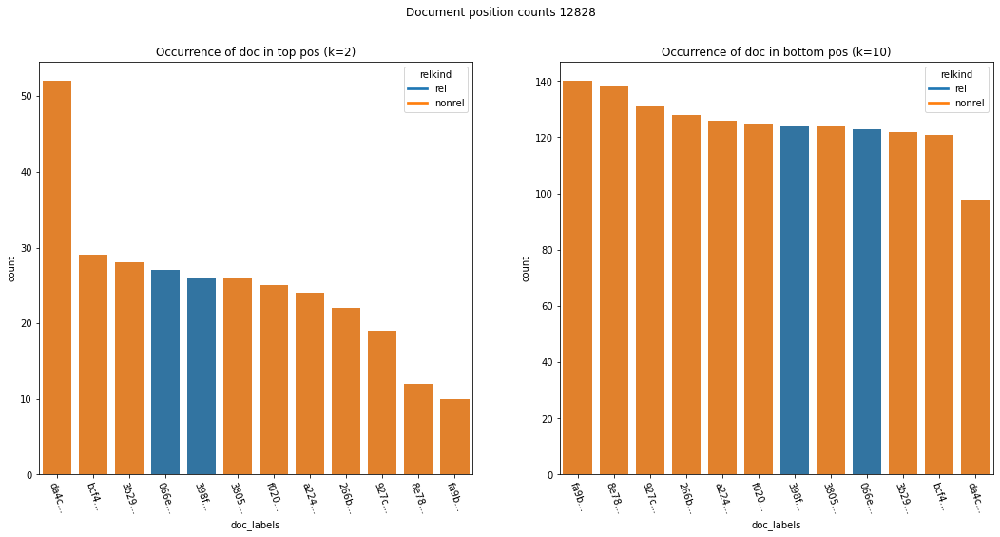

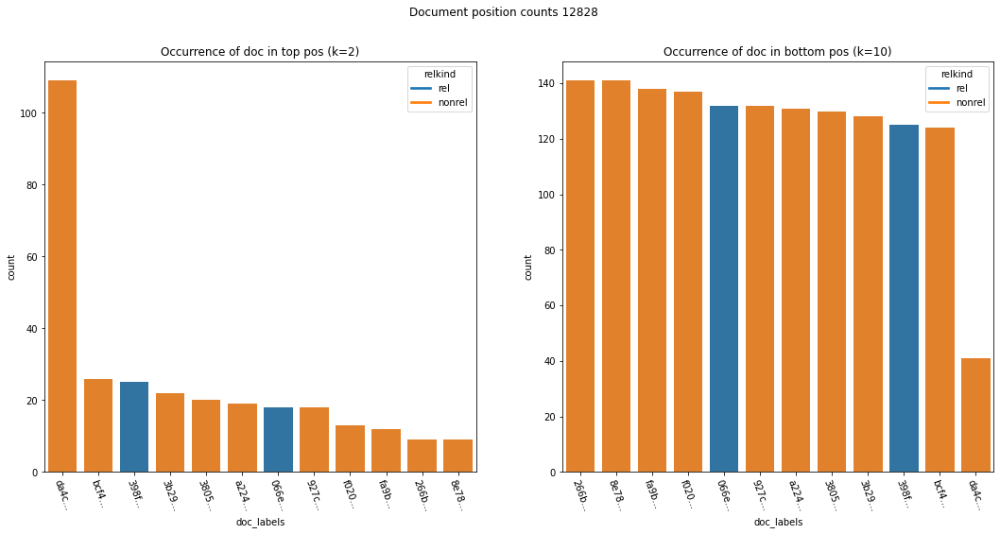

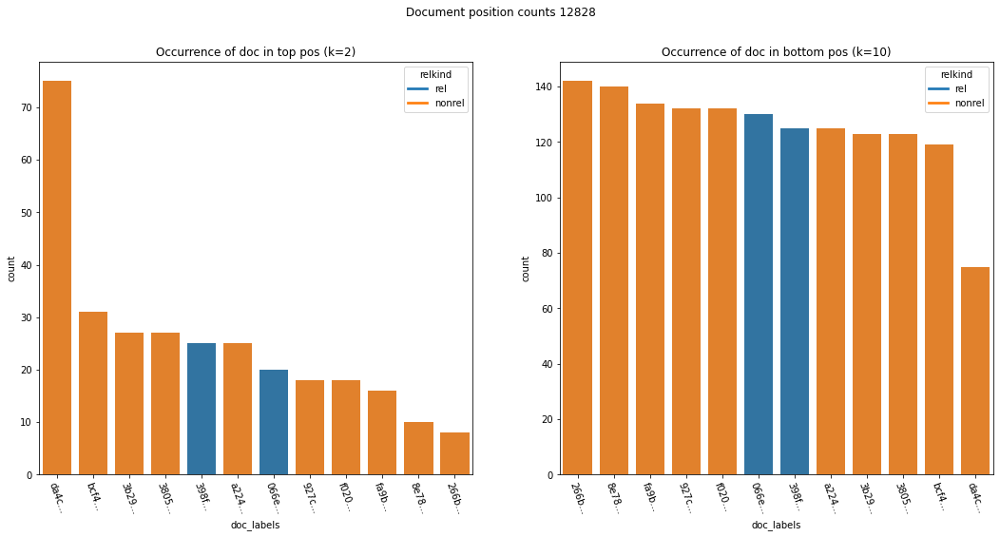

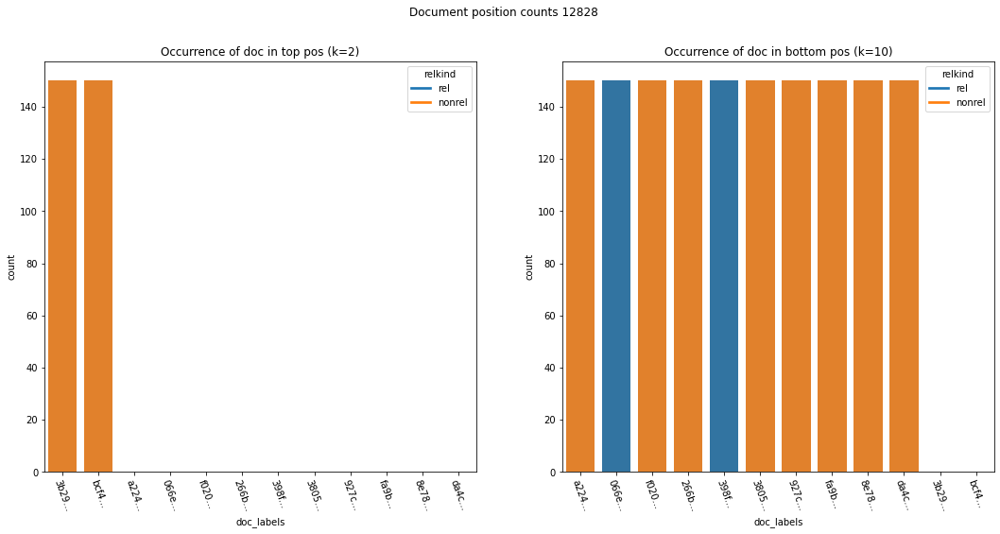

...

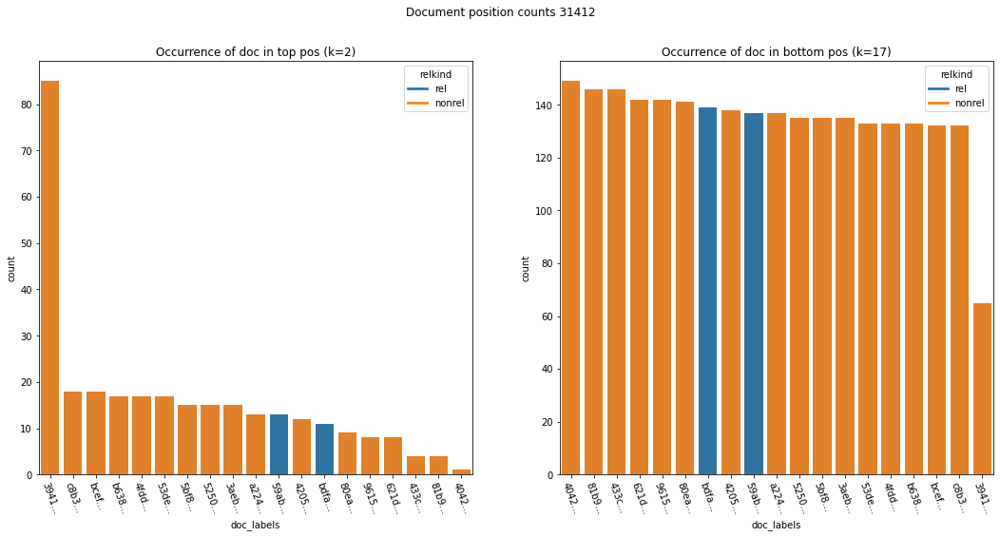

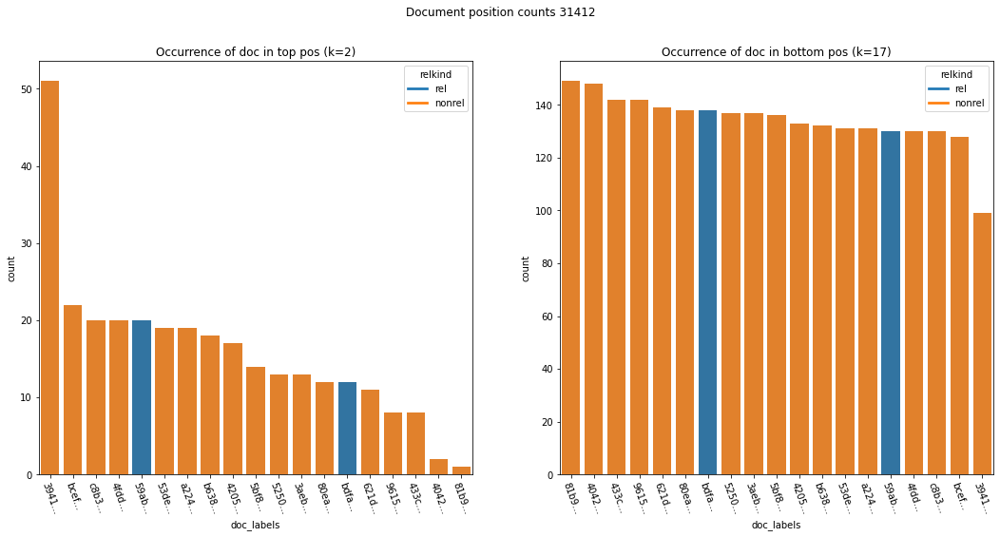

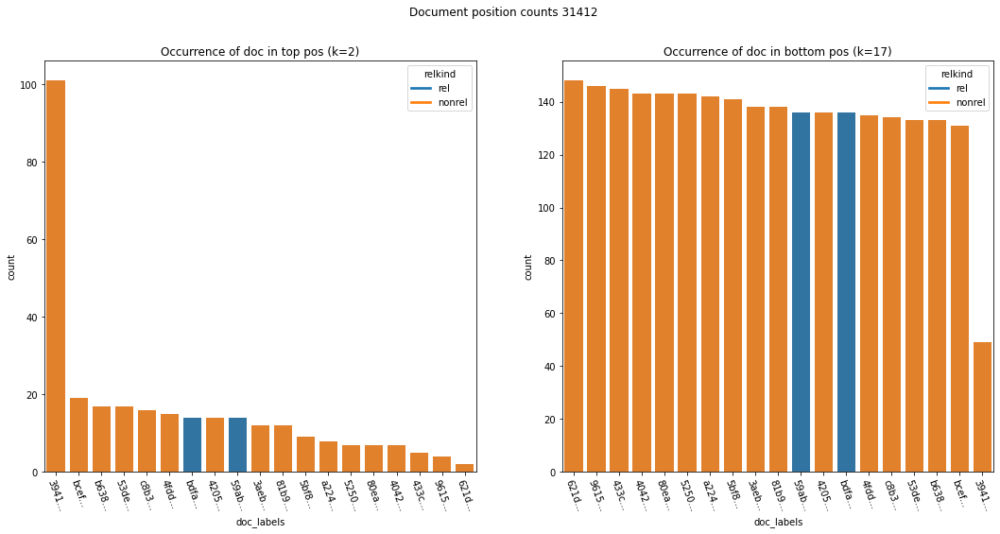

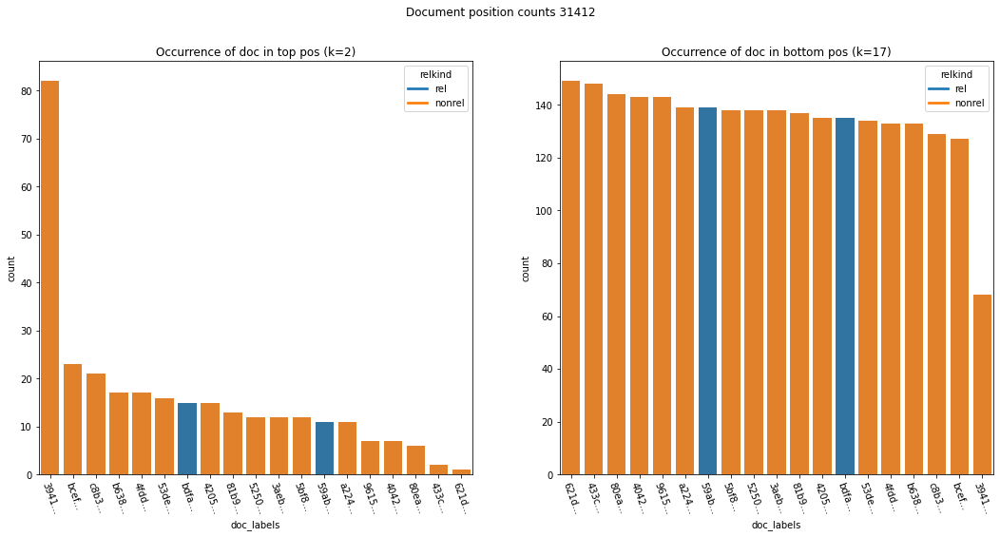

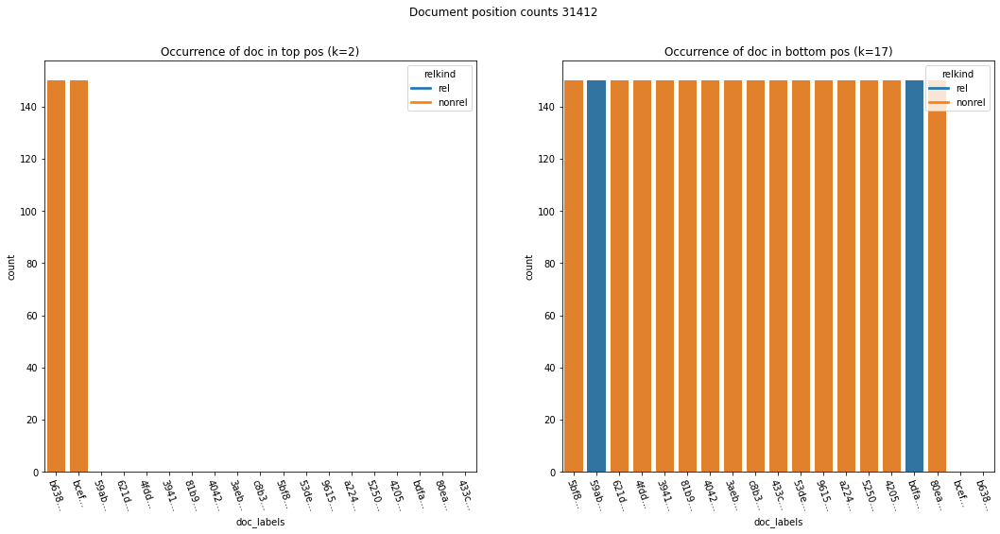

In [207]:
for q in edf_ac_base_A_99.qid.to_list():
    # print("qid:",q)
    # print("A9")
    plot_doc_pos_count_for_qid(q,rdf_ac_base_A_9,reldf,sortby=['count'])
    # print("A99")
    plot_doc_pos_count_for_qid(q,rdf_ac_base_A_99,reldf,sortby=['count'])
    # print("B9")
    plot_doc_pos_count_for_qid(q,rdf_ac_base_B_9,reldf,sortby=['count'])
    # print("B99")
    plot_doc_pos_count_for_qid(q,rdf_ac_base_B_99,reldf,sortby=['count'])
    # print("LM")
    plot_doc_pos_count_for_qid(q,rdf_lm_base,reldf,sortby=['count'])

## 1. How often were top positions occupied by relevant documents?
Can these documents be categorized and distinguished from others? We want to find out which characteristics of a document help the ranker to place it in the correct location.

### Methods

#### Percentage of (non)-relevant documents in range

In [170]:
def percentage_relgrade_in_range(eval_results,ranking,global_reldf,k):
    relfrac = []
    for q in eval_results.head(k).qid.to_list():
        subrdf = extract_results_based_on_qid(q, ranking)
        subreldf = extract_relevances_based_on_qid(q, global_reldf)


        num_rel_docs, num_nonrel_docs = count_relgrades(subreldf)

        rel_nonrel_counts = count_rel_nonrel_per_rank(subrdf, subreldf)
        rel_nonrel_df = rel_nonrel_per_rank_counts_to_sns_df(rel_nonrel_counts)

        # doc_per_rank_counts = count_doc_occurrence_per_rank(subrdf)
        # rank_occurrence_df = doc_occurrence_per_rank_to_sns_df(doc_per_rank_counts, subreldf)

        top_with_rel_frac = round(rel_nonrel_df[(rel_nonrel_df['rank'] <= num_rel_docs) & (rel_nonrel_df['relkind'] == 'r')]['count'].sum() / (150 * num_rel_docs) * 100,2)
        relfrac.append(top_with_rel_frac)
        print(q, "\t", top_with_rel_frac)
    return relfrac

### edf_ac_base_A_9

#### Percentage of relevant documents

In [175]:
relevant_docs_per_query_A9 = percentage_relgrade_in_range(edf_ac_base_A_9,rdf_ac_base_A_9,reldf,10)

3462 	 11.67
27887 	 32.28
66637 	 20.33
10795 	 11.47
12828 	 16.0
54003 	 13.0
120668 	 22.89
12073 	 29.39
64062 	 20.17
12096 	 10.67


In [176]:
np.array(relevant_docs_per_query_A9).mean()

18.787

### edf_ac_base_A_99

#### Percentage of relevant documents

In [177]:
relevant_docs_per_query_A99 = percentage_relgrade_in_range(edf_ac_base_A_99,rdf_ac_base_A_99,reldf,10)

12828 	 17.67
3462 	 11.67
27887 	 28.46
10795 	 14.4
66637 	 22.67
12073 	 31.33
54003 	 15.33
120668 	 24.0
51432 	 17.67
64062 	 19.67


In [178]:
np.array(relevant_docs_per_query_A99).mean()

20.287

### edf_ac_base_B_9

#### Percentage of relevant documents

In [179]:
relevant_docs_per_query_B_9 = percentage_relgrade_in_range(edf_ac_base_B_9,rdf_ac_base_B_9,reldf,10)

3462 	 11.67
27887 	 33.23
66637 	 20.67
10795 	 13.73
12828 	 14.33
120668 	 25.7
12073 	 22.67
54003 	 11.0
12096 	 10.67
64062 	 17.67


In [180]:
np.array(relevant_docs_per_query_B_9).mean()

18.133999999999997

### edf_ac_base_B_99

#### Percentage of relevant documents

In [182]:
relevant_docs_per_query_B_99 = percentage_relgrade_in_range(edf_ac_base_B_99,rdf_ac_base_B_99,reldf,10)

3462 	 12.33
27887 	 29.96
12073 	 24.06
66637 	 21.33
12828 	 15.0
10795 	 14.0
51432 	 17.58
120668 	 23.11
54003 	 9.67
12096 	 11.33


In [183]:
np.array(relevant_docs_per_query_B_99).mean()

17.837

### edf_lm_base

#### Percentage of relevant documents

In [173]:
relevant_docs_per_query_lm_base = percentage_relgrade_in_range(edf_lm_base,rdf_lm_base,reldf,10)

67404 	 50.0
66637 	 50.0
54003 	 50.0
12096 	 0.0
120668 	 55.56
12073 	 45.45
10795 	 20.0
49766 	 40.0
70673 	 0.0
3462 	 25.0


In [174]:
np.array(relevant_docs_per_query_lm_base).mean()

33.601

## 2. How often were top positions occupied by non-relevant documents? 
Can these documents be categorized and distinguished from other documents?

### Computation
1. What percentage of the top positions was occupied by relevant documents?  
    a. Which relevant documents were most often in a top position? 
        - More specifically: which relevant documents were more often in a top position than any other document for the ranking?    
            - Which relevant documents were among the top 75% of the documents in the top positions, frequency-wise.
2. What was their predicted relevance score?  
3. What was their author?  
    - Did their author write more of the documents in the ranking?

#### Percentage of non-relevant documents

In [79]:
fraclist = []
for q in edf.head(10).qid.to_list():
    subrdf = extract_results_based_on_qid(q, rdf)
    subreldf = extract_relevances_based_on_qid(q, reldf)
    
    num_rel_docs, num_nonrel_docs = count_relgrades(subreldf)
    
    rel_nonrel_counts = count_rel_nonrel_per_rank(subrdf, subreldf)
    rel_nonrel_df = rel_nonrel_per_rank_counts_to_sns_df(rel_nonrel_counts)
    
    # doc_per_rank_counts = count_doc_occurrence_per_rank(subrdf)
    # rank_occurrence_df = doc_occurrence_per_rank_to_sns_df(doc_per_rank_counts, subreldf)
    
    top_with_rel_frac = round(rel_nonrel_df[(rel_nonrel_df['rank'] <= num_rel_docs) & (rel_nonrel_df['relkind'] == 'nr')]['count'].sum() / (150 * num_rel_docs) * 100,2)
    fraclist.append(top_with_rel_frac)
    print(q, "\t", top_with_rel_frac)

132049 	 21.08
71096 	 66.83
15395 	 63.67
21984 	 65.6
52728 	 66.38
54538 	 76.07
35778 	 78.0
77011 	 82.76
27887 	 67.72
96265 	 87.67


In [80]:
np.array(fraclist).mean()

67.578

In [81]:
fraclist = []
for q in edf.tail(10).iloc[::-1].qid.to_list():
    subrdf = extract_results_based_on_qid(q, rdf)
    subreldf = extract_relevances_based_on_qid(q, reldf)
    
    num_rel_docs, num_nonrel_docs = count_relgrades(subreldf)
    
    rel_nonrel_counts = count_rel_nonrel_per_rank(subrdf, subreldf)
    rel_nonrel_df = rel_nonrel_per_rank_counts_to_sns_df(rel_nonrel_counts)
    
    # doc_per_rank_counts = count_doc_occurrence_per_rank(subrdf)
    # rank_occurrence_df = doc_occurrence_per_rank_to_sns_df(doc_per_rank_counts, subreldf)
    
    top_with_rel_frac = round(rel_nonrel_df[(rel_nonrel_df['rank'] <= num_rel_docs) & (rel_nonrel_df['relkind'] == 'nr')]['count'].sum() / (150 * num_rel_docs) * 100,2)
    fraclist.append(top_with_rel_frac)
    print(q, "\t", top_with_rel_frac)

33337 	 92.67
47984 	 90.0
111469 	 91.33
31412 	 92.0
11856 	 91.0
30631 	 88.67
76875 	 81.0
24848 	 80.33
5762 	 94.67
82759 	 95.33


In [82]:
np.array(fraclist).mean()

89.7

#### Most frequent non-relevant documents

In [83]:
toptoplist = []
print("\t".join(["qid","doc_id","pos","count","doc_rel"]))
for q in edf.head(10).qid.to_list():
    doc_pos_count = document_pos_count_df_for_qid(q,rdf,reldf)
    doc_pos_count = doc_pos_count[(doc_pos_count.pos == 'top')  & (doc_pos_count.doc_rel == 0)]
    doc_pos_count["qid"] = q
    maxcount = doc_pos_count["count"].max()
    toptoplist = toptoplist + doc_pos_count[doc_pos_count["count"] == maxcount].doc_id.to_list()
    print(doc_pos_count[["qid","doc_id","pos","count","doc_rel"]][doc_pos_count["count"] == maxcount].to_string(index = False, header=False))
    print()
toptoplist

qid	doc_id	pos	count	doc_rel
 132049  8157ceeb5c2cb3abdcd4347a7fae3377d25959d9  top  133  0

 71096  f0e04751c7d1c30d344eb1d41b3a86fbbef5ca7a  top  32  0
 71096  bbf84c2e04321f3f5813cdc91978a186727bbe05  top  32  0

 15395  4e6c4288338eba5644ead3847e11cd50bdee973d  top  42  0

 21984  489c6481f150c07ceb26752a86b5ba1cd863c8de  top  52  0

 52728  78600073012747814a2293cceb58658df5ca3899  top  89  0

 54538  d3d2047b64752b0f7faffaf51084fb5c0212d54f  top  76  0

 35778  318686213deb625007388f23154c9670b886789c  top  39  0

 77011  0da7a3f0c7d130412c61687521f60f3d06d41bcd  top  99  0

 27887  35e87d3aa8eabaa910a0c1d172600823b15b691d  top  79  0
 27887  d02256277cd349c75ba40ba5bd370ec43099c7b0  top  79  0

 96265  2053d9e5eed846080dbd531b94daf0628b2125d3  top  22  0



['8157ceeb5c2cb3abdcd4347a7fae3377d25959d9',
 'f0e04751c7d1c30d344eb1d41b3a86fbbef5ca7a',
 'bbf84c2e04321f3f5813cdc91978a186727bbe05',
 '4e6c4288338eba5644ead3847e11cd50bdee973d',
 '489c6481f150c07ceb26752a86b5ba1cd863c8de',
 '78600073012747814a2293cceb58658df5ca3899',
 'd3d2047b64752b0f7faffaf51084fb5c0212d54f',
 '318686213deb625007388f23154c9670b886789c',
 '0da7a3f0c7d130412c61687521f60f3d06d41bcd',
 '35e87d3aa8eabaa910a0c1d172600823b15b691d',
 'd02256277cd349c75ba40ba5bd370ec43099c7b0',
 '2053d9e5eed846080dbd531b94daf0628b2125d3']

In [84]:
tailtoplist = []
print("\t".join(["qid","doc_id","pos","count","doc_rel"]))
for q in edf.tail(10).iloc[::-1].qid.to_list():
    doc_pos_count = document_pos_count_df_for_qid(q,rdf,reldf)
    doc_pos_count = doc_pos_count[(doc_pos_count.pos == 'top') & (doc_pos_count.doc_rel == 0)]
    doc_pos_count["qid"] = q
    maxcount = doc_pos_count["count"].max()
    tailtoplist = tailtoplist + doc_pos_count[doc_pos_count["count"] == maxcount].doc_id.to_list()
    print(doc_pos_count[["qid","doc_id","pos","count","doc_rel"]][doc_pos_count["count"] == maxcount].to_string(index = False, header=False))
    print()
tailtoplist

qid	doc_id	pos	count	doc_rel
 33337  57ee023985eaea6055b84bef61d8de9da5f6ca9a  top  13  0

 47984  0baed861c47a5954128212057b0f3f2cc1898b9d  top  21  0
 47984  e3670b0984e4690226c5dbc5ae55f9ce7d3782ed  top  21  0
 47984  0fb2374bf367ce7a243d9db00a57574ef2cc6a3e  top  21  0

 111469  e60af557a1bbfd9b2adee8a3c090d27faab86632  top  106  0

 31412  394149ca78b50fb0811a49af46eb95c7ff7241e9  top  85  0

 11856  9c26600cfc83d6926a81863a925423244af36c51  top  84  0

 30631  0e43caeb9d476264d307e8da0ad71ecc4d804ced  top  114  0

 76875  ffa6785fac6cafc60b26be31a8235ba573b4aca3  top  34  0

 24848  38ad845398de1f044a5e1243506c70f04063827c  top  37  0

 5762  c7e087f52b30aa5e603cfc881ea30fbb1ae27bc5  top  16  0

 82759  4ffc7321bc94c9f9391cff47c32a506c3a2d7aa0  top  86  0



['57ee023985eaea6055b84bef61d8de9da5f6ca9a',
 '0baed861c47a5954128212057b0f3f2cc1898b9d',
 'e3670b0984e4690226c5dbc5ae55f9ce7d3782ed',
 '0fb2374bf367ce7a243d9db00a57574ef2cc6a3e',
 'e60af557a1bbfd9b2adee8a3c090d27faab86632',
 '394149ca78b50fb0811a49af46eb95c7ff7241e9',
 '9c26600cfc83d6926a81863a925423244af36c51',
 '0e43caeb9d476264d307e8da0ad71ecc4d804ced',
 'ffa6785fac6cafc60b26be31a8235ba573b4aca3',
 '38ad845398de1f044a5e1243506c70f04063827c',
 'c7e087f52b30aa5e603cfc881ea30fbb1ae27bc5',
 '4ffc7321bc94c9f9391cff47c32a506c3a2d7aa0']

### Inspect spiking documents
The top non-relevant documents for queries

| qid    | docid                                    |
| ------ | ---------------------------------------- |
| 111469 | e60af557a1bbfd9b2adee8a3c090d27faab86632 |
| 31412  | 394149ca78b50fb0811a49af46eb95c7ff7241e9 |
| 11856  | 9c26600cfc83d6926a81863a925423244af36c51 |
| 30631  | 0e43caeb9d476264d307e8da0ad71ecc4d804ced |
| 82759  | 4ffc7321bc94c9f9391cff47c32a506c3a2d7aa0 |
| 77011! | 0da7a3f0c7d130412c61687521f60f3d06d41bcd |


We look at each of these document's authors and their predicted relevance scores.


#### Estimated relevances

In [85]:
est_rel_meta.est_relevance.max()

0.262876905714192

In [86]:
est_rel_meta.est_relevance.min()

4.12674355270539e-09

In [87]:
spikes = pd.DataFrame({'qid': [111469,31412,11856,30631,82759,77011],'doc_id':['e60af557a1bbfd9b2adee8a3c090d27faab86632',
                                                                               '394149ca78b50fb0811a49af46eb95c7ff7241e9',
                                                                               '9c26600cfc83d6926a81863a925423244af36c51',
                                                                               '0e43caeb9d476264d307e8da0ad71ecc4d804ced',
                                                                               '4ffc7321bc94c9f9391cff47c32a506c3a2d7aa0',
                                                                               '0da7a3f0c7d130412c61687521f60f3d06d41bcd']})
spikes

,qid,doc_id
0,111469,e60af557a1bbfd9b2adee8a3c090d27faab86632
1,31412,394149ca78b50fb0811a49af46eb95c7ff7241e9
2,11856,9c26600cfc83d6926a81863a925423244af36c51
3,30631,0e43caeb9d476264d307e8da0ad71ecc4d804ced
4,82759,4ffc7321bc94c9f9391cff47c32a506c3a2d7aa0
5,77011,0da7a3f0c7d130412c61687521f60f3d06d41bcd


In [88]:
spikesrel = pd.merge(spikes,est_rel_meta, on=['qid','doc_id'],how='left')
spikesrel

,qid,doc_id,relevance,est_relevance
0,111469,e60af557a1bbfd9b2adee8a3c090d27faab86632,0,0.213855
1,31412,394149ca78b50fb0811a49af46eb95c7ff7241e9,0,0.076889
2,11856,9c26600cfc83d6926a81863a925423244af36c51,0,0.108677
3,30631,0e43caeb9d476264d307e8da0ad71ecc4d804ced,0,0.124778
4,82759,4ffc7321bc94c9f9391cff47c32a506c3a2d7aa0,0,0.081257
5,77011,0da7a3f0c7d130412c61687521f60f3d06d41bcd,0,0.077175


In [89]:
spikesrel.est_relevance.min()

0.0768893410553138

In [90]:
spikesrel.est_relevance.max()

0.21385544710292603

In [91]:
spikesrel.est_relevance.mean()

0.11377193517260666

#### Authors

The other factor influencing the h-scores is the author advantage. We know that some documents do not have authors. In our implementation of the algorithm, the advantage of documents without author is (re)set to zero at each iteration. Additionally, some documents are not in the index at all, and as such also do not have authors.


In [92]:
es = Elasticsearch([{'timeout':300}])
inspect_ids = spikesrel.doc_id.to_list()
res = es.search(index='semanticscholar2020og', body={'size':len(inspect_ids),'query':{'ids':{'values':inspect_ids}}})
ret_ids = [hit['_id'] for hit in res['hits']['hits']]
not_in_index = list(set(inspect_ids) - set(ret_ids))
no_author_in_idx = [hit['_id'] for hit in res['hits']['hits'] if not hit['_source']['author_ids']]
    
no_author = list(set(not_in_index + no_author_in_idx))
    

In [93]:
res

{'took': 3120,
 'timed_out': False,
 '_shards': {'total': 1, 'successful': 1, 'skipped': 0, 'failed': 0},
 'hits': {'total': {'value': 1, 'relation': 'eq'},
  'max_score': 1.0,
  'hits': [{'_index': 'semanticscholar2020og',
    '_type': 'document',
    '_id': 'e60af557a1bbfd9b2adee8a3c090d27faab86632',
    '_score': 1.0,
    '_source': {'title': 'Creating a Hunger Driven Smartphone Market by Xiaomi',
     'paperAbstract': 'Instead of having large meals throughout the day, fitness freaky people consume food in small quantity to ensure the body is in shape and also reflects a healthy life style. Similarly, Xiaomi , the brain child of a serial tech investor and entrepreneur Lei Jun believes that to gain market leadership instead of producing in bulk at one time it gets profitable in producing small amounts of products at regular intervals. This means an increased efficiency with no surplus raw material resulting in a situation where the demand is more than the supply. Xiaomi, a Chinese br

In [94]:
no_author

['0e43caeb9d476264d307e8da0ad71ecc4d804ced',
 '9c26600cfc83d6926a81863a925423244af36c51',
 '394149ca78b50fb0811a49af46eb95c7ff7241e9',
 'e60af557a1bbfd9b2adee8a3c090d27faab86632',
 '4ffc7321bc94c9f9391cff47c32a506c3a2d7aa0',
 '0da7a3f0c7d130412c61687521f60f3d06d41bcd']

### Inspect nonspiking upper quantile documents

#### Computation top 25% non-relevant documents

We find the documents that are in the upper 25 quantile.

In [95]:
spikes


,qid,doc_id
0,111469,e60af557a1bbfd9b2adee8a3c090d27faab86632
1,31412,394149ca78b50fb0811a49af46eb95c7ff7241e9
2,11856,9c26600cfc83d6926a81863a925423244af36c51
3,30631,0e43caeb9d476264d307e8da0ad71ecc4d804ced
4,82759,4ffc7321bc94c9f9391cff47c32a506c3a2d7aa0
5,77011,0da7a3f0c7d130412c61687521f60f3d06d41bcd


In [96]:
inspectdf  = pd.DataFrame(columns=['qid','doc_id','pos','count','doc_rel','topbot'])
# print("\t".join(["qid","doc_id","pos","count","doc_rel"]))
for q in edf.head(10).qid.to_list():
    doc_pos_count = document_pos_count_df_for_qid(q,rdf,reldf)
    
    doc_pos_count = doc_pos_count[(doc_pos_count.pos == 'top')]
    doc_pos_count = doc_pos_count.sort_values(by='count', ascending=False)
    # print(doc_pos_count)
    # print( doc_pos_count['count'].quantile(0.75))
    doc_pos_count = doc_pos_count[doc_pos_count['count'] >= doc_pos_count['count'].quantile(0.75)]

    doc_pos_count = doc_pos_count[doc_pos_count.doc_rel == 0]

    doc_pos_count["qid"] = q
    doc_pos_count['topbot'] = 'top'
    
       
    if q == 111469:
        doc_pos_count = doc_pos_count[doc_pos_count.doc_id != 'e60af557a1bbfd9b2adee8a3c090d27faab86632']
    if q == 31412:
        doc_pos_count = doc_pos_count[doc_pos_count.doc_id != '394149ca78b50fb0811a49af46eb95c7ff7241e9']
    if q == 11856:
        doc_pos_count = doc_pos_count[doc_pos_count.doc_id != '9c26600cfc83d6926a81863a925423244af36c51']
    if q == 30631:
        doc_pos_count = doc_pos_count[doc_pos_count.doc_id != '0e43caeb9d476264d307e8da0ad71ecc4d804ced']
    if q == 82759:
        doc_pos_count = doc_pos_count[doc_pos_count.doc_id != '4ffc7321bc94c9f9391cff47c32a506c3a2d7aa0']
    if q == 77011:
        doc_pos_count = doc_pos_count[doc_pos_count.doc_id != '0da7a3f0c7d130412c61687521f60f3d06d41bcd']

    inspectdf = inspectdf.append(doc_pos_count)
    # print(doc_pos_count[["qid","doc_id","pos","count","doc_rel"]].to_string(index = False, header=False))
    # print()
inspectdf

,count,doc_id,doc_rel,pos,qid,topbot
38,133,8157ceeb5c2cb3abdcd4347a7fae3377d25959d9,0,top,132049,top
34,132,c1be35f92224ac905e2e1e8f3ca86cfe88316f09,0,top,132049,top
36,129,67315d11bec6fce71080a86283a3255e294b89c5,0,top,132049,top
4,32,f0e04751c7d1c30d344eb1d41b3a86fbbef5ca7a,0,top,71096,top
10,32,bbf84c2e04321f3f5813cdc91978a186727bbe05,0,top,71096,top
14,28,79c270ab702bdb568b42044c5516eb702c0c9854,0,top,71096,top
2,26,cfa64338705a4903b3d38ae98901dc21183bf86c,0,top,71096,top
0,25,e733c8eac41129ceaed9eadf06108119a3752894,0,top,71096,top
18,23,ffccdae350cc206d3ae0012de73d8ee74fb59df1,0,top,71096,top
16,22,bd15b65ce7b716cbdaaeee63d0f5a7e75300774d,0,top,71096,top


In [97]:
for q in edf.tail(10).iloc[::-1].qid.to_list():
    # if not q in [82759,111469,31412,11856,30631]: 
        doc_pos_count = document_pos_count_df_for_qid(q,rdf,reldf)
        doc_pos_count = doc_pos_count[(doc_pos_count.pos == 'top')]
        doc_pos_count = doc_pos_count.sort_values(by='count', ascending=False)
        doc_pos_count = doc_pos_count[doc_pos_count['count'] >= doc_pos_count['count'].quantile(.75)]
        doc_pos_count = doc_pos_count[doc_pos_count.doc_rel == 0]
        
        inspectlist_bottom = inspectlist_bottom + doc_pos_count.doc_id.to_list()
        doc_pos_count["qid"] = q
        doc_pos_count['topbot'] = 'bot'
        
        if q == 111469:
            doc_pos_count = doc_pos_count[doc_pos_count.doc_id != 'e60af557a1bbfd9b2adee8a3c090d27faab86632']
        if q == 31412:
            doc_pos_count = doc_pos_count[doc_pos_count.doc_id != '394149ca78b50fb0811a49af46eb95c7ff7241e9']
        if q == 11856:
            doc_pos_count = doc_pos_count[doc_pos_count.doc_id != '9c26600cfc83d6926a81863a925423244af36c51']
        if q == 30631:
            doc_pos_count = doc_pos_count[doc_pos_count.doc_id != '0e43caeb9d476264d307e8da0ad71ecc4d804ced']
        if q == 82759:
            doc_pos_count = doc_pos_count[doc_pos_count.doc_id != '4ffc7321bc94c9f9391cff47c32a506c3a2d7aa0']
        if q == 77011:
            doc_pos_count = doc_pos_count[doc_pos_count.doc_id != '0da7a3f0c7d130412c61687521f60f3d06d41bcd']
        
        inspectdf = inspectdf.append(doc_pos_count)
        

inspectdf

,count,doc_id,doc_rel,pos,qid,topbot
38,133,8157ceeb5c2cb3abdcd4347a7fae3377d25959d9,0,top,132049,top
34,132,c1be35f92224ac905e2e1e8f3ca86cfe88316f09,0,top,132049,top
36,129,67315d11bec6fce71080a86283a3255e294b89c5,0,top,132049,top
4,32,f0e04751c7d1c30d344eb1d41b3a86fbbef5ca7a,0,top,71096,top
10,32,bbf84c2e04321f3f5813cdc91978a186727bbe05,0,top,71096,top
14,28,79c270ab702bdb568b42044c5516eb702c0c9854,0,top,71096,top
2,26,cfa64338705a4903b3d38ae98901dc21183bf86c,0,top,71096,top
0,25,e733c8eac41129ceaed9eadf06108119a3752894,0,top,71096,top
18,23,ffccdae350cc206d3ae0012de73d8ee74fb59df1,0,top,71096,top
16,22,bd15b65ce7b716cbdaaeee63d0f5a7e75300774d,0,top,71096,top


#### Estimated relevances

In [98]:
inspectrels = pd.merge(inspectdf.rename({'doc_rel':'relevance'},axis=1), est_rel_meta, on=['qid','doc_id','relevance'], how='left')
inspectrels.head()

,count,doc_id,relevance,pos,qid,topbot,est_relevance
0,133,8157ceeb5c2cb3abdcd4347a7fae3377d25959d9,0,top,132049,top,0.064553
1,132,c1be35f92224ac905e2e1e8f3ca86cfe88316f09,0,top,132049,top,0.067740
2,129,67315d11bec6fce71080a86283a3255e294b89c5,0,top,132049,top,0.065241
3,32,f0e04751c7d1c30d344eb1d41b3a86fbbef5ca7a,0,top,71096,top,0.224066
4,32,bbf84c2e04321f3f5813cdc91978a186727bbe05,0,top,71096,top,0.214495


In [99]:
inspectrels.est_relevance.mean()

0.17519449080579338

In [100]:
inspectrels.est_relevance.min()

0.0645531938733597

In [101]:
inspectrels.est_relevance.max()

0.258351602566554

In [102]:
for i, row in inspectdf.iterrows():
    estrel = est_rel_meta[(est_rel_meta.qid == row.qid) & (est_rel_meta.doc_id == row.doc_id)].est_relevance.to_list()[0]
    print(row.qid,'\t', row.doc_id, '\t', row.topbot,'\t', estrel)

132049 	 8157ceeb5c2cb3abdcd4347a7fae3377d25959d9 	 top 	 0.0645531938733597
132049 	 c1be35f92224ac905e2e1e8f3ca86cfe88316f09 	 top 	 0.0677395097624214
132049 	 67315d11bec6fce71080a86283a3255e294b89c5 	 top 	 0.0652410435844021
71096 	 f0e04751c7d1c30d344eb1d41b3a86fbbef5ca7a 	 top 	 0.22406637555944
71096 	 bbf84c2e04321f3f5813cdc91978a186727bbe05 	 top 	 0.21449469850530603
71096 	 79c270ab702bdb568b42044c5516eb702c0c9854 	 top 	 0.19351172260029997
71096 	 cfa64338705a4903b3d38ae98901dc21183bf86c 	 top 	 0.22470799293941396
71096 	 e733c8eac41129ceaed9eadf06108119a3752894 	 top 	 0.25510297331536397
71096 	 ffccdae350cc206d3ae0012de73d8ee74fb59df1 	 top 	 0.18338607887915198
71096 	 bd15b65ce7b716cbdaaeee63d0f5a7e75300774d 	 top 	 0.186111103123662
15395 	 4e6c4288338eba5644ead3847e11cd50bdee973d 	 top 	 0.242943043233949
15395 	 fb052c2c638cc2c682b0fc6e36da0582e51e4e11 	 top 	 0.24606251563695603
15395 	 6e3d8390a0129602e4680baeb9a87ff2b89b7db4 	 top 	 0.18030561920611
21984 	 4

#### Authors

In [103]:
es = Elasticsearch([{'timeout':300}])
inspect_ids = inspectdf.doc_id.to_list()
res = es.search(index='semanticscholar2020og', body={'size':len(inspect_ids),'query':{'ids':{'values':inspect_ids}}})
ret_ids = [hit['_id'] for hit in res['hits']['hits']]
not_in_index = list(set(inspect_ids) - set(ret_ids))
no_author_in_idx = [hit['_id'] for hit in res['hits']['hits'] if not hit['_source']['author_ids']]
    
no_author = list(set(not_in_index + no_author_in_idx))
    

In [104]:
no_author

[]

In [105]:
from collections import Counter

In [106]:
Counter(inspect_ids)

Counter({'8157ceeb5c2cb3abdcd4347a7fae3377d25959d9': 1,
         'c1be35f92224ac905e2e1e8f3ca86cfe88316f09': 1,
         '67315d11bec6fce71080a86283a3255e294b89c5': 1,
         'f0e04751c7d1c30d344eb1d41b3a86fbbef5ca7a': 1,
         'bbf84c2e04321f3f5813cdc91978a186727bbe05': 1,
         '79c270ab702bdb568b42044c5516eb702c0c9854': 1,
         'cfa64338705a4903b3d38ae98901dc21183bf86c': 1,
         'e733c8eac41129ceaed9eadf06108119a3752894': 1,
         'ffccdae350cc206d3ae0012de73d8ee74fb59df1': 1,
         'bd15b65ce7b716cbdaaeee63d0f5a7e75300774d': 1,
         '4e6c4288338eba5644ead3847e11cd50bdee973d': 1,
         'fb052c2c638cc2c682b0fc6e36da0582e51e4e11': 1,
         '6e3d8390a0129602e4680baeb9a87ff2b89b7db4': 1,
         '489c6481f150c07ceb26752a86b5ba1cd863c8de': 1,
         'f588374552ec0ba6e846ebdaa4fe4b37d1ea8042': 1,
         '4199fbc0a70120d237e97973ce2e258e285134ac': 1,
         '78600073012747814a2293cceb58658df5ca3899': 1,
         'c273cb0fcab40abe02805c689806f59c50b7d6

In [107]:
hits = res['hits']['hits']
doc_to_author_mapping = {}
for hit in hits:
    doc_to_author_mapping[hit['_id']] = hit['_source']['author_ids']
# doc_to_author_mapping = {hit['_id']: hit['_source']['author_ids'] for hit in hits}
doc_to_author_mapping
author_doc_mapping = {}
for docid, authorlist in doc_to_author_mapping.items():
    for author in authorlist:
        if author not in author_doc_mapping:
            author_doc_mapping[author] = []
        author_doc_mapping[author] = author_doc_mapping[author] + [docid]
author_doc_mapping

{'65849129': ['e541ad97e2774225767e531268c926effe1ff48b'],
 '46943440': ['2779def3b6e5ff2a03baa06f9b70c42cfe70d95b'],
 '35226608': ['2779def3b6e5ff2a03baa06f9b70c42cfe70d95b'],
 '2477489': ['38ad845398de1f044a5e1243506c70f04063827c'],
 '82520522': ['820ea5bb1b783a85422d49294929773ff606c55c'],
 '116709533': ['a7c0a13135c7b706c86b0a8b44b1d1fd995daab5'],
 '1709111': ['e4a16ba09d842bea6e1c0f2cf4fb6cdef4be6664'],
 '17829206': ['3ff3c4087566fbc462963fc66a8423868026baba'],
 '95171276': ['3ff3c4087566fbc462963fc66a8423868026baba'],
 '38453548': ['3ff3c4087566fbc462963fc66a8423868026baba'],
 '2174725': ['3ff3c4087566fbc462963fc66a8423868026baba'],
 '48389697': ['3ff3c4087566fbc462963fc66a8423868026baba'],
 '5344895': ['08b4ef64497107c71553f163ecf880f6d1a53a5d'],
 '3233243': ['08b4ef64497107c71553f163ecf880f6d1a53a5d'],
 '2187371': ['08b4ef64497107c71553f163ecf880f6d1a53a5d'],
 '1695049': ['08b4ef64497107c71553f163ecf880f6d1a53a5d'],
 '1998750': ['08b4ef64497107c71553f163ecf880f6d1a53a5d'],
 '49

##### Overlapping author

In [108]:
same_author_docs = ['0fb2374bf367ce7a243d9db00a57574ef2cc6a3e', 'fe293d02f3ad2db943bbeaa2b9f03a84b09df6cd']
same_authors = ['121695157', '1397046305', '3513639', '15216687', '50529864', '1868080', '3192616']

In [109]:
inspectdf[inspectdf.doc_id.isin(same_author_docs)]

,count,doc_id,doc_rel,pos,qid,topbot
8,21,0fb2374bf367ce7a243d9db00a57574ef2cc6a3e,0,top,47984,bot
6,18,fe293d02f3ad2db943bbeaa2b9f03a84b09df6cd,0,top,47984,bot


In [110]:
reldf[reldf.qid == 47984].iloc[0]

qid                                           47984
query                                      etizolam
doc_id     7f2eab8ca0af2da0abb9109b2a8c9ff5ef8fbe35
doc_rel                                           0
Name: 40, dtype: object

In [111]:
est_rel_meta[(est_rel_meta.qid == 47984) & (est_rel_meta.doc_id.isin(same_author_docs))]

,qid,doc_id,relevance,est_relevance
933,47984,0fb2374bf367ce7a243d9db00a57574ef2cc6a3e,0,0.202905
941,47984,fe293d02f3ad2db943bbeaa2b9f03a84b09df6cd,0,0.219435


In [112]:
es = Elasticsearch([{'timeout':300}])
inspect_ids = inspectdf.doc_id.to_list()
res = es.search(index='semanticscholar2020og', body={'size':len(same_author_docs),'query':{'ids':{'values':same_author_docs}}})
res

{'took': 5,
 'timed_out': False,
 '_shards': {'total': 1, 'successful': 1, 'skipped': 0, 'failed': 0},
 'hits': {'total': {'value': 2, 'relation': 'eq'},
  'max_score': 1.0,
  'hits': [{'_index': 'semanticscholar2020og',
    '_type': 'document',
    '_id': '0fb2374bf367ce7a243d9db00a57574ef2cc6a3e',
    '_score': 1.0,
    '_source': {'title': 'Induction of the metabolism of etizolam by carbamazepine in humans',
     'paperAbstract': 'ObjectiveTo examine the effect of carbamazepine on the single oral dose pharmacokinetics of etizolam.MethodsEleven healthy male volunteers received carbamazepine 200\xa0mg/day or placebo for 6\xa0days in a double-blind, randomized, crossover manner, and on the sixth day they received a single oral 1-mg dose of etizolam. Blood samplings and evaluation of psychomotor function by the Digit Symbol Substitution Test and Stanford Sleepiness Scale were conducted up to 24\xa0h after etizolam dosing. Plasma concentration of etizolam was measured using high-performa

## 3. Which relevant documents appear rarely or not at all in the top positions? 
Why did these documents not appear in top positions more often?

### Computation
#### Bottom 25% relevant documents

We find the relevant documents that are in the lower quantile.

In [113]:
inspectdf  = pd.DataFrame(columns=['qid','doc_id','pos','count','doc_rel','topbot'])
# print("\t".join(["qid","doc_id","pos","count","doc_rel"]))
for q in edf.head(10).qid.to_list():
    doc_pos_count = document_pos_count_df_for_qid(q,rdf,reldf)
    
    
    
    doc_pos_count = doc_pos_count[(doc_pos_count.pos == 'bot')]
    
    doc_pos_count = doc_pos_count.sort_values(by='count', ascending=False)
    
    
    
    # print( doc_pos_count['count'].quantile(0.75))
    doc_pos_count = doc_pos_count[doc_pos_count['count'] >= doc_pos_count['count'].quantile(0.75)]

    doc_pos_count = doc_pos_count[doc_pos_count.doc_rel == 1]
    # print(doc_pos_count)
    doc_pos_count["qid"] = q
    doc_pos_count['topbot'] = 'top'
    
       
    # if q == 111469:
    #     doc_pos_count = doc_pos_count[doc_pos_count.doc_id != 'e60af557a1bbfd9b2adee8a3c090d27faab86632']
    # if q == 31412:
    #     doc_pos_count = doc_pos_count[doc_pos_count.doc_id != '394149ca78b50fb0811a49af46eb95c7ff7241e9']
    # if q == 11856:
    #     doc_pos_count = doc_pos_count[doc_pos_count.doc_id != '9c26600cfc83d6926a81863a925423244af36c51']
    # if q == 30631:
    #     doc_pos_count = doc_pos_count[doc_pos_count.doc_id != '0e43caeb9d476264d307e8da0ad71ecc4d804ced']
    # if q == 82759:
    #     doc_pos_count = doc_pos_count[doc_pos_count.doc_id != '4ffc7321bc94c9f9391cff47c32a506c3a2d7aa0']
    # if q == 77011:
    #     doc_pos_count = doc_pos_count[doc_pos_count.doc_id != '0da7a3f0c7d130412c61687521f60f3d06d41bcd']

    inspectdf = inspectdf.append(doc_pos_count)
    # print(doc_pos_count[["qid","doc_id","pos","count","doc_rel"]].to_string(index = False, header=False))
    # print()
inspectdf

,count,doc_id,doc_rel,pos,qid,topbot
17,52,2e93445410af33f0c377ed65bcc4ac74a8826ae2,1,bot,132049,top
29,45,25e5f01d3d4b05a01beaacf33c2c30628f0679ca,1,bot,132049,top
7,41,167abf8617dc3a30990addfcf6fb3161ff222f21,1,bot,132049,top
31,40,fa0e2faa4cc284cedd3be5cd192710a6b2a09b9a,1,bot,132049,top
39,122,b1b68f721e5126c4f1c1cc7c0bbc91071eaac222,1,bot,21984,top
1,115,f6d9f8a64f20c26d83b0b0cdc5c9131c1822858c,1,bot,52728,top
3,110,2a7e7fba70c6ad91e79b5d4fdd1f487551a808bb,1,bot,52728,top
15,126,091904c2b9d8ef6fe127b97d461c8e51d20237be,1,bot,54538,top
17,119,d8d969c4c74f2759e0eccd9fd5b6b775036650f1,1,bot,54538,top
3,118,6621f6f8087226645cc00120a9b14da4354518ca,1,bot,54538,top


In [114]:
for q in edf.tail(10).iloc[::-1].qid.to_list():
    # if not q in [82759,111469,31412,11856,30631]: 
        doc_pos_count = document_pos_count_df_for_qid(q,rdf,reldf)
        doc_pos_count = doc_pos_count[(doc_pos_count.pos == 'bot')]
        doc_pos_count = doc_pos_count.sort_values(by='count', ascending=False)
        doc_pos_count = doc_pos_count[doc_pos_count['count'] >= doc_pos_count['count'].quantile(.75)]
        doc_pos_count = doc_pos_count[doc_pos_count.doc_rel == 1]
        
        inspectlist_bottom = inspectlist_bottom + doc_pos_count.doc_id.to_list()
        doc_pos_count["qid"] = q
        doc_pos_count['topbot'] = 'bot'
        
        if q == 111469:
            doc_pos_count = doc_pos_count[doc_pos_count.doc_id != 'e60af557a1bbfd9b2adee8a3c090d27faab86632']
        if q == 31412:
            doc_pos_count = doc_pos_count[doc_pos_count.doc_id != '394149ca78b50fb0811a49af46eb95c7ff7241e9']
        if q == 11856:
            doc_pos_count = doc_pos_count[doc_pos_count.doc_id != '9c26600cfc83d6926a81863a925423244af36c51']
        if q == 30631:
            doc_pos_count = doc_pos_count[doc_pos_count.doc_id != '0e43caeb9d476264d307e8da0ad71ecc4d804ced']
        if q == 82759:
            doc_pos_count = doc_pos_count[doc_pos_count.doc_id != '4ffc7321bc94c9f9391cff47c32a506c3a2d7aa0']
        if q == 77011:
            doc_pos_count = doc_pos_count[doc_pos_count.doc_id != '0da7a3f0c7d130412c61687521f60f3d06d41bcd']
        
        inspectdf = inspectdf.append(doc_pos_count)
        

inspectdf

,count,doc_id,doc_rel,pos,qid,topbot
17,52,2e93445410af33f0c377ed65bcc4ac74a8826ae2,1,bot,132049,top
29,45,25e5f01d3d4b05a01beaacf33c2c30628f0679ca,1,bot,132049,top
7,41,167abf8617dc3a30990addfcf6fb3161ff222f21,1,bot,132049,top
31,40,fa0e2faa4cc284cedd3be5cd192710a6b2a09b9a,1,bot,132049,top
39,122,b1b68f721e5126c4f1c1cc7c0bbc91071eaac222,1,bot,21984,top
1,115,f6d9f8a64f20c26d83b0b0cdc5c9131c1822858c,1,bot,52728,top
3,110,2a7e7fba70c6ad91e79b5d4fdd1f487551a808bb,1,bot,52728,top
15,126,091904c2b9d8ef6fe127b97d461c8e51d20237be,1,bot,54538,top
17,119,d8d969c4c74f2759e0eccd9fd5b6b775036650f1,1,bot,54538,top
3,118,6621f6f8087226645cc00120a9b14da4354518ca,1,bot,54538,top


### Visualization

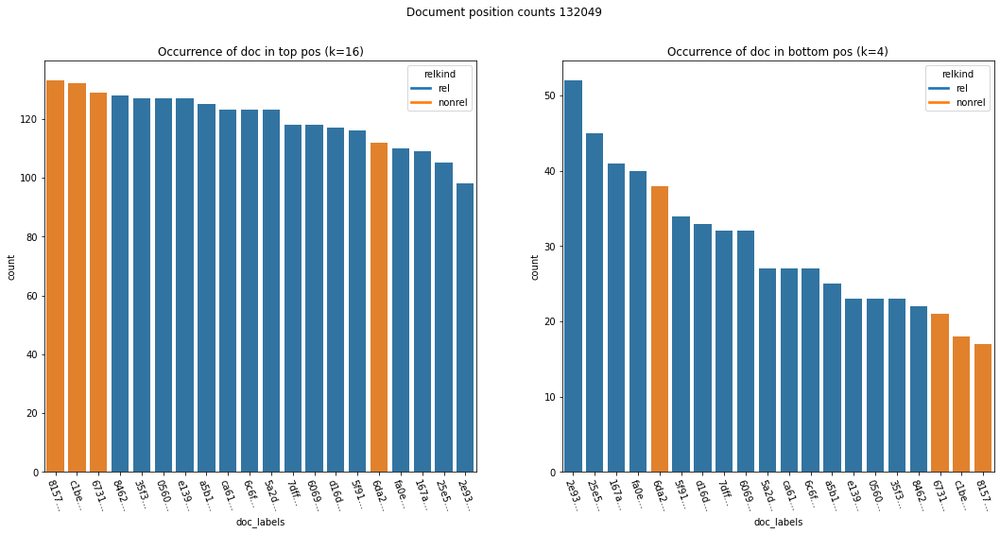

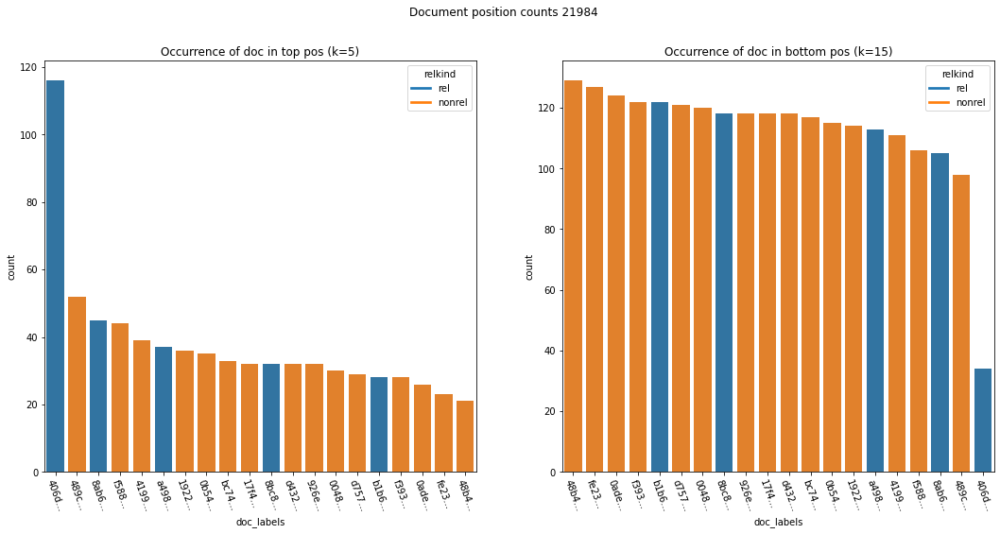

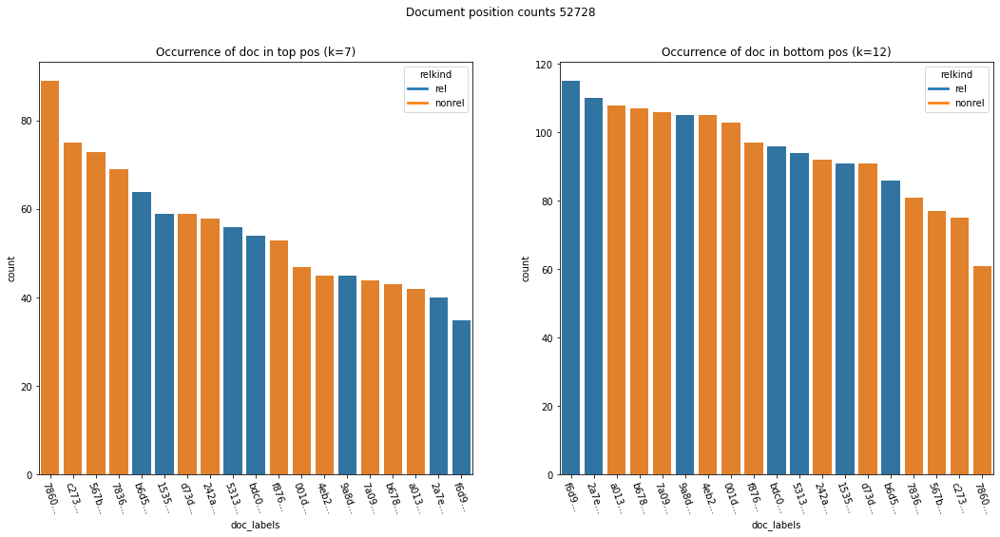

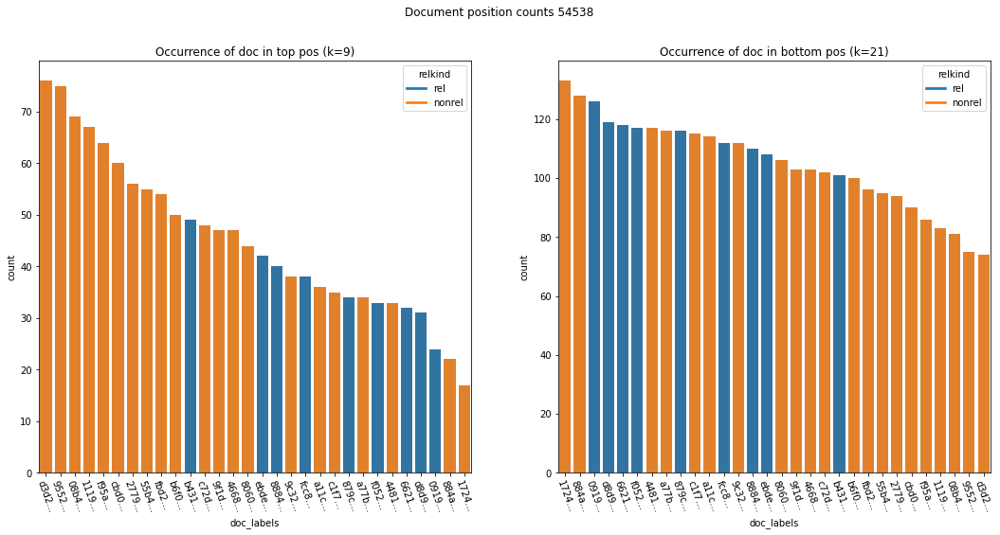

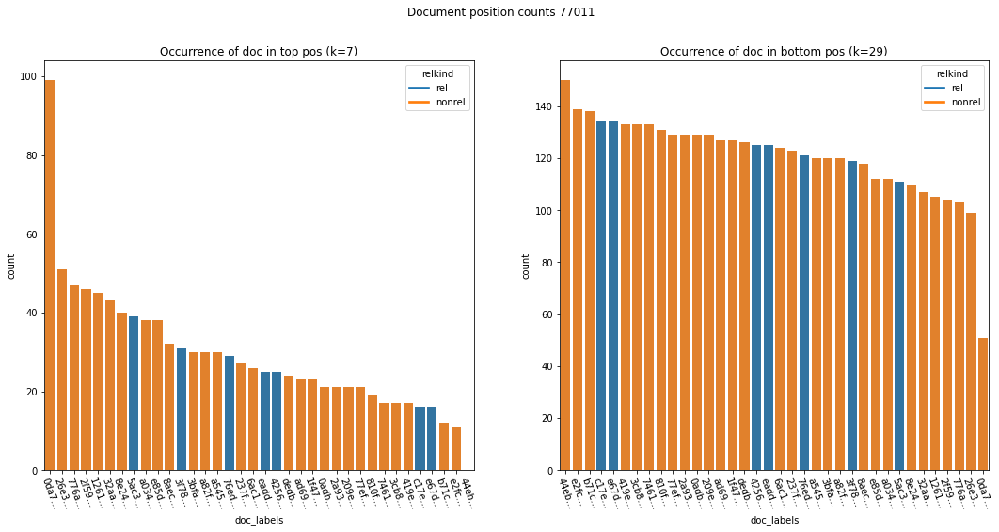

...

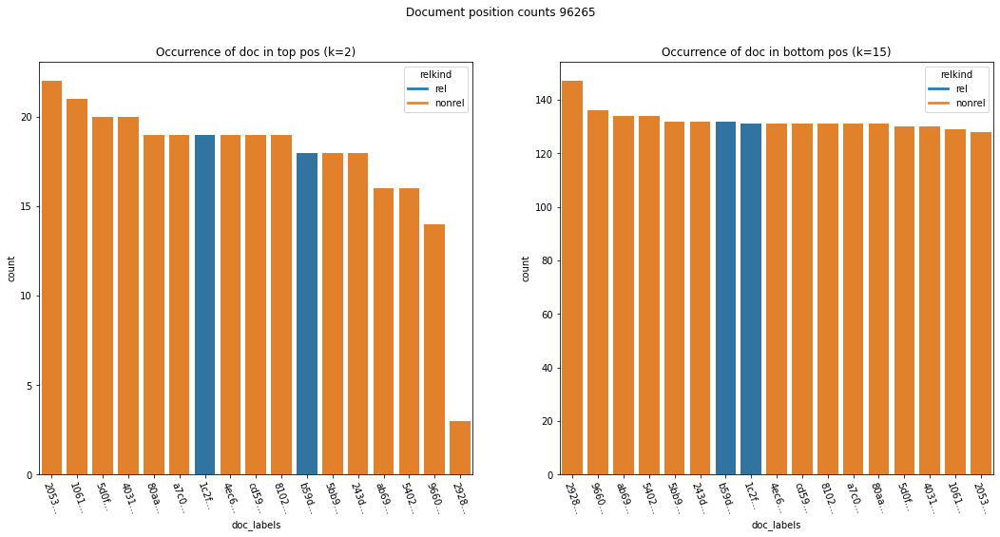

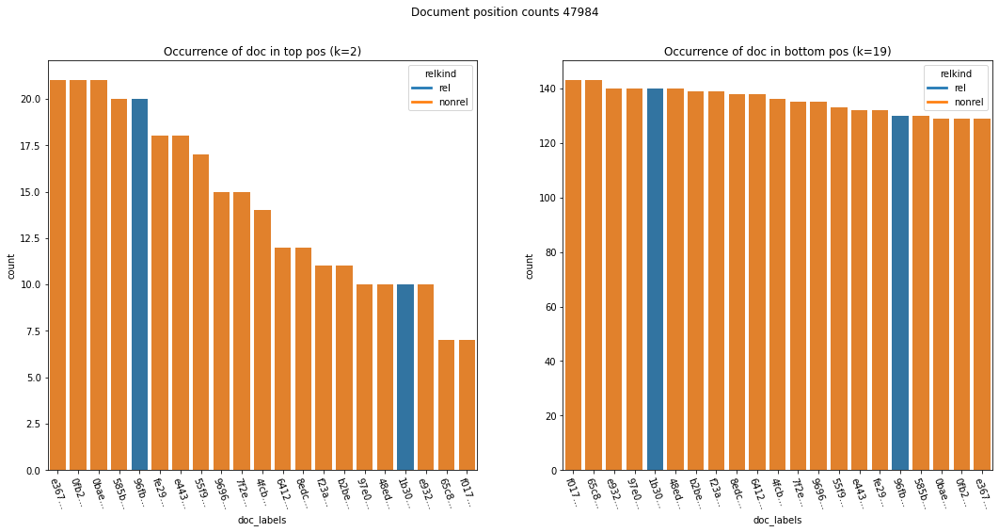

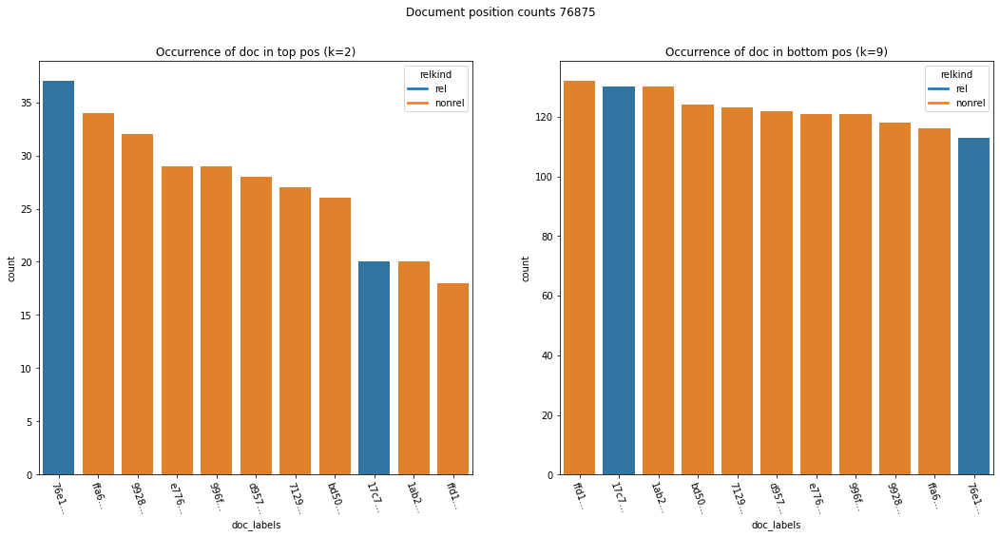

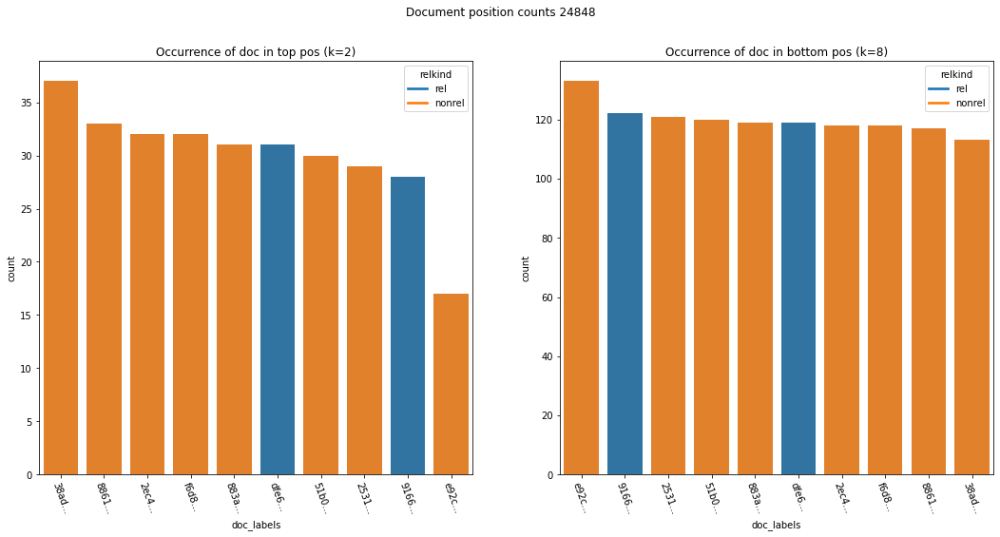

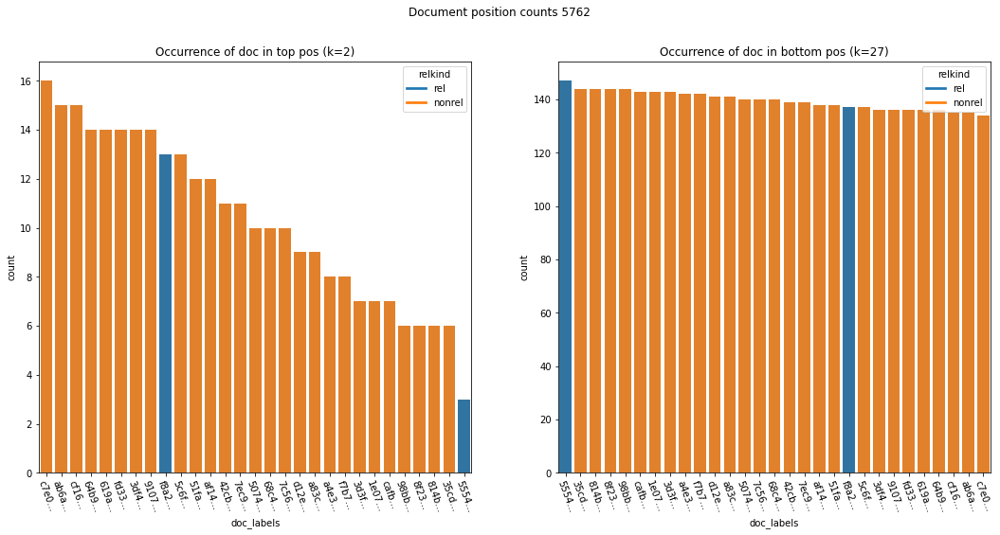

In [115]:
for q in inspectdf.qid.drop_duplicates().to_list():
        plot_doc_pos_count_for_qid(q,rdf,reldf,sortby=['count'])

#### Inspect documents of interest

##### Estimated relevances

In [116]:
inspectdf

,count,doc_id,doc_rel,pos,qid,topbot
17,52,2e93445410af33f0c377ed65bcc4ac74a8826ae2,1,bot,132049,top
29,45,25e5f01d3d4b05a01beaacf33c2c30628f0679ca,1,bot,132049,top
7,41,167abf8617dc3a30990addfcf6fb3161ff222f21,1,bot,132049,top
31,40,fa0e2faa4cc284cedd3be5cd192710a6b2a09b9a,1,bot,132049,top
39,122,b1b68f721e5126c4f1c1cc7c0bbc91071eaac222,1,bot,21984,top
1,115,f6d9f8a64f20c26d83b0b0cdc5c9131c1822858c,1,bot,52728,top
3,110,2a7e7fba70c6ad91e79b5d4fdd1f487551a808bb,1,bot,52728,top
15,126,091904c2b9d8ef6fe127b97d461c8e51d20237be,1,bot,54538,top
17,119,d8d969c4c74f2759e0eccd9fd5b6b775036650f1,1,bot,54538,top
3,118,6621f6f8087226645cc00120a9b14da4354518ca,1,bot,54538,top


In [117]:
inpspectdf_select = inspectdf[inspectdf.doc_id.isin(['2e93445410af33f0c377ed65bcc4ac74a8826ae2',
                                                     '2a7e7fba70c6ad91e79b5d4fdd1f487551a808bb',
                                                    '6426c1444b4b397982ae1b8782dba53ad662fbeb',
                                                    '1b303e6f3e4213cccba4e08ac5e75b4c9790d213',
                                                    '17c780c1aca508a3172fa0d5dd1bf10168a10f54',
                                                    '55545d2c73cce5d3f2ad42f04b6cbcee5a2d4144'])]
                              
inpspectdf_select

,count,doc_id,doc_rel,pos,qid,topbot
17,52,2e93445410af33f0c377ed65bcc4ac74a8826ae2,1,bot,132049,top
3,110,2a7e7fba70c6ad91e79b5d4fdd1f487551a808bb,1,bot,52728,top
95,140,6426c1444b4b397982ae1b8782dba53ad662fbeb,1,bot,27887,top
29,140,1b303e6f3e4213cccba4e08ac5e75b4c9790d213,1,bot,47984,bot
19,130,17c780c1aca508a3172fa0d5dd1bf10168a10f54,1,bot,76875,bot
51,147,55545d2c73cce5d3f2ad42f04b6cbcee5a2d4144,1,bot,5762,bot


In [118]:
inspectrels = pd.merge(inspectdf.rename({'doc_rel':'relevance'},axis=1), est_rel_meta, on=['qid','doc_id','relevance'], how='left')
inspectrels

,count,doc_id,relevance,pos,qid,topbot,est_relevance
0,52,2e93445410af33f0c377ed65bcc4ac74a8826ae2,1,bot,132049,top,0.187206
1,45,25e5f01d3d4b05a01beaacf33c2c30628f0679ca,1,bot,132049,top,0.179613
2,41,167abf8617dc3a30990addfcf6fb3161ff222f21,1,bot,132049,top,0.187206
3,40,fa0e2faa4cc284cedd3be5cd192710a6b2a09b9a,1,bot,132049,top,0.179613
4,122,b1b68f721e5126c4f1c1cc7c0bbc91071eaac222,1,bot,21984,top,0.067000
5,115,f6d9f8a64f20c26d83b0b0cdc5c9131c1822858c,1,bot,52728,top,0.236089
6,110,2a7e7fba70c6ad91e79b5d4fdd1f487551a808bb,1,bot,52728,top,0.233840
7,126,091904c2b9d8ef6fe127b97d461c8e51d20237be,1,bot,54538,top,0.199217
8,119,d8d969c4c74f2759e0eccd9fd5b6b775036650f1,1,bot,54538,top,0.191665
9,118,6621f6f8087226645cc00120a9b14da4354518ca,1,bot,54538,top,0.248919


In [119]:
inspectrels.est_relevance.mean()

0.18333806712472892

In [120]:
inspectrels.est_relevance.min()

0.0669999602274531

In [121]:
inspectrels.est_relevance.max()

0.25621193351684

In [122]:
inspectrels[inspectrels.topbot=='top'].est_relevance.mean()

0.19848138036106452

In [123]:
inspectrels[inspectrels.topbot=='top'].est_relevance.min()

0.0669999602274531

In [124]:
inspectrels[inspectrels.topbot=='top'].est_relevance.max()

0.25621193351684

In [125]:
inspectrels[inspectrels.topbot=='bot'].est_relevance.mean()

0.11140732925213481

In [126]:
inspectrels[inspectrels.topbot=='bot'].est_relevance.min()

0.0766392048464476

In [127]:
inspectrels[inspectrels.topbot=='bot'].est_relevance.max()

0.16352391775566502

In [128]:
for i, row in inspectdf.iterrows():
    estrel = est_rel_meta[(est_rel_meta.qid == row.qid) & (est_rel_meta.doc_id == row.doc_id)].est_relevance.to_list()[0]
    print(row.qid,'\t', row.doc_id, '\t', row.topbot,'\t', estrel)

132049 	 2e93445410af33f0c377ed65bcc4ac74a8826ae2 	 top 	 0.187206085519219
132049 	 25e5f01d3d4b05a01beaacf33c2c30628f0679ca 	 top 	 0.179613166813848
132049 	 167abf8617dc3a30990addfcf6fb3161ff222f21 	 top 	 0.187206085519219
132049 	 fa0e2faa4cc284cedd3be5cd192710a6b2a09b9a 	 top 	 0.179613166813848
21984 	 b1b68f721e5126c4f1c1cc7c0bbc91071eaac222 	 top 	 0.0669999602274531
52728 	 f6d9f8a64f20c26d83b0b0cdc5c9131c1822858c 	 top 	 0.236088575157381
52728 	 2a7e7fba70c6ad91e79b5d4fdd1f487551a808bb 	 top 	 0.233839881533441
54538 	 091904c2b9d8ef6fe127b97d461c8e51d20237be 	 top 	 0.19921712924843402
54538 	 d8d969c4c74f2759e0eccd9fd5b6b775036650f1 	 top 	 0.191665177636188
54538 	 6621f6f8087226645cc00120a9b14da4354518ca 	 top 	 0.24891895317031898
54538 	 f0524d5c84f237d57c4a1071bd9dc52e701feb05 	 top 	 0.24891895317031898
54538 	 879c8af3f0aca90e17e4008b7c914438bbee3495 	 top 	 0.20163352601981896
77011 	 c17e5dc7ec9a75f04fe52743d87fea0eb00246b2 	 top 	 0.184173427469443
77011 	 e67d

In [129]:
for i, row in inspectdf.iterrows():
    estrel = est_rel_meta[(est_rel_meta.qid == row.qid) & (est_rel_meta.doc_id == row.doc_id)].est_relevance.to_list()[0]
    print(row.qid,'\t', row.doc_id, '\t', row.topbot,'\t', estrel)

132049 	 2e93445410af33f0c377ed65bcc4ac74a8826ae2 	 top 	 0.187206085519219
132049 	 25e5f01d3d4b05a01beaacf33c2c30628f0679ca 	 top 	 0.179613166813848
132049 	 167abf8617dc3a30990addfcf6fb3161ff222f21 	 top 	 0.187206085519219
132049 	 fa0e2faa4cc284cedd3be5cd192710a6b2a09b9a 	 top 	 0.179613166813848
21984 	 b1b68f721e5126c4f1c1cc7c0bbc91071eaac222 	 top 	 0.0669999602274531
52728 	 f6d9f8a64f20c26d83b0b0cdc5c9131c1822858c 	 top 	 0.236088575157381
52728 	 2a7e7fba70c6ad91e79b5d4fdd1f487551a808bb 	 top 	 0.233839881533441
54538 	 091904c2b9d8ef6fe127b97d461c8e51d20237be 	 top 	 0.19921712924843402
54538 	 d8d969c4c74f2759e0eccd9fd5b6b775036650f1 	 top 	 0.191665177636188
54538 	 6621f6f8087226645cc00120a9b14da4354518ca 	 top 	 0.24891895317031898
54538 	 f0524d5c84f237d57c4a1071bd9dc52e701feb05 	 top 	 0.24891895317031898
54538 	 879c8af3f0aca90e17e4008b7c914438bbee3495 	 top 	 0.20163352601981896
77011 	 c17e5dc7ec9a75f04fe52743d87fea0eb00246b2 	 top 	 0.184173427469443
77011 	 e67d

In [130]:
est_rel_meta.head()

,qid,doc_id,relevance,est_relevance
0,5438,3e19046c665867bbe557685da60738a40738010a,0,0.179419
1,5438,7ef08f1fa127af817cdfd9d3bd00bdf60e32143b,0,0.145612
2,5438,ec13c3e7119191802e6f5783d297fe7a5a05293e,0,0.210751
3,5438,8fc928bb430d3f72ac876ca156042ad1860acacd,0,0.079591
4,5438,b2fdee22aa02477292b858fbafcb418932732bce,1,0.260175


In [131]:
inspectdf

,count,doc_id,doc_rel,pos,qid,topbot
17,52,2e93445410af33f0c377ed65bcc4ac74a8826ae2,1,bot,132049,top
29,45,25e5f01d3d4b05a01beaacf33c2c30628f0679ca,1,bot,132049,top
7,41,167abf8617dc3a30990addfcf6fb3161ff222f21,1,bot,132049,top
31,40,fa0e2faa4cc284cedd3be5cd192710a6b2a09b9a,1,bot,132049,top
39,122,b1b68f721e5126c4f1c1cc7c0bbc91071eaac222,1,bot,21984,top
1,115,f6d9f8a64f20c26d83b0b0cdc5c9131c1822858c,1,bot,52728,top
3,110,2a7e7fba70c6ad91e79b5d4fdd1f487551a808bb,1,bot,52728,top
15,126,091904c2b9d8ef6fe127b97d461c8e51d20237be,1,bot,54538,top
17,119,d8d969c4c74f2759e0eccd9fd5b6b775036650f1,1,bot,54538,top
3,118,6621f6f8087226645cc00120a9b14da4354518ca,1,bot,54538,top


In [132]:
edf.head(10).qid.to_list()

[132049, 71096, 15395, 21984, 52728, 54538, 35778, 77011, 27887, 96265]

In [133]:
edf.tail(10).qid.to_list()

[82759, 5762, 24848, 76875, 30631, 11856, 31412, 111469, 47984, 33337]

In [134]:
for q in inspectdf.qid.drop_duplicates().to_list():
    a = est_rel_meta[est_rel_meta.qid == q].sort_values(by=['qid','est_relevance'],ascending=False)
    a["inspect"] = False
    # print(a)
    a["inspect"] = a.apply(lambda row: row.doc_id in inspectdf[inspectdf.qid == q].doc_id.to_list(),axis=1)
    print(a[['qid','doc_id','est_relevance','inspect']])

         qid                                    doc_id  est_relevance  inspect
2603  132049  5f91afa4ba1591dfd9d35450ac07f41dca1ce4f6       0.198229    False
2587  132049  6c6fc8896569067cf30b0f2349933c7462809912       0.187206    False
2589  132049  6da29e3f7e9ab2cbedccb71201ae62ed52f949a4       0.187206    False
2590  132049  167abf8617dc3a30990addfcf6fb3161ff222f21       0.187206     True
2592  132049  5a2de88464b2307f1fd89f3d84c6d507a49cb47f       0.187206    False
2595  132049  7dff8a6d32efbaa16fb7510b9c3347985de71596       0.187206    False
2597  132049  a5b1fe9129df3f499eeeb7c30913109e448a1174       0.187206    False
2598  132049  ca614b83b9496ef4893881a713195c5389c19ec8       0.187206    False
2599  132049  2e93445410af33f0c377ed65bcc4ac74a8826ae2       0.187206     True
2586  132049  d16d4ab632d18d70c0ffd9d4d7493444281275e5       0.179613    False
2588  132049  e13918f61745d29a2e84101ebfc46e9487d38fca       0.179613    False
2593  132049  35f38d22d658330d980eb78f4774ad1a68a11e

In [135]:
est_rel_meta[(est_rel_meta.qid == 5762)].sort_values(by='est_relevance')

,qid,doc_id,relevance,est_relevance
1733,5762,cafb96b11ae8e8cd5e3171fcbdba68efa1176535,0,0.072707
1748,5762,35cddfed05641142f55d82da6dc24985ab6dc720,0,0.073544
1752,5762,814bda29b30e3c67bf61c7aac5ef508f7d943630,0,0.074477
1734,5762,55545d2c73cce5d3f2ad42f04b6cbcee5a2d4144,1,0.076639
1736,5762,8f232e7b24d03b299ef1dc99ef5ed532c843308e,0,0.085570
1757,5762,98bb60748eb8ef7a671cdd22faa87e377fd13060,0,0.090166
1753,5762,1e077413b25c4d34945cc2707e17e46ed4fe784a,0,0.091364
1749,5762,f7b749f92f31cccc4e176bb93469f596f01a7d6e,0,0.092370
1741,5762,3d3f789a56dca288b2c8e23ef047a2b342184950,0,0.095002
1739,5762,a83cec6a91701bd8500f8c43ad731d4353c71d55,0,0.103799


In [136]:
est_rel_meta[(est_rel_meta.qid == 52728)].sort_values(by='est_relevance')

,qid,doc_id,relevance,est_relevance
2340,52728,78600073012747814a2293cceb58658df5ca3899,0,0.067842
2350,52728,567ba4bdc6dabcc6a0dd9fb68899f7edb6d4238b,0,0.071045
2342,52728,bdc09e28ce331b8a5f78310b7c644b0485cd300e,1,0.093680
2352,52728,f876d010f07d87c1b5da2a0e97be6e871e5dbd77,0,0.101581
2349,52728,c273cb0fcab40abe02805c689806f59c50b7d640,0,0.106872
2347,52728,b6d58f6d006acfe4df4e4b0e30f5c070738fba5b,1,0.136974
2355,52728,001d90376ea9a5672e6a2b37ff468d6f3ee0a3e5,0,0.150015
2348,52728,242a976b17f8005f91a2f7aacbb85bf7d6424426,0,0.151359
2337,52728,78360444f3b4540339efc9e7e5f2610a7e46c023,0,0.152619
2343,52728,7a0966ce97904ecf8c89eeedab8f90abea965ce5,0,0.166938


In [137]:
est_rel_meta[(est_rel_meta.qid == 54538)].sort_values(by='est_relevance')

,qid,doc_id,relevance,est_relevance
952,54538,111946b1e82eb6d362026726e18a1083129bfc61,0,0.070979
966,54538,55b435376e2e2ebd5b0752d819732dbd4149aed9,0,0.073626
978,54538,cbd0e4517d81182aa07830e93cd8ecc05cf2ff81,0,0.074993
974,54538,9552c0890230f5f2191e06e7457ef05ca7fc5d56,0,0.075727
979,54538,08b4ef64497107c71553f163ecf880f6d1a53a5d,0,0.086176
972,54538,c72dbf820d2ee8d3cea40d15437d5c1b273e0006,0,0.088853
951,54538,f95a2a61f545e731b5637708221d5c360ad272e1,0,0.096779
954,54538,2779def3b6e5ff2a03baa06f9b70c42cfe70d95b,0,0.097261
960,54538,d3d2047b64752b0f7faffaf51084fb5c0212d54f,0,0.115732
964,54538,8060ae82b88c7170816f52c081c48c18d6bc31a3,0,0.118370


In [138]:
est_rel_meta[(est_rel_meta.qid == 277887)].sort_values(by='est_relevance')

,qid,doc_id,relevance,est_relevance


#### Authors

In [139]:
es = Elasticsearch([{'timeout':300}])
inspect_ids = inspectdf.doc_id.to_list()
res = es.search(index='semanticscholar2020og', body={'size':len(inspect_ids),'query':{'ids':{'values':inspect_ids}}})
ret_ids = [hit['_id'] for hit in res['hits']['hits']]
not_in_index = list(set(inspect_ids) - set(ret_ids))
no_author_in_idx = [hit['_id'] for hit in res['hits']['hits'] if not hit['_source']['author_ids']]
    
no_author = list(set(not_in_index + no_author_in_idx))
    

In [140]:
no_author

[]

In [141]:
res

{'took': 9900,
 'timed_out': False,
 '_shards': {'total': 1, 'successful': 1, 'skipped': 0, 'failed': 0},
 'hits': {'total': {'value': 23, 'relation': 'eq'},
  'max_score': 1.0,
  'hits': [{'_index': 'semanticscholar2020og',
    '_type': 'document',
    '_id': '6621f6f8087226645cc00120a9b14da4354518ca',
    '_score': 1.0,
    '_source': {'title': 'Influence of violent media on children and adolescents',
     'paperAbstract': 'In their review on the influence of violent media on children and adolescents, Kevin Browne and Catherine HamiltonGiachritsis (Feb 19, p 702) raise the question of why children and adolescents are more susceptible to media violence than adults. The effects of television are best understood in terms of rote learning—ie, by the brain digesting thousands of examples and thereby shaping synaptic connections, a process usually referred to as neuroplasticity. Lundborg and Rosén made the link between age and the speed of synaptic change quite clear. They plotted the resu

## 4. How does the distribution of disparity, relevance, and constant terms change with increasing query difficulty, as measured by DGEE?

In [142]:
edf = edf.sort_values(by='difference')
edf.head()

key,qid,difference,disparity,relevance
0,132049,0.002713,1.421254,1.403715
1,71096,0.027807,1.974314,1.862491
3,15395,0.033729,2.044128,1.889445
2,21984,0.051934,1.441575,1.299282
4,52728,0.078204,1.029654,0.784137


In [143]:
dif_disp_rel = edf.reset_index(drop=True).reset_index().rename({'index':'difficulty'}, axis=1)
disp = dif_disp_rel[["difficulty","disparity"]].rename({'disparity':'value'}, axis=1)
relp = dif_disp_rel[["difficulty","relevance"]].rename({'relevance':'value'}, axis=1)
concatenated = pd.concat([disp.assign(metric='disparity'), relp.assign(metric='relevance')])
concatenated.head()


key,difficulty,value,metric
0,0,1.421254,disparity
1,1,1.974314,disparity
2,2,2.044128,disparity
3,3,1.441575,disparity
4,4,1.029654,disparity


Text(0.5, 0.98, 'Relevance and disparity versus difficulty')

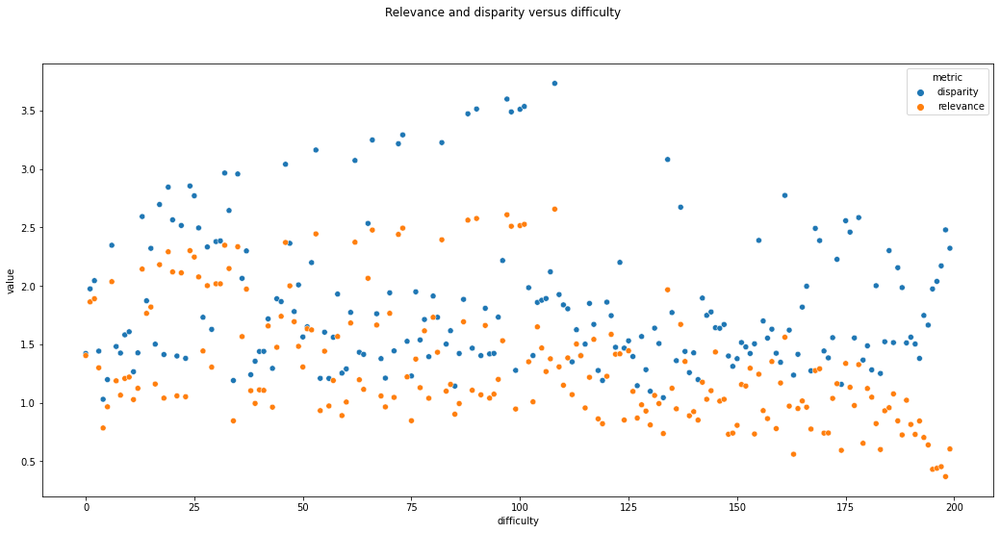

In [144]:
fig, ax = plt.subplots(1,1,figsize = (17.7,8.27))
# ax2 = ax.twinx()

pi = iter(sns.color_palette())
f = next(pi)
s = next(pi)

sns.scatterplot(data=concatenated, x='difficulty', y='value',hue='metric',ax=ax)



fig.suptitle('Relevance and disparity versus difficulty')

## 5. What obvious mistakes did the system make that it could have easily avoided?

### Spikes

The different AC runs all exhibit the behavior that some documents spike above others.

#### H: The spiking documents do not have an author

- None of the spikes have an author
- Some of the documents without author are *not* advantaged

In [68]:
noauth_docids = list(filter( lambda x: doc_to_author[x] == [],doc_to_author.keys()))

In [69]:
noauth_docids

['c4e85963c9461f7b1fb752acee5275a4545314b7',
 '5602b782ca138e7d1c402cbbe519df6e1fc14d74',
 '87156b2e9b7eadd04af1438d0c7d3e733a2ecb84',
 '6afc97668839a439e6858691ada76c9ddf798c2a',
 '30a698ba5648295c91f00545326931eaf07b00be',
 '8d798e36a0b69ddfd62948c0758fd55c673eb2ca',
 '02f5be3c7aa4e2a71e949a1760971eb27a0364fa',
 '406d1ef750ba4520b8c57f95596cd42852c0e3fa',
 '863db559058843f59eb17d78d72218a4aba07cb3',
 '038a789bbb8f211176d5e9b0c8394bf6b6d2cc59',
 'f16f2aae49f330b9c0f885bf2eb5b4f8a9df00b7',
 '4313bf44960b5b726028b55e76f1c9f99334e347',
 '8d442ea1c14504e6e5676d82e78e1330c354731f',
 '2801d473e9c29b3de614030be102fa7245806d00',
 '0e43caeb9d476264d307e8da0ad71ecc4d804ced',
 'da4c40a9cf24ee94e2bd142013f3db6480c05265',
 '1ef0ad9c9382693fd39d8cfbc25aab7929d89abe',
 '67cb7ec0f36f9396b85b18cad90c0d7eec1658ce',
 '9e334ebeca80a9b4ae9be52e66e306ecf31f361a',
 '25c40e796680cdea53578dfad8c7bdbae7ee56a5',
 'e60af557a1bbfd9b2adee8a3c090d27faab86632',
 'a6361a0ce9579d5659cad164c7d855c396e227f1',
 'fb833f8b

In [220]:
es = Elasticsearch([{'timeout':200}])

In [223]:
es.search(index='semanticscholar2020og', body={'query':{'ids':{'values':['acf1073a9693ebd3c85c3f782774cdc15c1de290']}}})

{'took': 578,
 'timed_out': False,
 '_shards': {'total': 1, 'successful': 1, 'skipped': 0, 'failed': 0},
 'hits': {'total': {'value': 0, 'relation': 'eq'},
  'max_score': None,
  'hits': []}}

In [257]:
es.search(index='semanticscholar2020og', body={'query':{'ids':{'values':['19c7aa36737e55da3e1ad0a29bf0dd21bb8cbc9f']}}})

{'took': 1129,
 'timed_out': False,
 '_shards': {'total': 1, 'successful': 1, 'skipped': 0, 'failed': 0},
 'hits': {'total': {'value': 1, 'relation': 'eq'},
  'max_score': 1.0,
  'hits': [{'_index': 'semanticscholar2020og',
    '_type': 'document',
    '_id': '19c7aa36737e55da3e1ad0a29bf0dd21bb8cbc9f',
    '_score': 1.0,
    '_source': {'title': 'Behind the ratings: Text mining of restaurant customers’ online reviews:',
     'paperAbstract': 'Establishing the relation between online ratings and reviews provides a potentially inexpensive and effective way for restaurants to capture quality improvement hints from customers. To this end, t...',
     'entities': [],
     'author_names': ['Susan Jia'],
     'author_ids': ['145142763'],
     'inCitations': 6,
     'outCitations': 0,
     'year': 2018,
     'venue': '',
     'journalName': 'International Journal of Market Research',
     'journalVolume': '60',
     'sources': [],
     'doi': '10.1177/1470785317752048',
     'fields_of_study':

#### H: better performing AC config put spike document at the top less often

##### edf_ac_base_A_9

###### Percentage of top/bottom 10 queries with an authorless document

In [228]:
4/10 * 100

40.0

In [229]:
3/10 * 100

30.0

###### Visualization

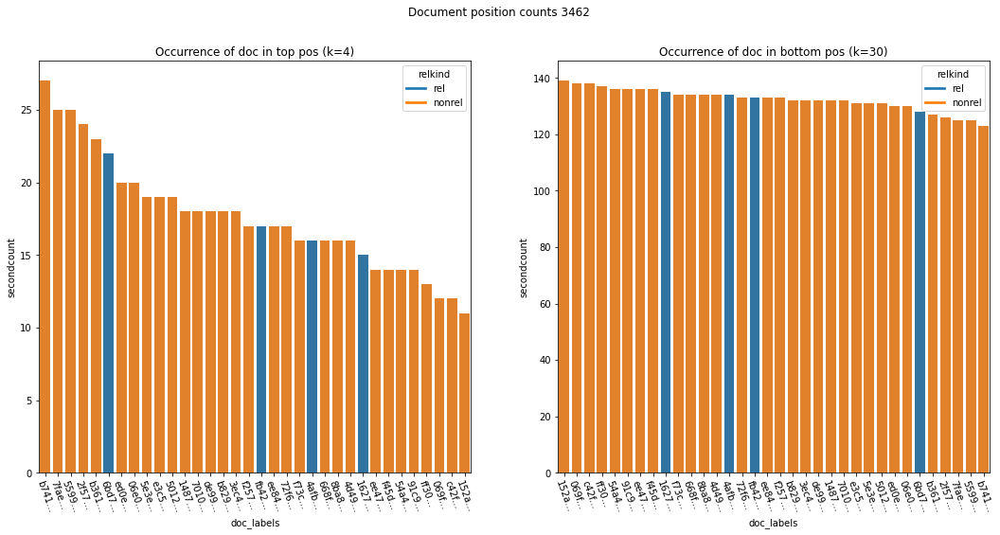

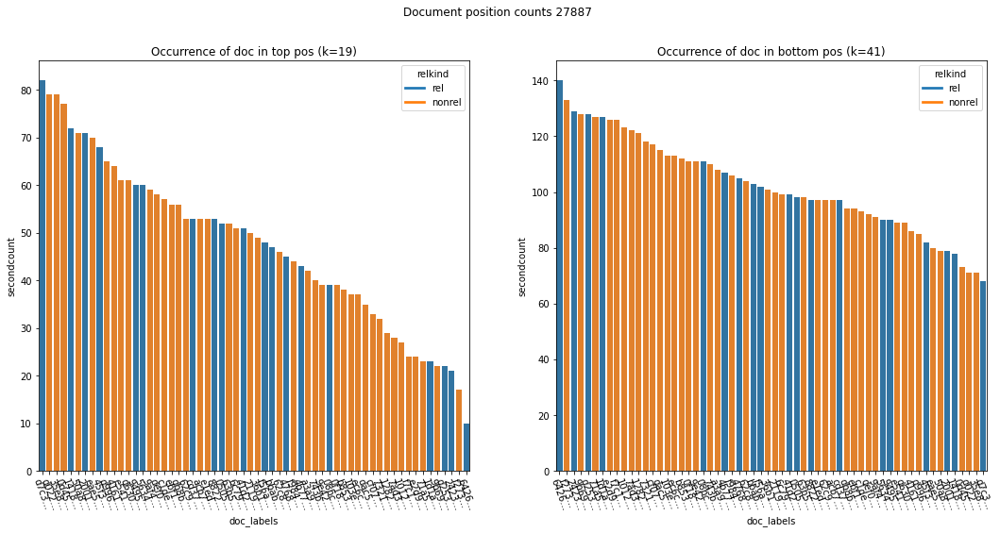

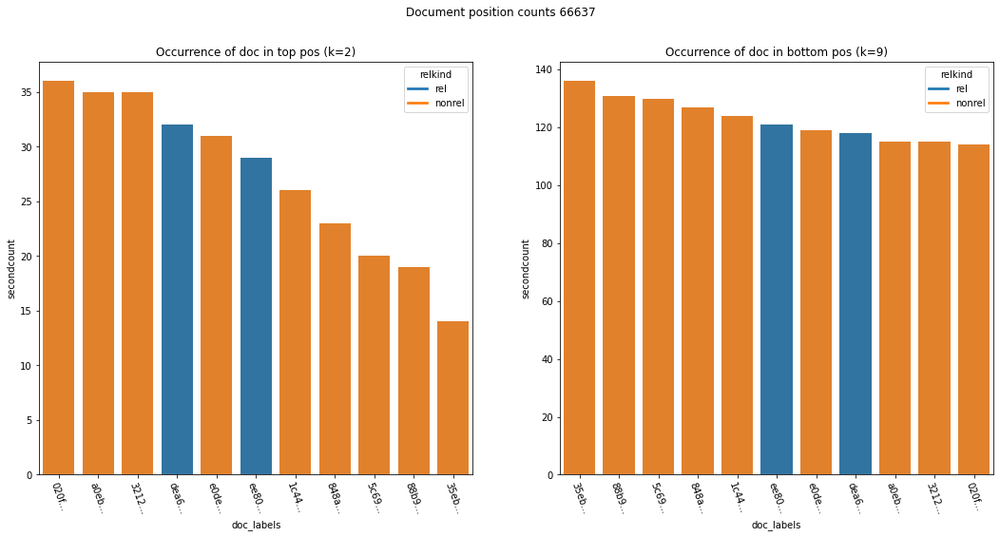

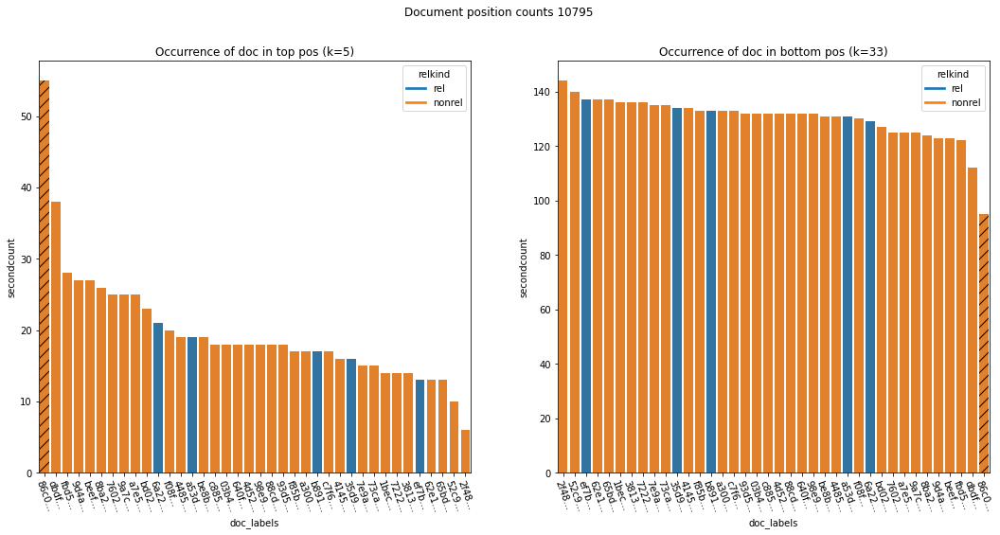

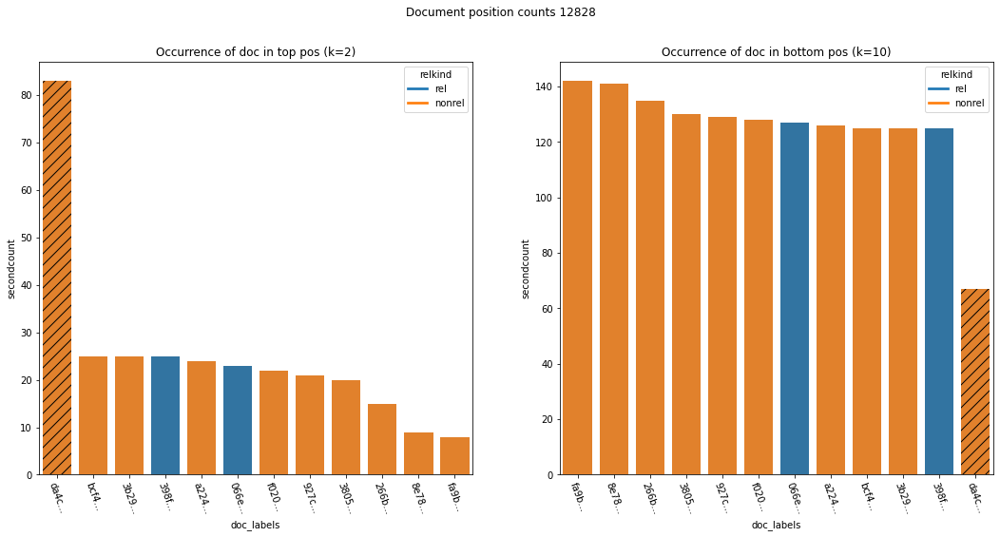

...

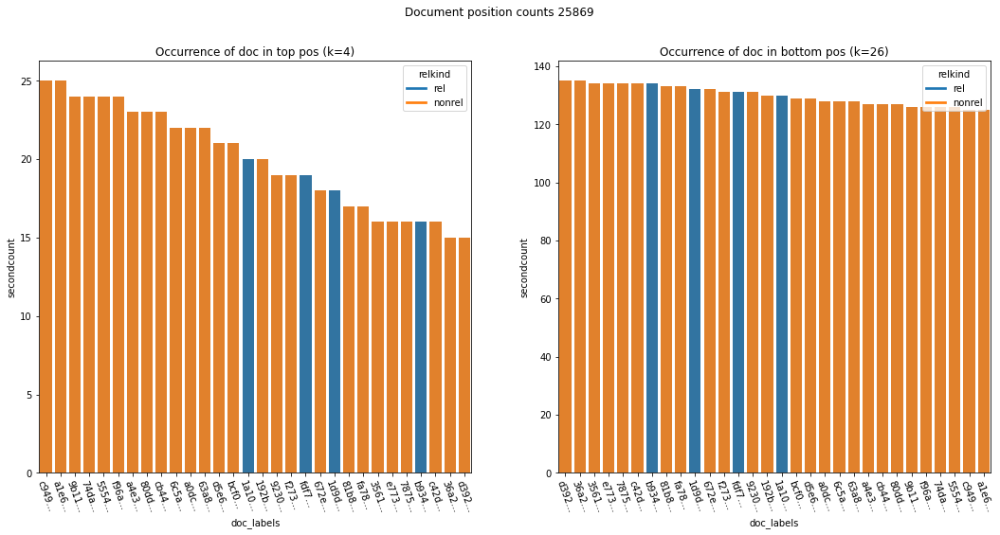

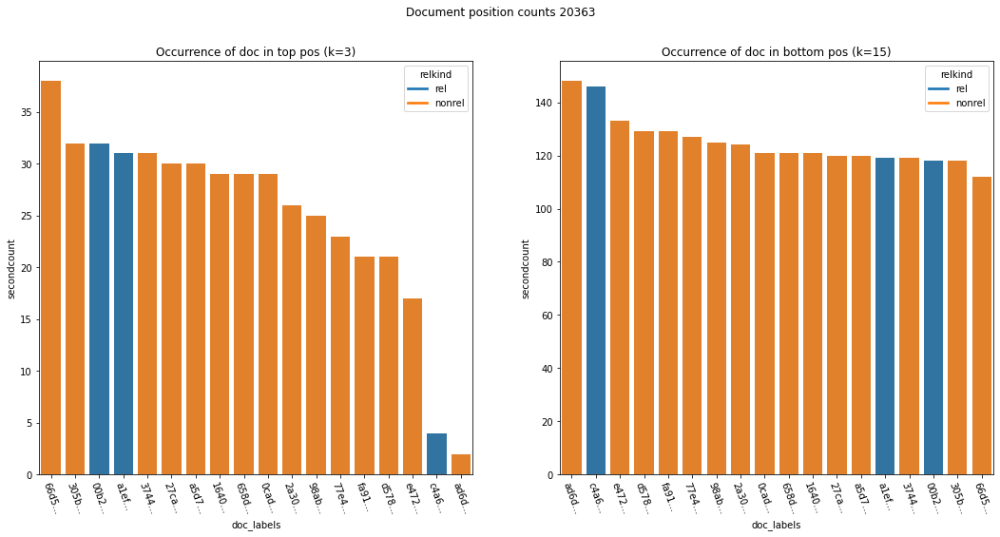

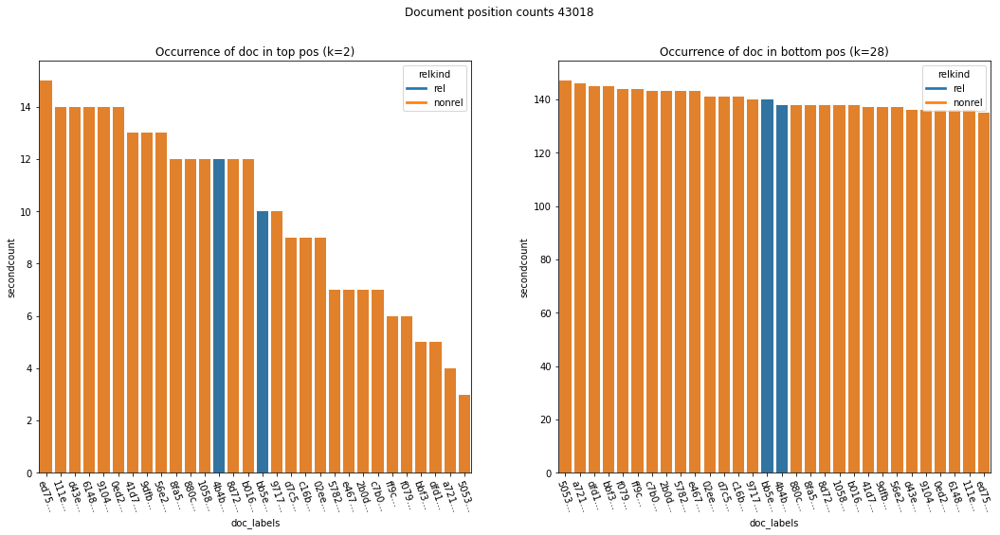

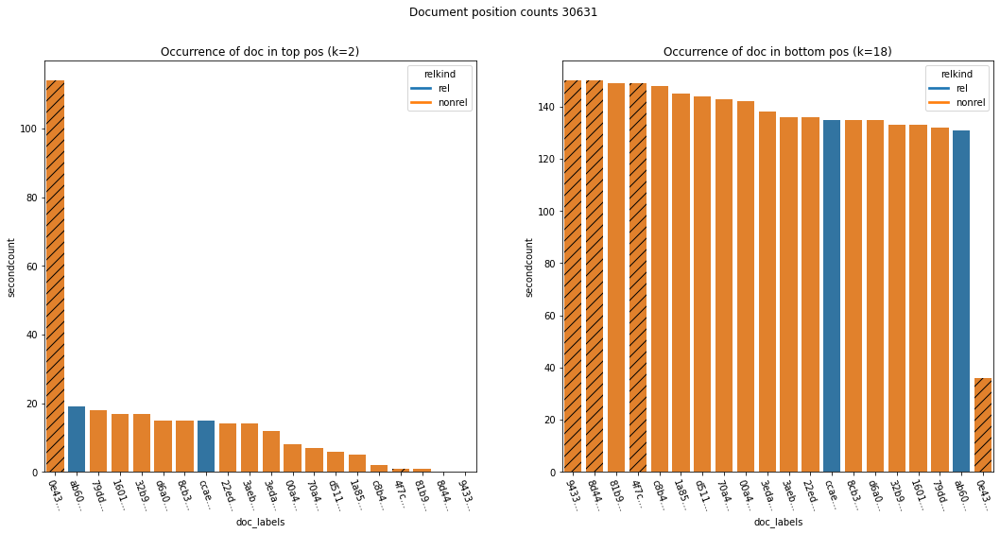

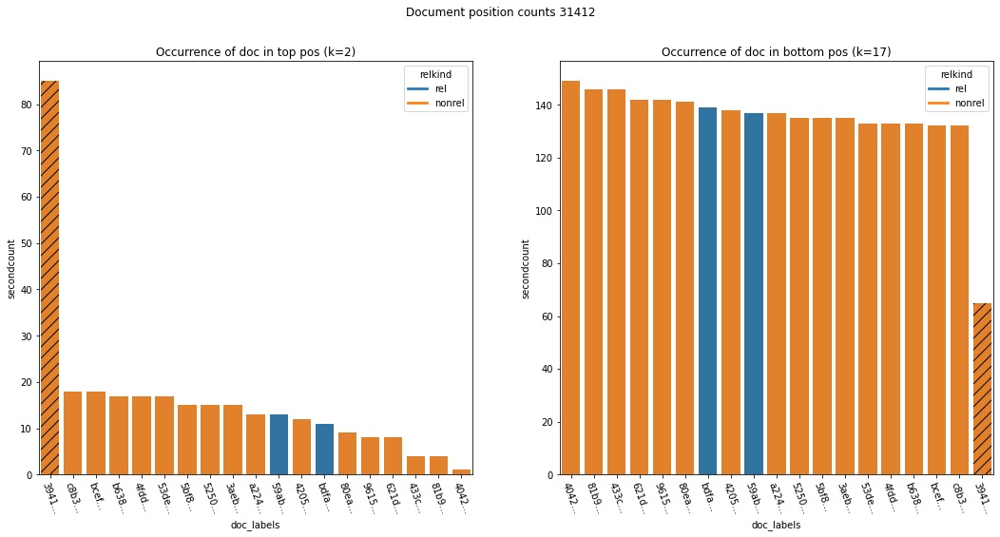

In [218]:
for q in edf_ac_base_A_9.qid.to_list():
    plot_doc_pos_count_for_qid(q,rdf_ac_base_A_9,reldf,sortby=['count'],no_author_ids=noauth_docids)

##### edf_ac_base_A_99

###### Percentage of top/bottom 10 queries with an authorless document

In [230]:
2/10 * 100

20.0

In [231]:
2/10 * 100

20.0

###### Visualization

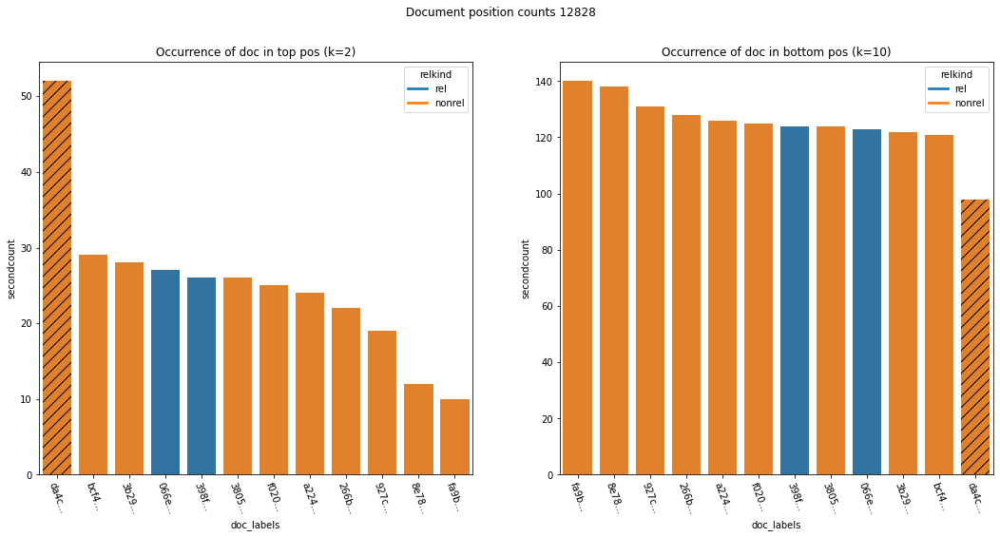

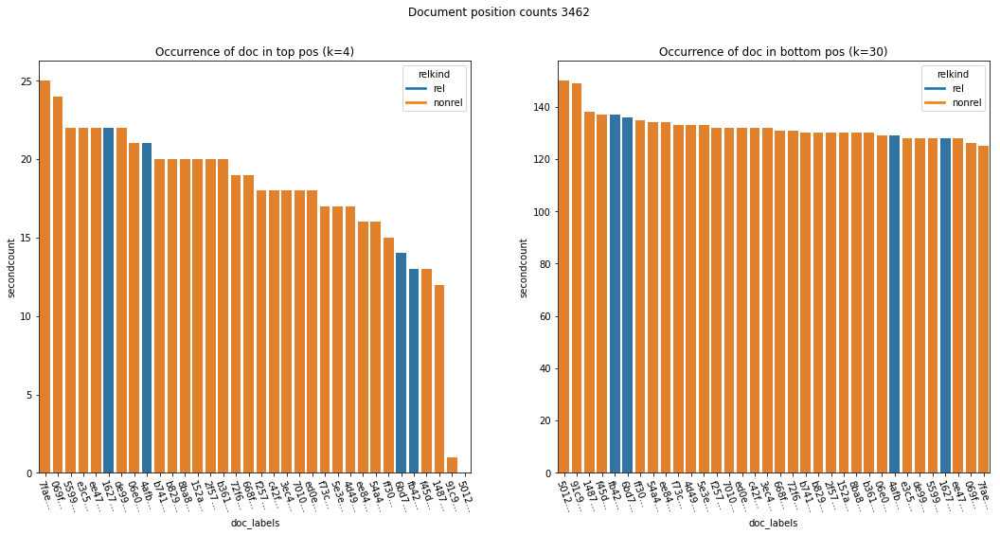

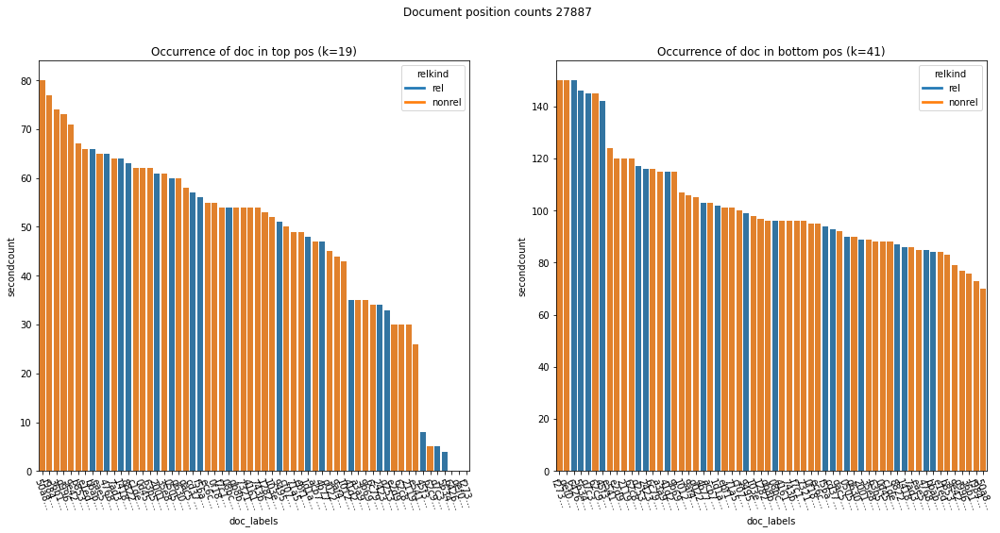

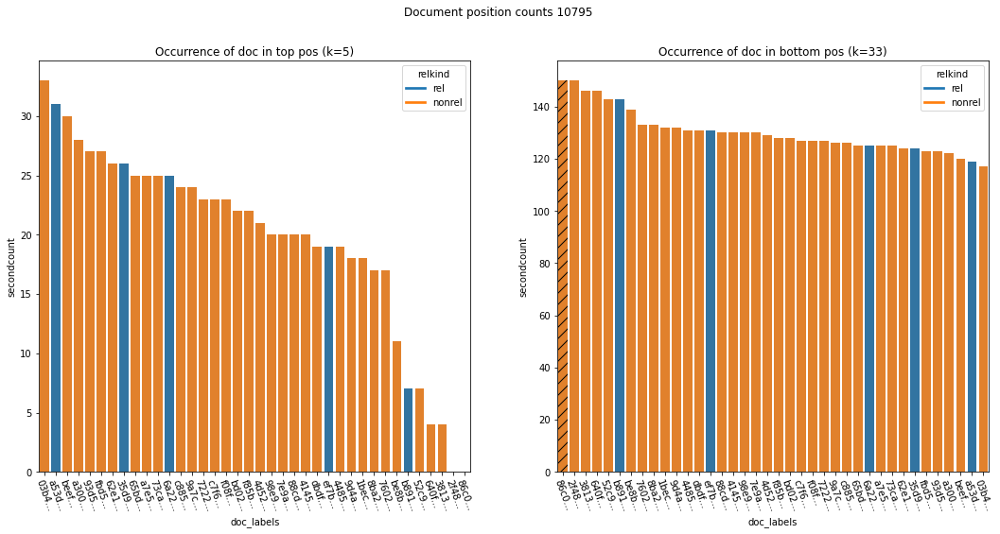

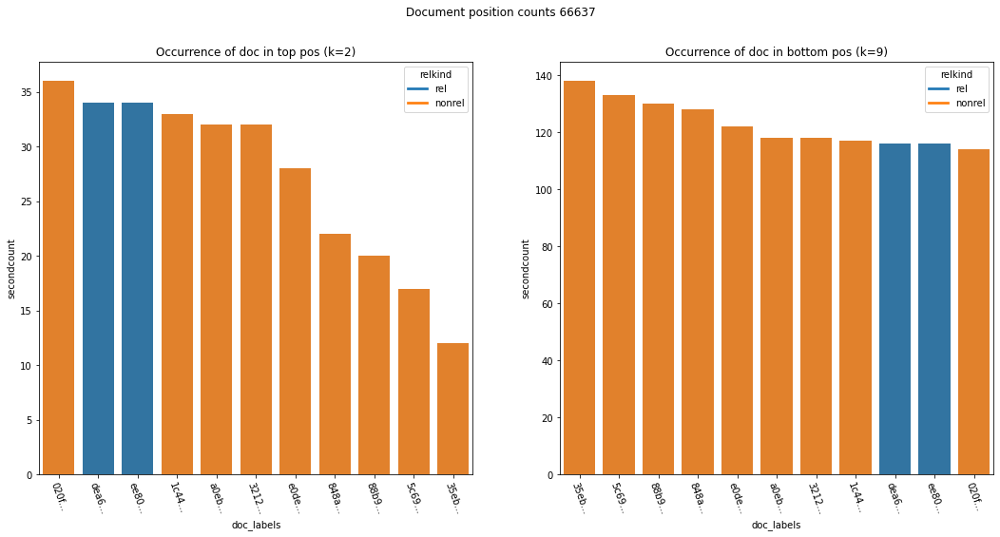

...

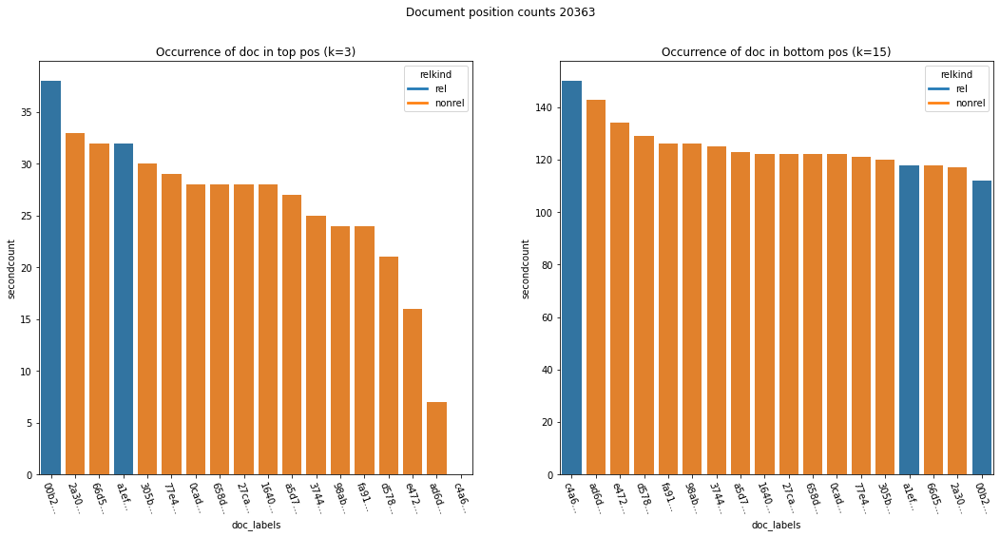

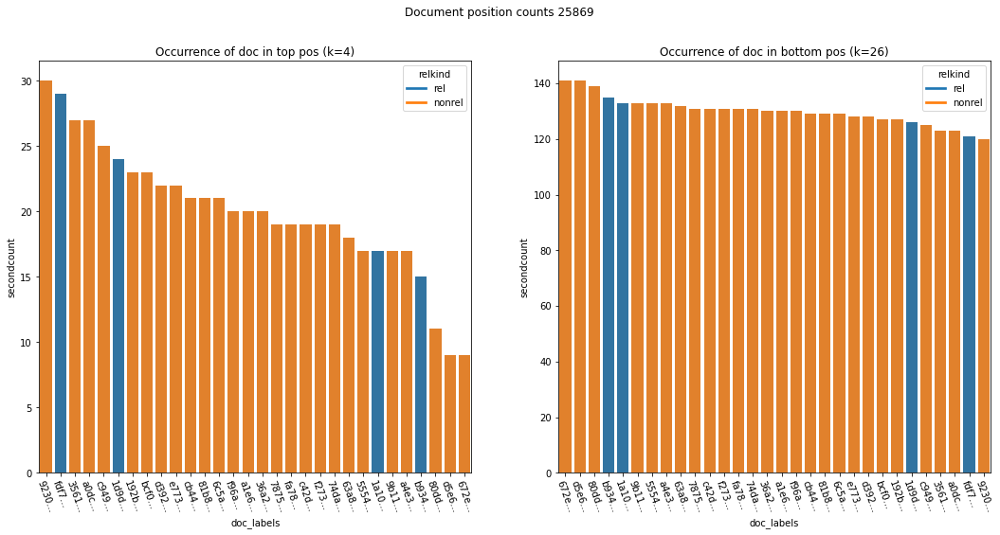

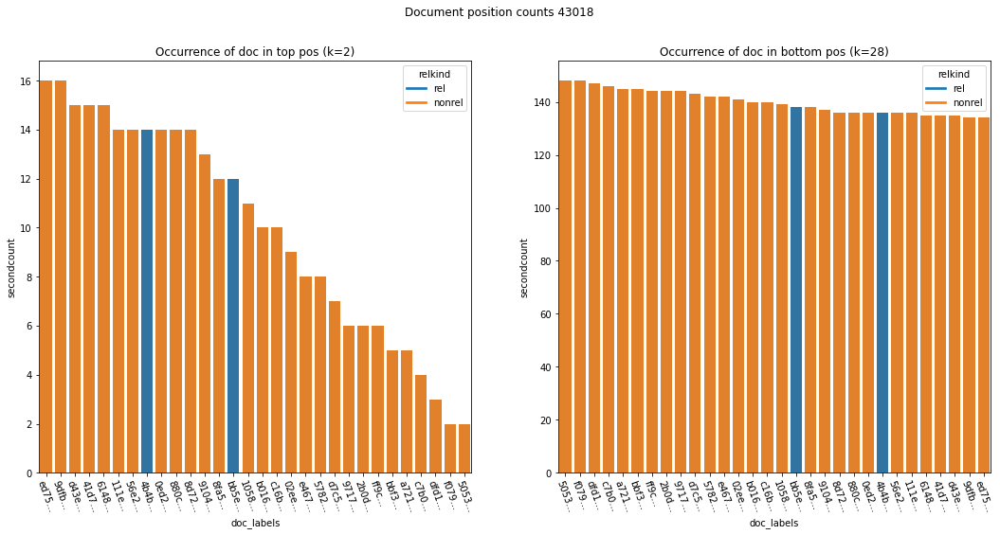

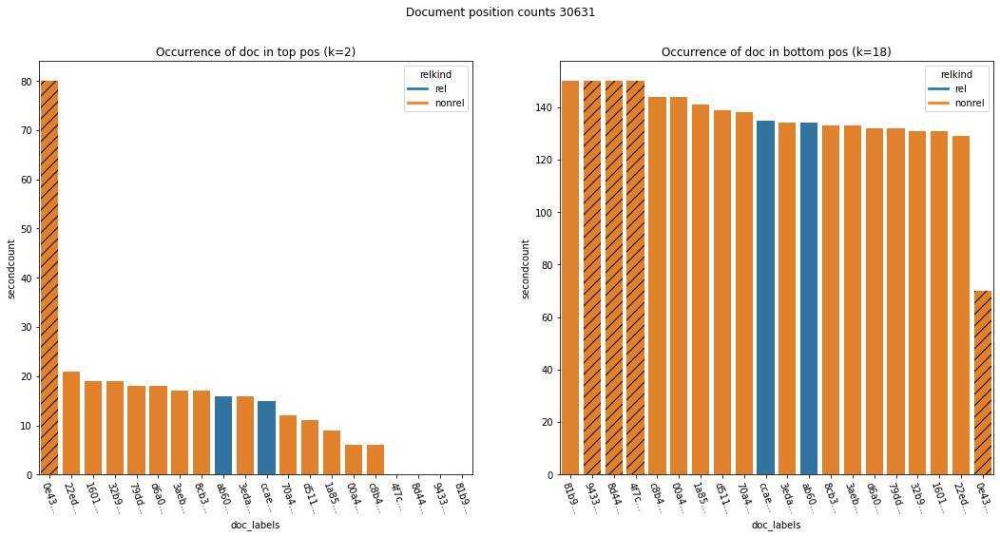

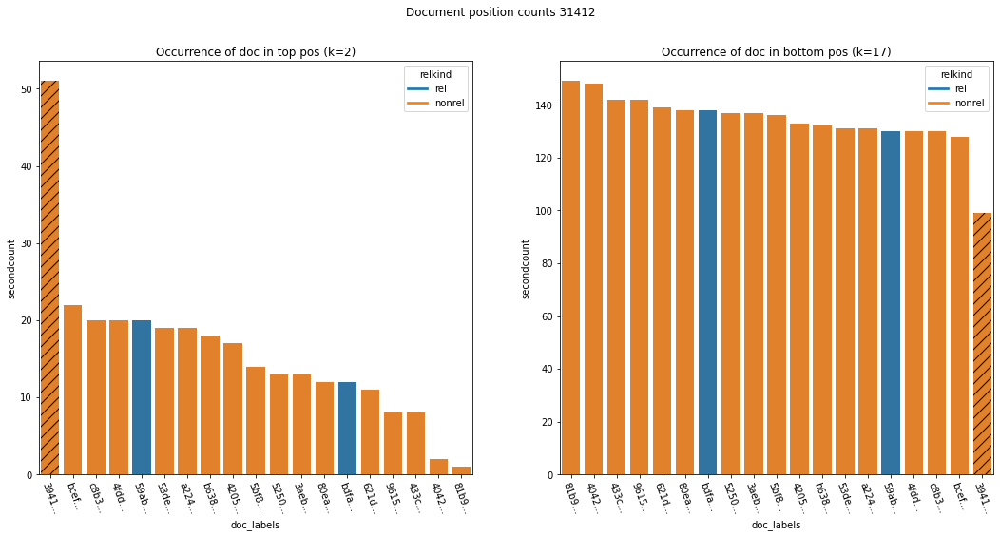

In [224]:
for q in edf_ac_base_A_99.qid.to_list():
    plot_doc_pos_count_for_qid(q,rdf_ac_base_A_99,reldf,sortby=['count'],no_author_ids=noauth_docids)

##### edf_ac_base_B_9

###### Percentage of top/bottom 10 queries with an authorless document

In [232]:
4/10 * 100

40.0

In [233]:
3/10 * 100

30.0

###### Visualization

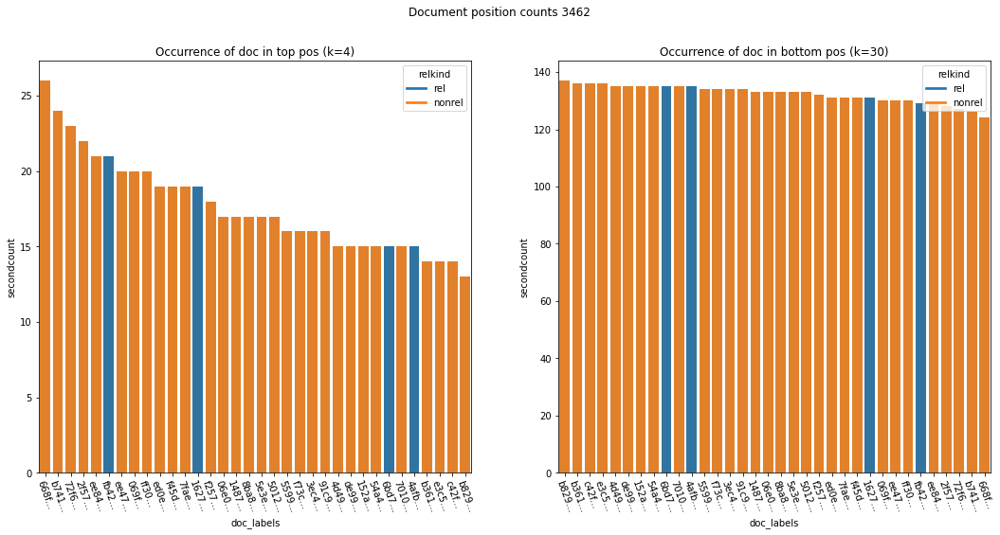

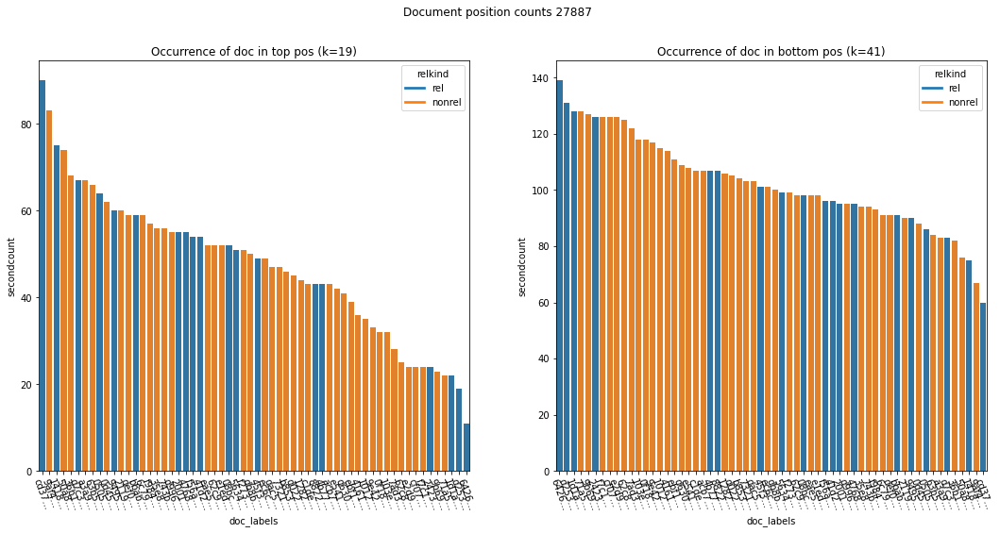

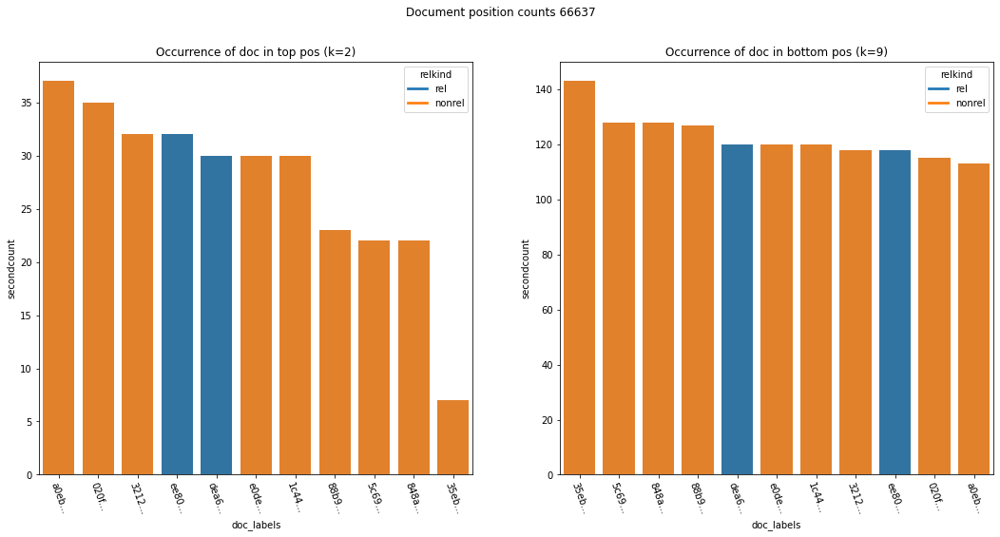

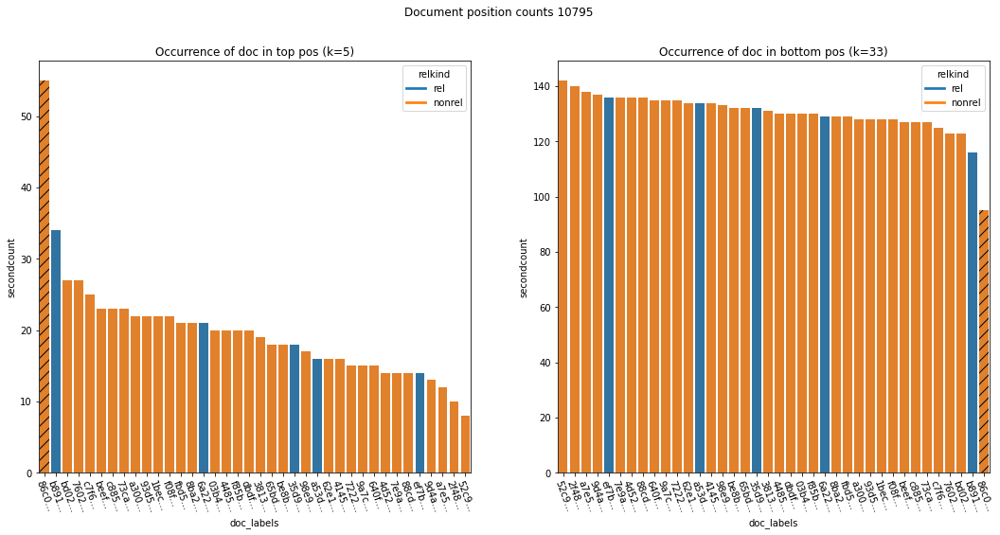

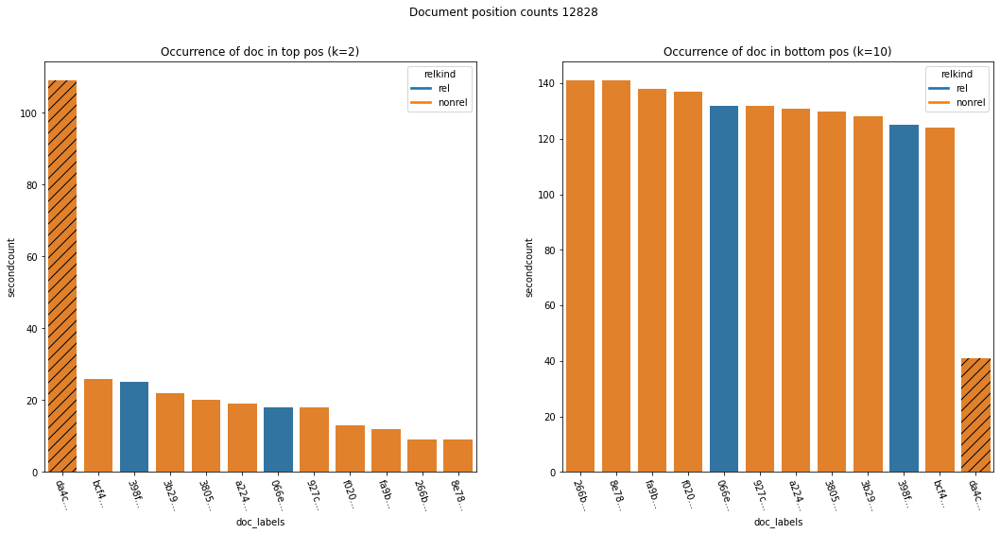

...

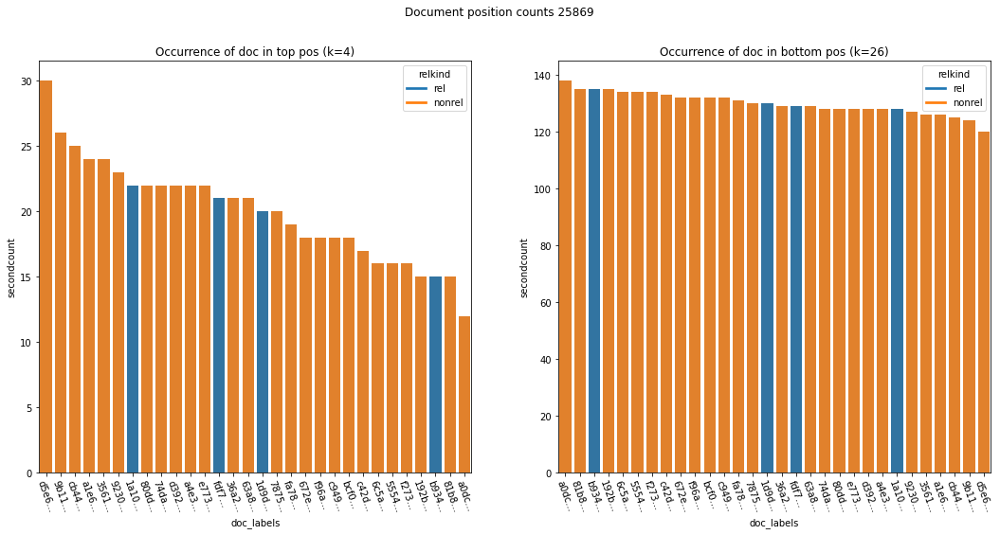

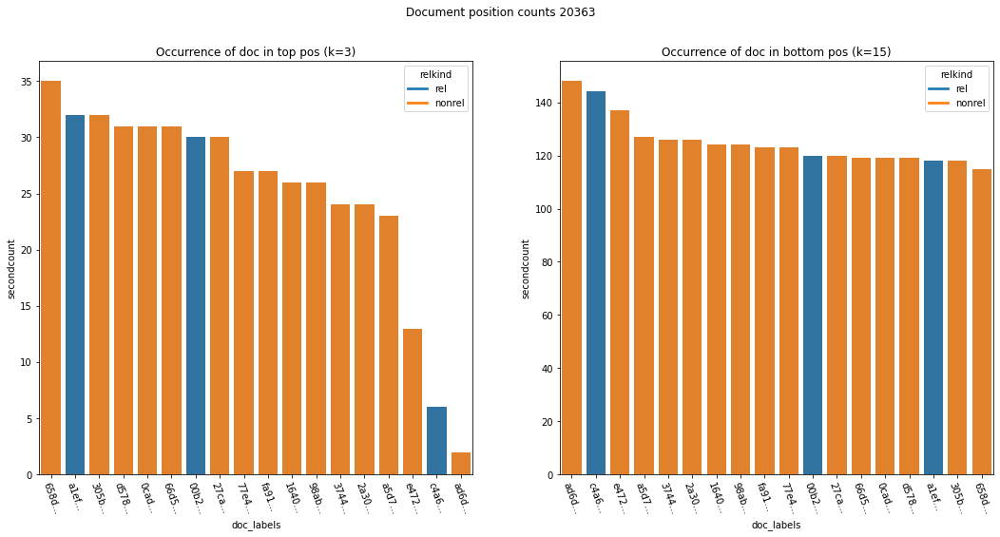

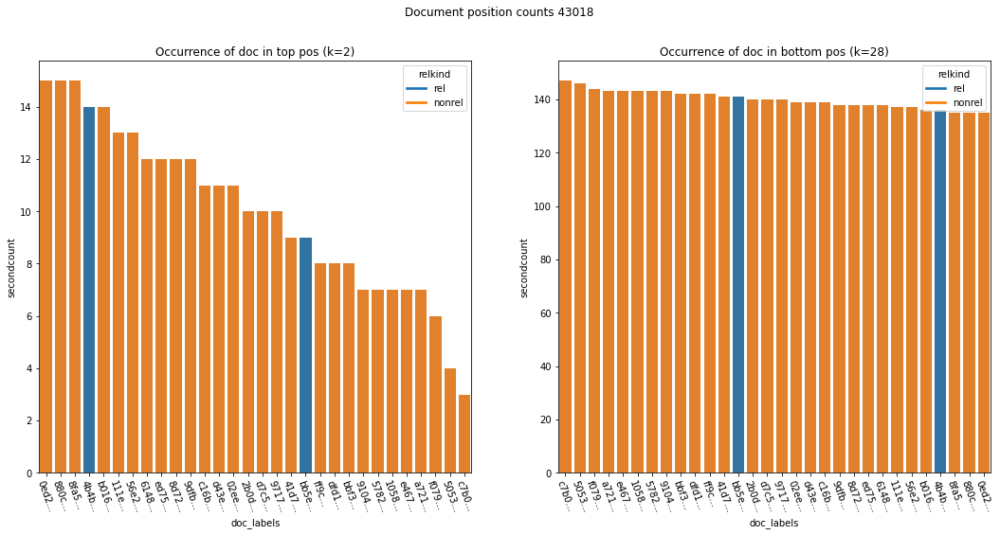

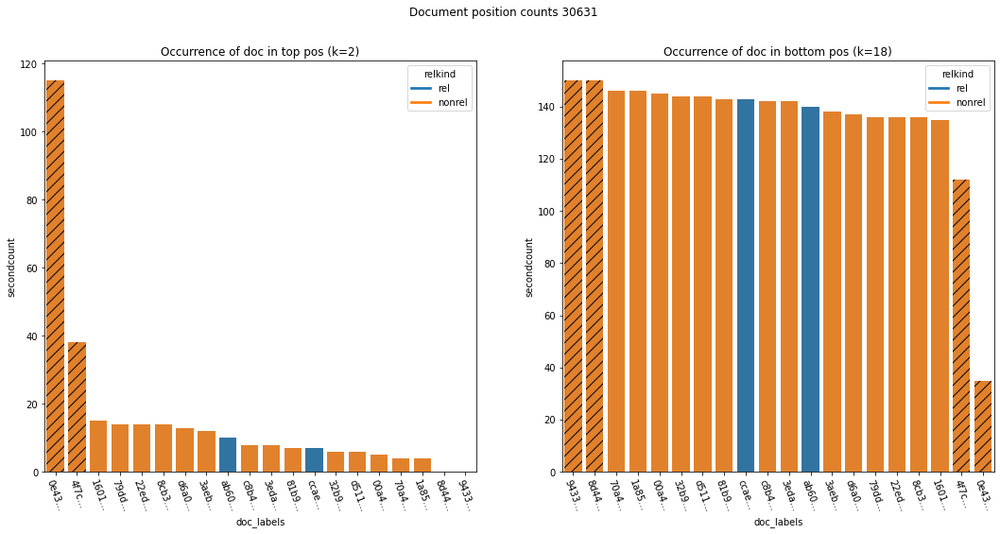

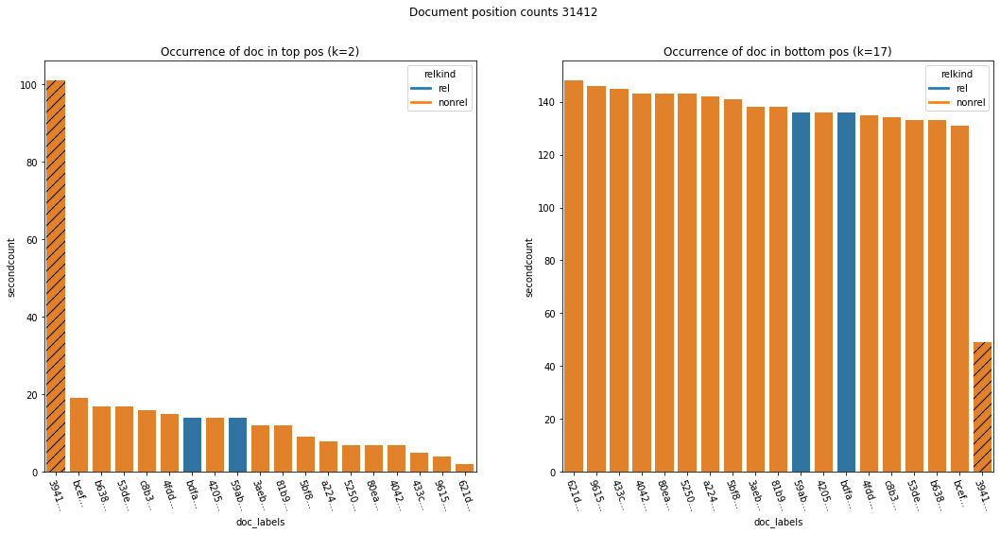

In [225]:
for q in edf_ac_base_B_9.qid.to_list():
    plot_doc_pos_count_for_qid(q,rdf_ac_base_B_9,reldf,sortby=['count'],no_author_ids=noauth_docids)

##### edf_ac_base_B_99

###### Percentage of top/bottom 10 queries with an authorless document

In [230]:
2/10 * 100

20.0

In [231]:
2/10 * 100

20.0

###### Visualization

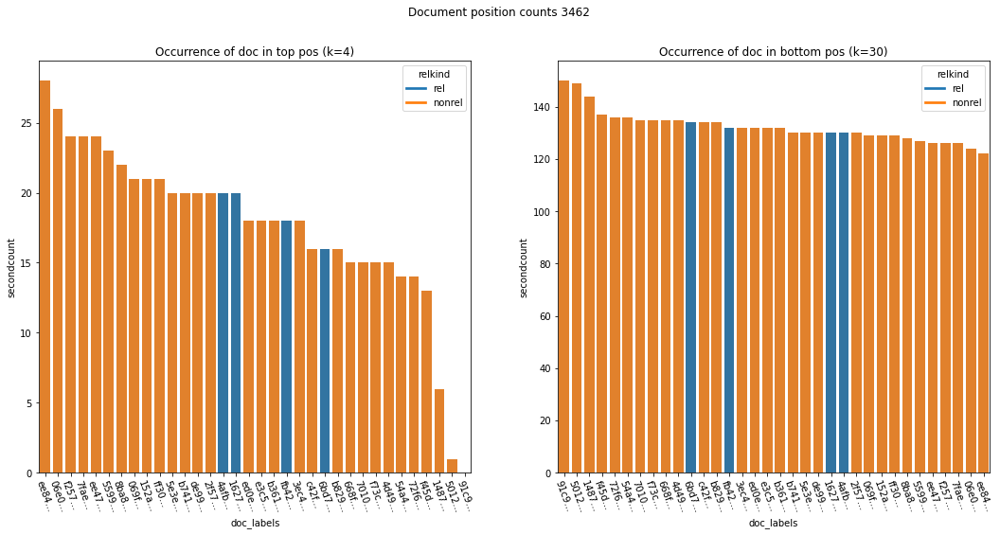

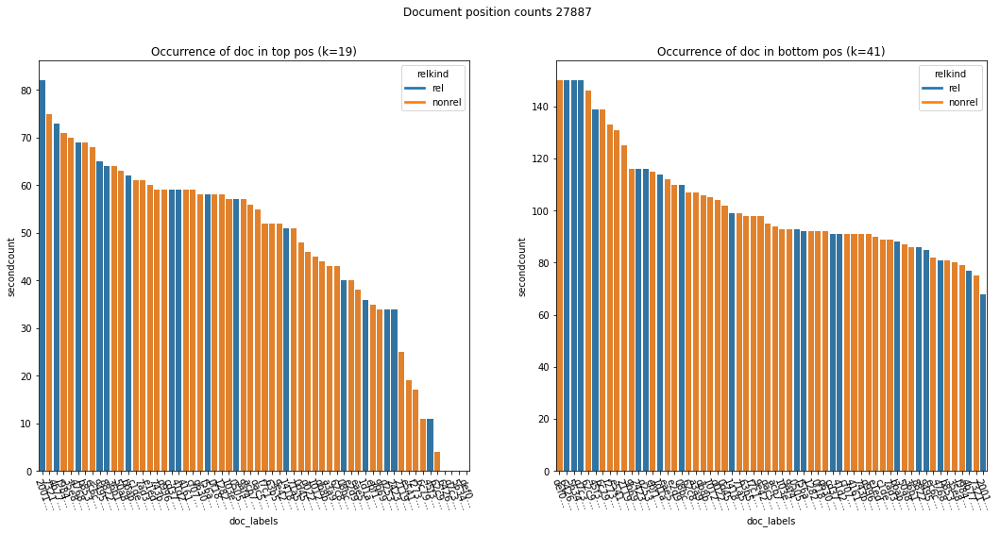

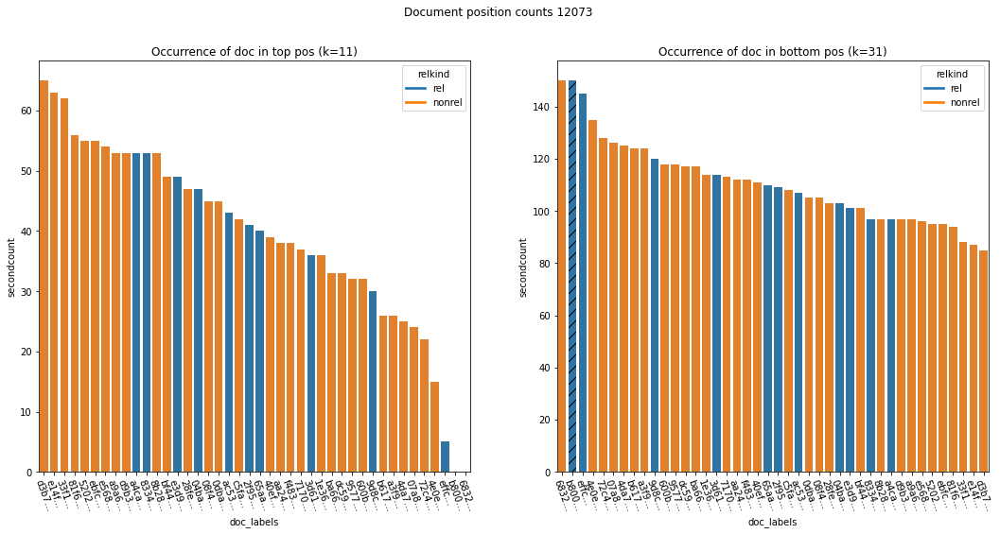

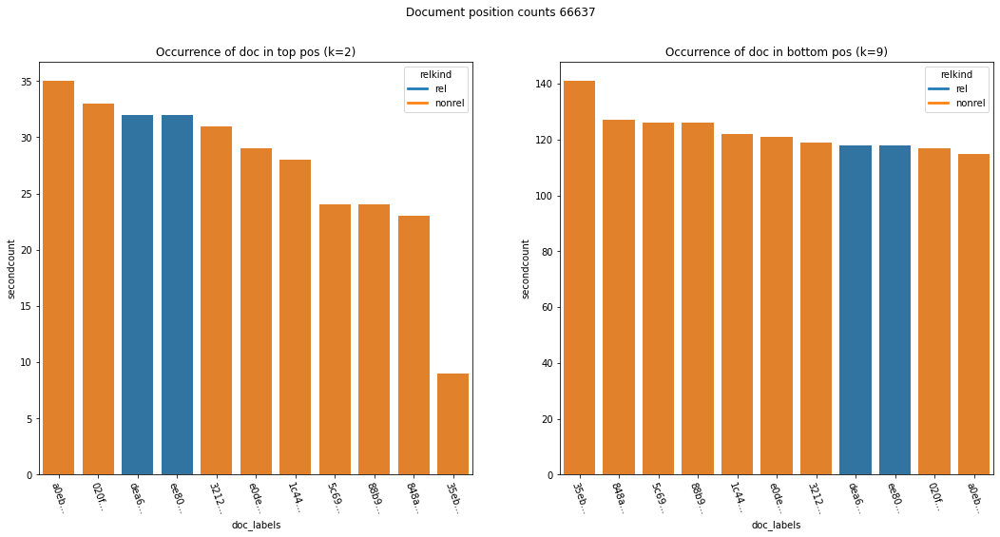

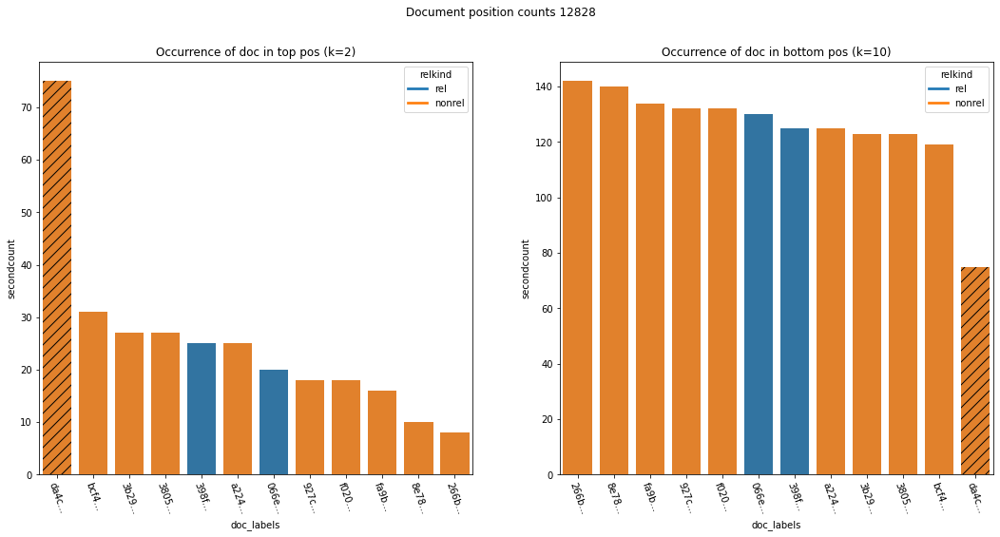

...

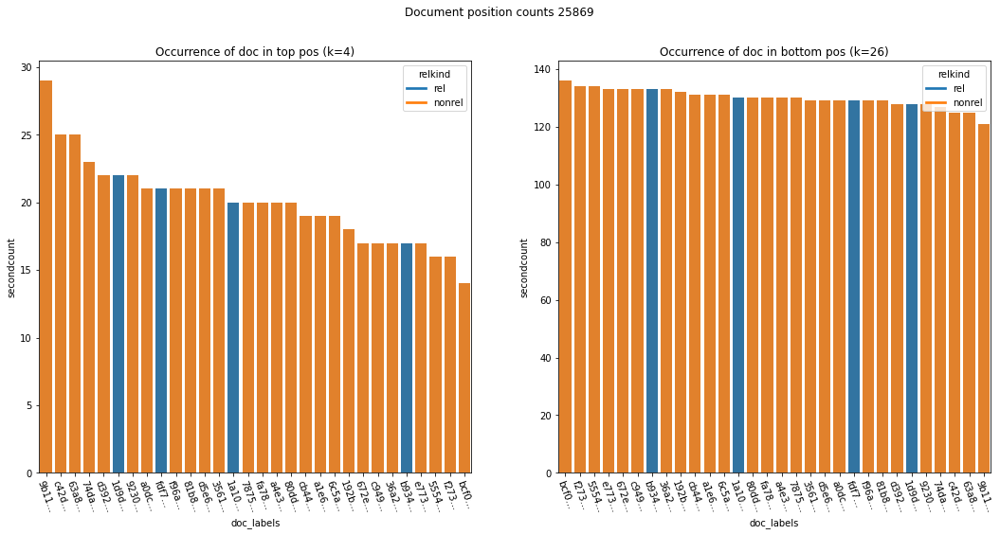

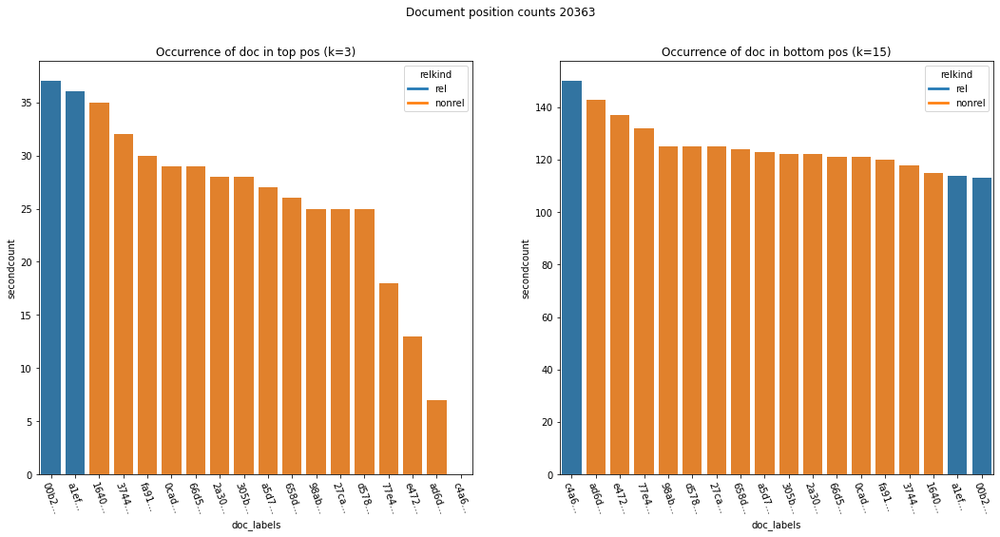

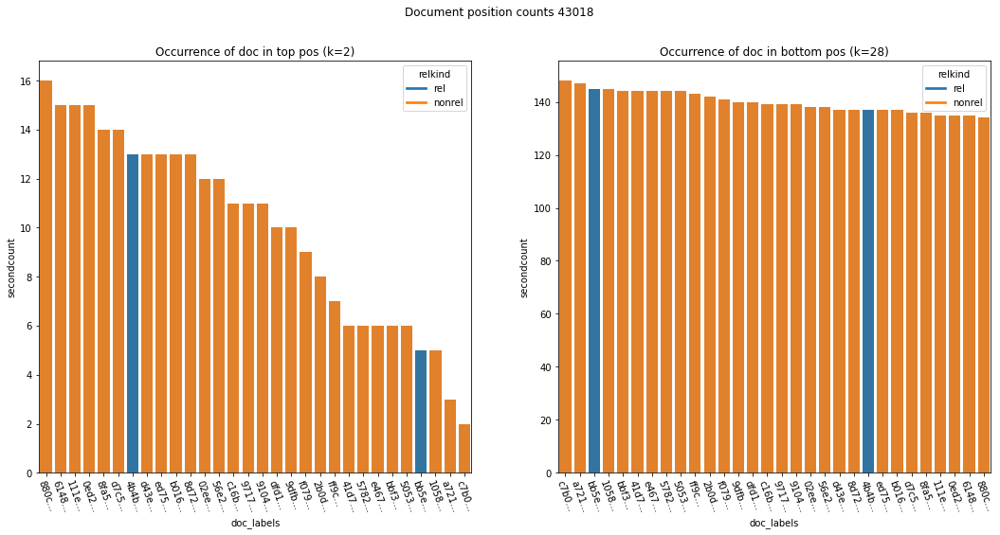

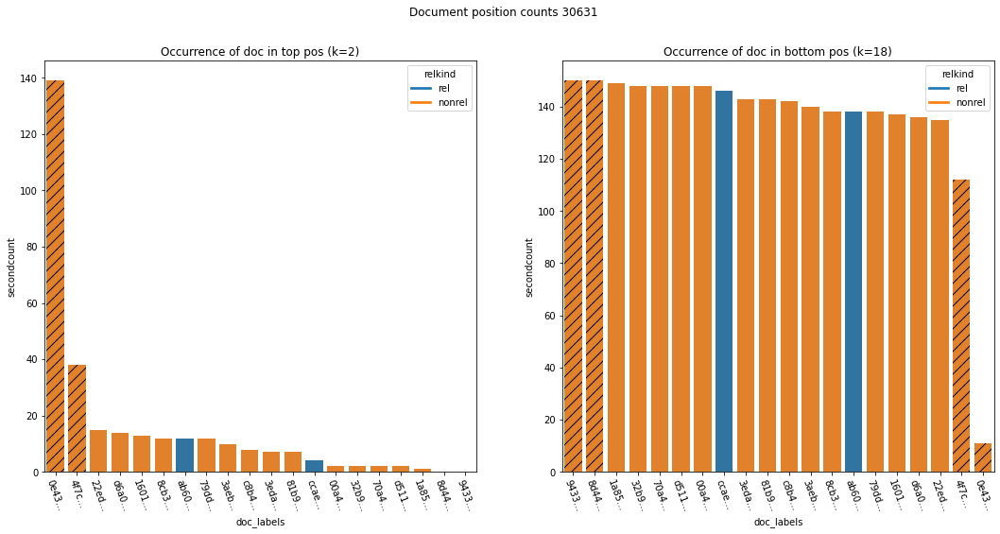

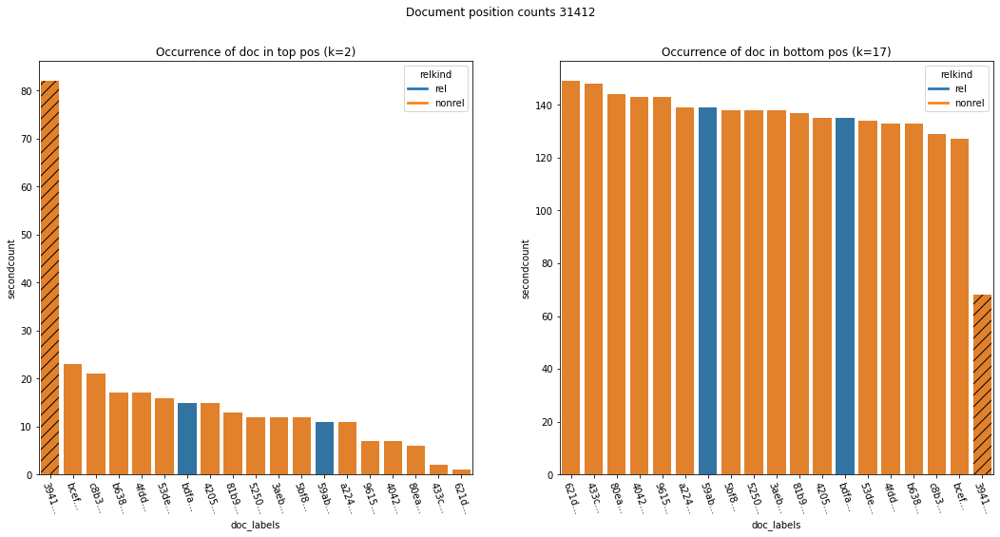

In [226]:
for q in edf_ac_base_B_99.qid.to_list():
    plot_doc_pos_count_for_qid(q,rdf_ac_base_B_99,reldf,sortby=['count'],no_author_ids=noauth_docids)

##### all AC configs

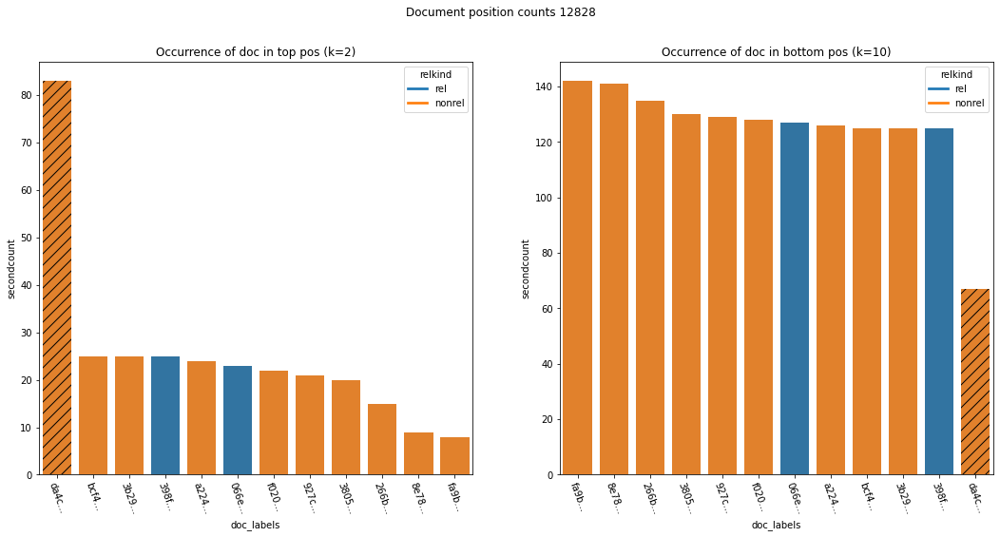

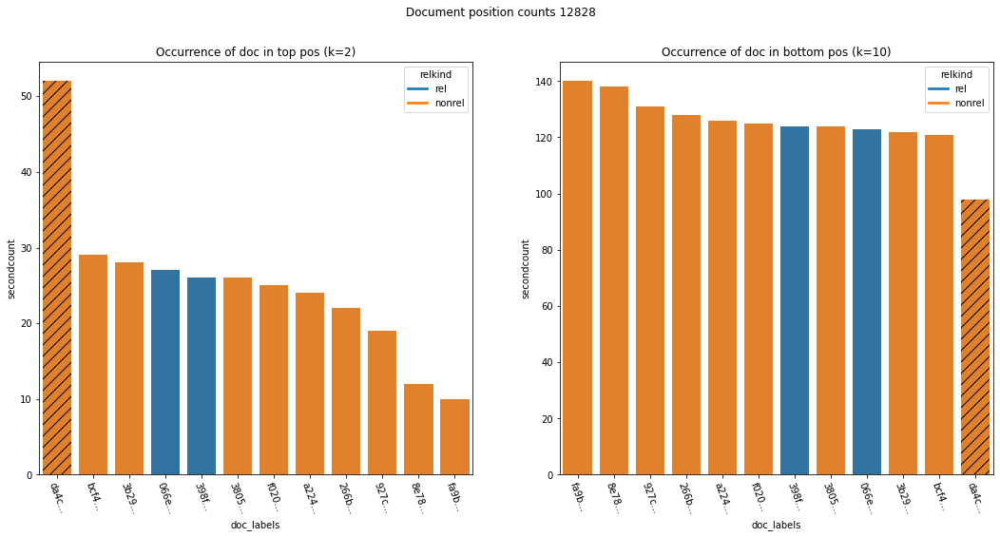

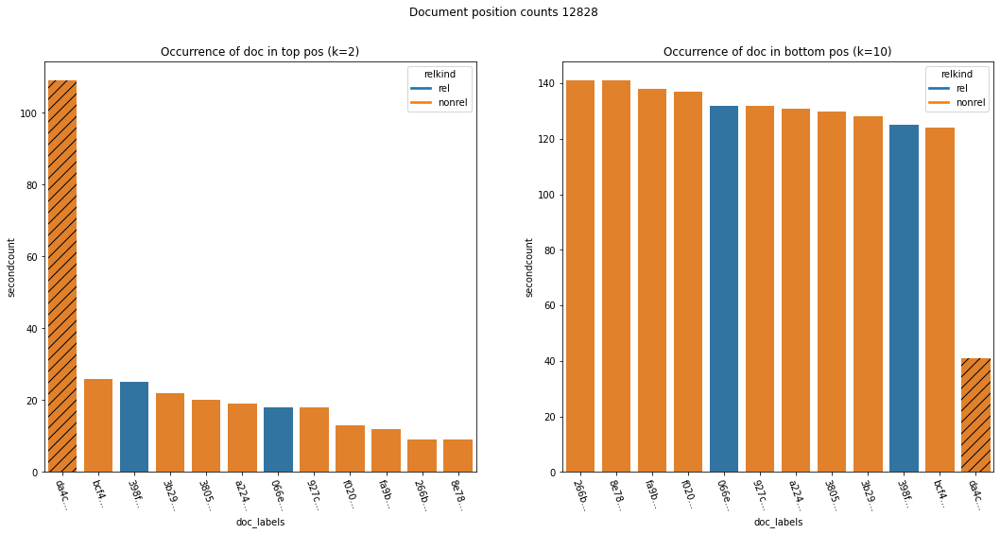

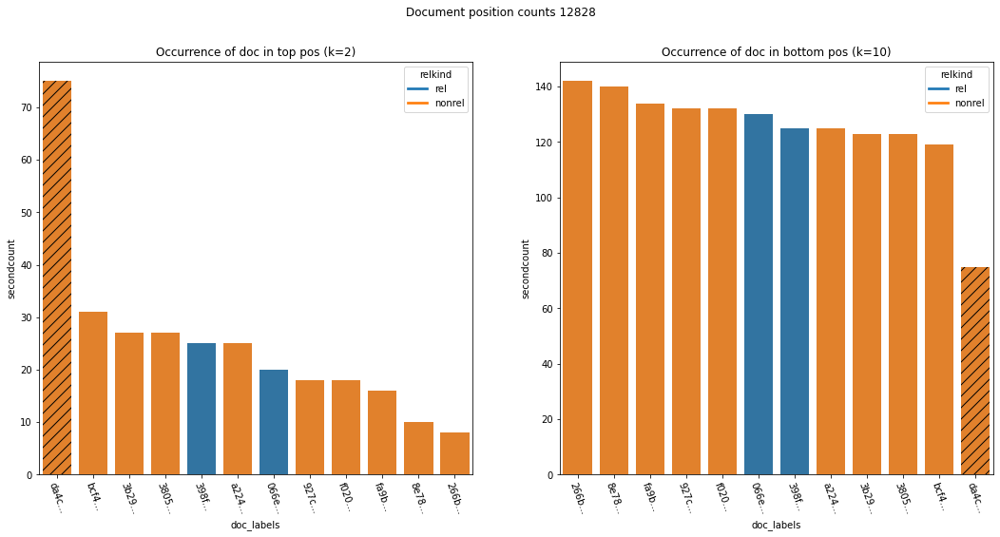

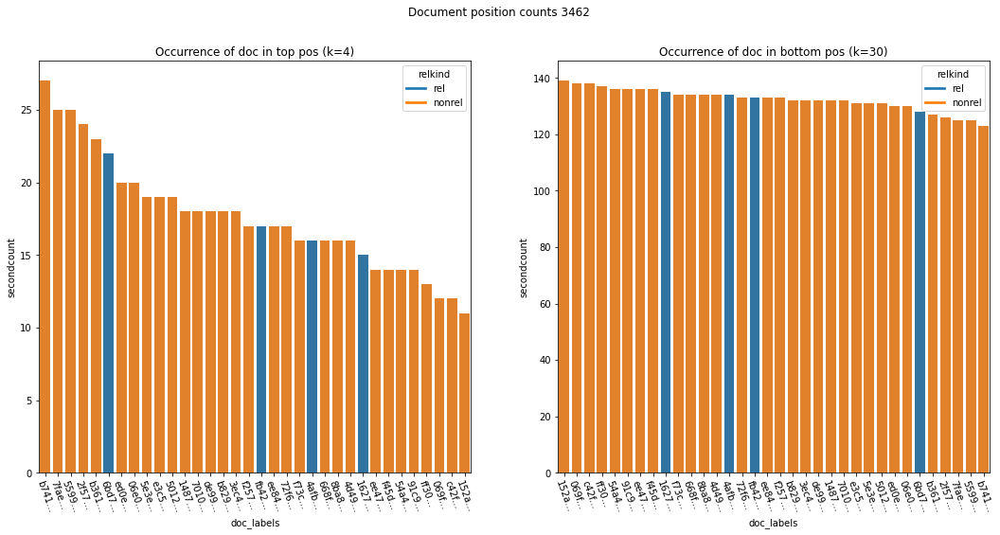

...

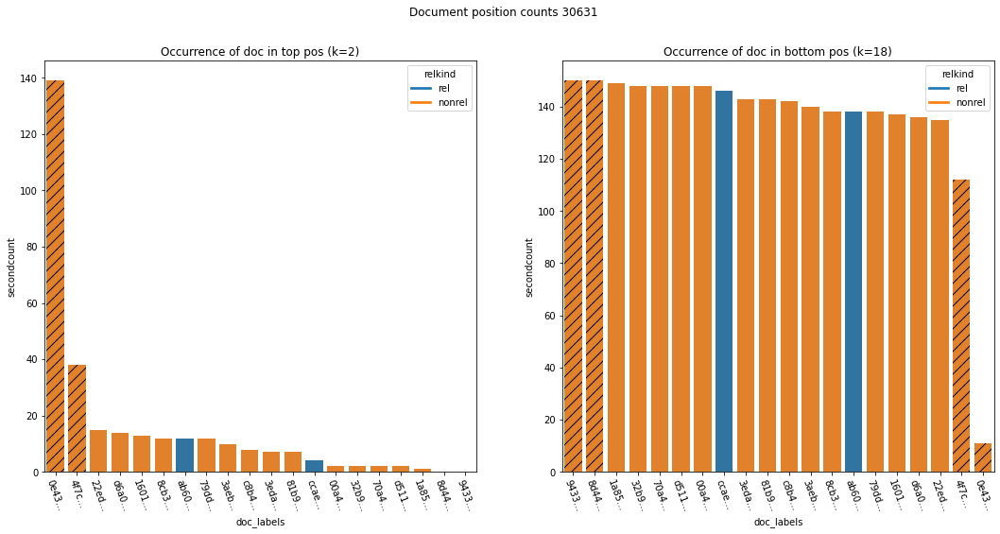

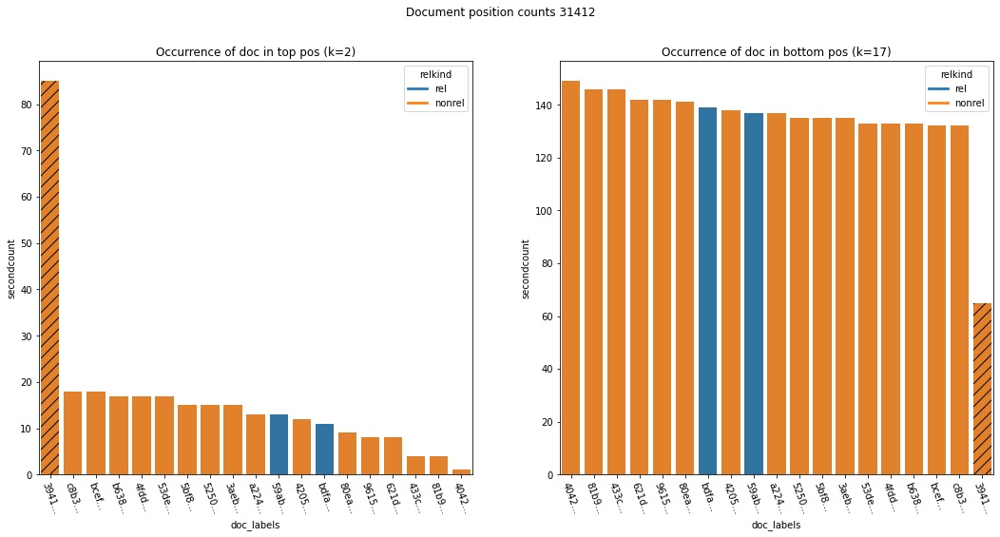

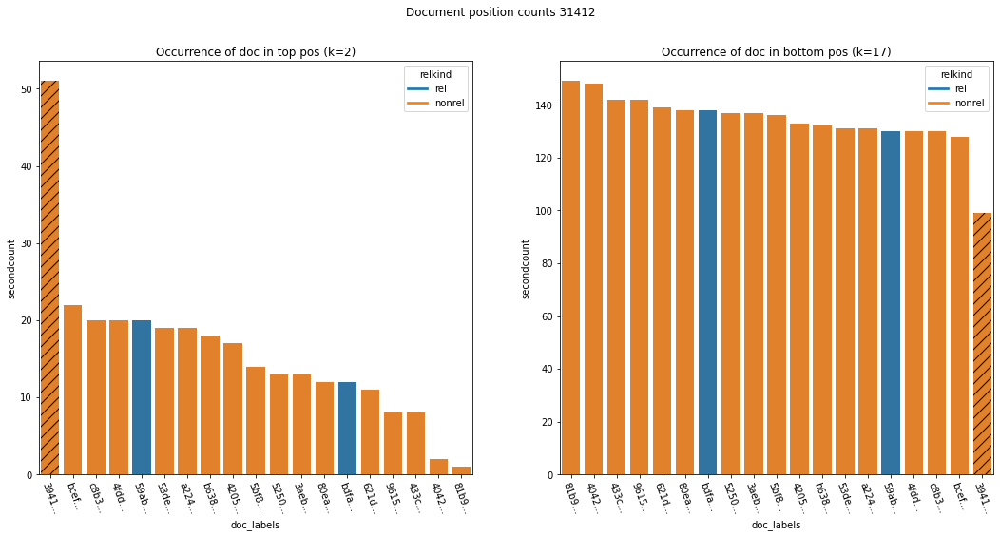

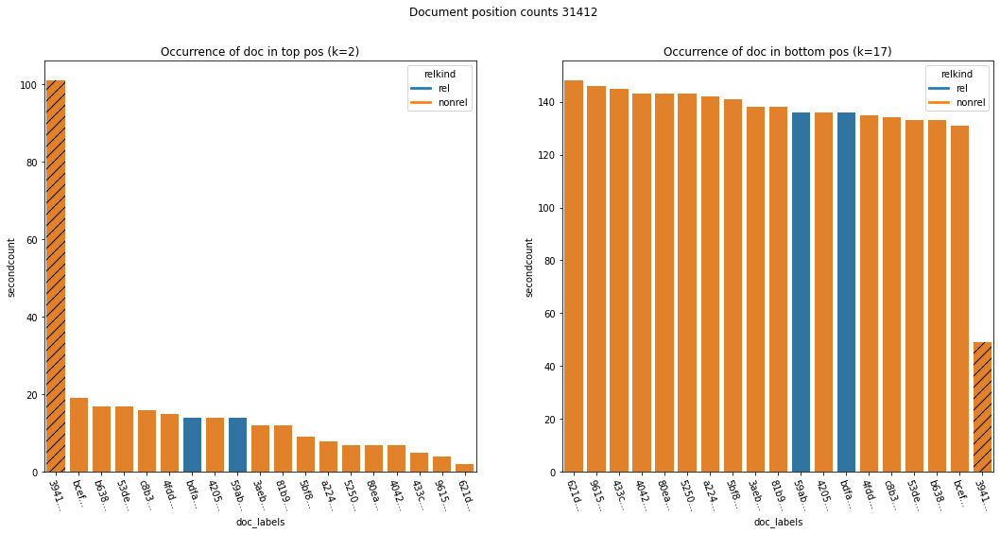

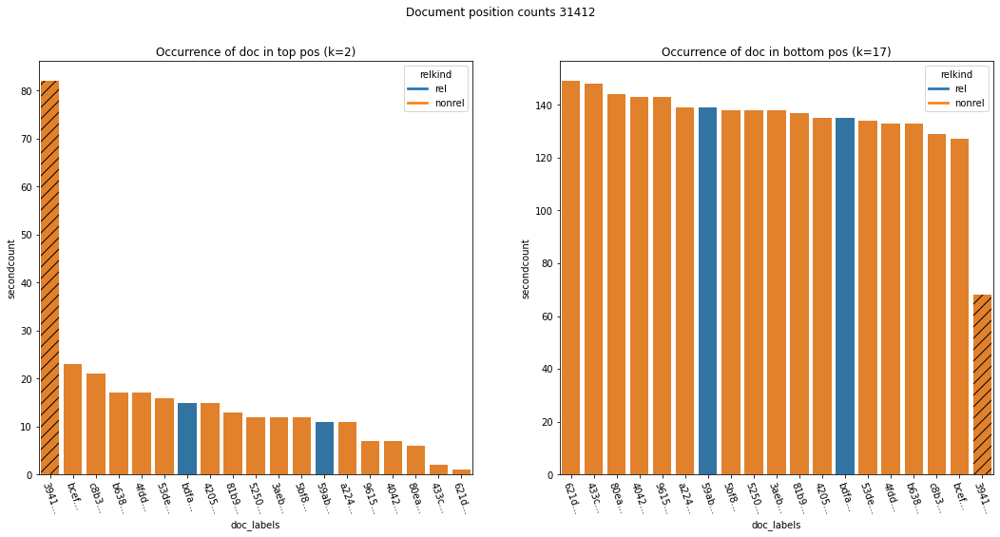

In [227]:
for q in edf_ac_base_A_99.qid.to_list():
    plot_doc_pos_count_for_qid(q,rdf_ac_base_A_9,reldf,sortby=['count'],no_author_ids=noauth_docids)
    plot_doc_pos_count_for_qid(q,rdf_ac_base_A_99,reldf,sortby=['count'],no_author_ids=noauth_docids)
    plot_doc_pos_count_for_qid(q,rdf_ac_base_B_9,reldf,sortby=['count'],no_author_ids=noauth_docids)
    plot_doc_pos_count_for_qid(q,rdf_ac_base_B_99,reldf,sortby=['count'],no_author_ids=noauth_docids)

#### H: Documents without author that are (not) advantaged have a relatively high (low) estimated relevance

##### 12073
- b800... advantaged for $\theta = 0.9$, disadvantaged for $\theta = 0.99$  
  - A: 0.110601, pos 34/42
  - B: 0.070365, pos 41/42 
- Relatively poor estimated relevance

In [239]:
ereldf_A[ereldf_A.qid == 12073].sort_values(by='est_relevance',ascending=False).reset_index(drop=True)

,qid,doc_id,relevance,est_relevance
0,12073,07a8123ba4e50378a9c89aa0aa5134e2e600bc07,0,0.228761
1,12073,a3f9dcf7170105ce1e39a63ae99f7334ecaf3182,0,0.225697
2,12073,ba66ca44721b80f9dd2bd7d675150d722264dbf2,0,0.214153
3,12073,9d8ccd08ae89d502d3d75ec046dff942f260cb7a,1,0.212898
4,12073,600b2f9b556295cba4db856f917824e46da6e338,0,0.212710
5,12073,08f4b3d292d801878ec3b0445e35ef4ad8c5193e,0,0.202161
6,12073,c5fab88c2b128bfba9ac4c6197e19bc9e4e6b2a3,0,0.199403
7,12073,33f1a8d9f516c736eddfa292d922774220cb8bd6,0,0.197423
8,12073,ebfc96d215389f1f284c1e51d20473fd935d6448,0,0.197115
9,12073,8b28194acc5d5d7c2161e4fc73198b70bebf4a3d,0,0.196906


In [241]:
ereldf_B[ereldf_B.qid == 12073].sort_values(by='est_relevance',ascending=False).reset_index(drop=True)

,qid,doc_id,relevance,est_relevance
0,12073,a3f9dcf7170105ce1e39a63ae99f7334ecaf3182,0,0.248407
1,12073,07a8123ba4e50378a9c89aa0aa5134e2e600bc07,0,0.242377
2,12073,600b2f9b556295cba4db856f917824e46da6e338,0,0.222424
3,12073,ba66ca44721b80f9dd2bd7d675150d722264dbf2,0,0.213384
4,12073,9d8ccd08ae89d502d3d75ec046dff942f260cb7a,1,0.211169
5,12073,65aadf99f4bb5948164f65a99d46d1fafc74e158,1,0.205519
6,12073,3d614a0da2dc71c4068f8e9bcc32067959b8e00f,1,0.199011
7,12073,ebfc96d215389f1f284c1e51d20473fd935d6448,0,0.192332
8,12073,8b28194acc5d5d7c2161e4fc73198b70bebf4a3d,0,0.191795
9,12073,8334919584cd6ae64869c68a34d73c27f9b02dbe,1,0.189877


##### 54003
- f098... advantaged
  - A: 0.110638, pos 10/12
  - B: 0.212732, pos 2/12 
- cb5c... advantaged for all except B, $\theta = 0.99$
  - A: 0.110638, pos 11/12
  - B: 0.212732, pos 3/12 

- The two documents have the same estimated relevance, order broken randomly.
- For the one setting for which cb5c... is less advantaged its relative relevance is good.
- May have something to do with random breaking of ties: currently always in the same pandas-determined order, but may be better to break ties randomly so at least not same item always advantaged!

In [242]:
ereldf_A[ereldf_A.qid == 54003].sort_values(by='est_relevance',ascending=False).reset_index(drop=True)

,qid,doc_id,relevance,est_relevance
0,54003,e3c4eb70e447d12308e32f3b01aefb12c31d3436,0,0.207594
1,54003,f6d0c86e407ef0dfdd3de1ae675999e05ef46cfd,0,0.206637
2,54003,752ebeff241d9412b337a91726585c1d0d20abd6,1,0.204991
3,54003,ac073aad573ef9ca951d7f494d558ff9d2c0618f,0,0.191865
4,54003,fa04d8f27007cd5ce58071792b0e6db099f1c239,0,0.180354
5,54003,01b96c0608e3608017f7024f833d758d80ee2141,1,0.180158
6,54003,ee4b17775ef5eb4cb249d538d6398105fb95ba8c,0,0.176954
7,54003,25df388cb0718f4fdcf6ccb7f790408b12af0658,0,0.164716
8,54003,7afe176bcc6837cd312e6c65f62369929dae60c1,0,0.153217
9,54003,f098b954118322937fbeab72167316c6487bd532,0,0.110638


In [243]:
ereldf_B[ereldf_B.qid == 54003].sort_values(by='est_relevance',ascending=False).reset_index(drop=True)

,qid,doc_id,relevance,est_relevance
0,54003,7afe176bcc6837cd312e6c65f62369929dae60c1,0,0.217627
1,54003,f098b954118322937fbeab72167316c6487bd532,0,0.212732
2,54003,cb5c8551f3da94fed52008243732ed4bbf4dc286,0,0.212732
3,54003,e3c4eb70e447d12308e32f3b01aefb12c31d3436,0,0.185959
4,54003,752ebeff241d9412b337a91726585c1d0d20abd6,1,0.179287
5,54003,f6d0c86e407ef0dfdd3de1ae675999e05ef46cfd,0,0.169841
6,54003,463be6db0487c1215bfa2896d3d636eac2a6ce34,0,0.153755
7,54003,ac073aad573ef9ca951d7f494d558ff9d2c0618f,0,0.139786
8,54003,01b96c0608e3608017f7024f833d758d80ee2141,1,0.106601
9,54003,25df388cb0718f4fdcf6ccb7f790408b12af0658,0,0.104794


##### 51432
- acf1... advantaged for $\theta = 0.9$, dis for opposite
  - A: 0.071057, pos 48/51
  - B: 0.086018, pos 47/51 
- ba0a... advantaged for $\theta = 0.9$, dis for opposite
  - A: 0.079387, pos 42/58
  - B: 0.084094, pos 50/51 


- Both documents have relatively poor est rel, they're advantaged by the hyp par config that weighs author advantage more and disadv by the config that weighs est rel more.

In [72]:
ereldf_A[ereldf_A.qid == 51432].sort_values(by='est_relevance', ascending=False).reset_index(drop=True)

,qid,doc_id,relevance,est_relevance
0,51432,030a0f9d97c9e2a5099723bcc9e74c34e7a95945,0,0.259777
1,51432,55d484c6fcc6fa00bdfe3dc8d579b870ad248f2e,0,0.226058
2,51432,bd69676ffba4e47cb3dfbac57583f633ac3b1b1c,0,0.225686
3,51432,e4e35f7150db8c3828dd6089c6dc0dc7f0b56bdd,0,0.222249
4,51432,00f1fe233881777c97ead8528324e7c807ef9dfc,0,0.220502
5,51432,4b0d321b796d2ed4705617be64d8c70a4653704f,1,0.216382
6,51432,d1fadcb994e67399b10d9721c2cb86fae8a0f15f,1,0.212398
7,51432,bf3c811311babb0cfd45f335641649bf563112dd,0,0.211209
8,51432,c312b1424c9d25fd8ebd1f01a0c7fb6cba9e998f,0,0.209965
9,51432,022fefc586dc4245aa714419a0d6b16ceff5afc3,0,0.203478


In [73]:
ereldf_B[ereldf_B.qid == 51432].sort_values(by='est_relevance',ascending=False).reset_index(drop=True)

,qid,doc_id,relevance,est_relevance
0,51432,030a0f9d97c9e2a5099723bcc9e74c34e7a95945,0,0.254169
1,51432,e4e35f7150db8c3828dd6089c6dc0dc7f0b56bdd,0,0.231194
2,51432,693914b7f38c19585e35668fd626aecf62d4c5e7,0,0.221726
3,51432,55d484c6fcc6fa00bdfe3dc8d579b870ad248f2e,0,0.210191
4,51432,bd69676ffba4e47cb3dfbac57583f633ac3b1b1c,0,0.209889
5,51432,3ae06b21b40cffa07ac1e92e0c453aa835f8a70b,0,0.206883
6,51432,00f1fe233881777c97ead8528324e7c807ef9dfc,0,0.203619
7,51432,8f74f5623c4e5c5931641a264cfd7c02097e1e22,0,0.201999
8,51432,4b0d321b796d2ed4705617be64d8c70a4653704f,1,0.201753
9,51432,bf3c811311babb0cfd45f335641649bf563112dd,0,0.196458


##### 30631
- 0e43... advantaged
  - A: 0.124778, pos 16/20
  - B: 0.213887, pos 1/20 
- 9433... disadvantaged
  - A: 0.124778, pos 19/20
  - B: 0.157759, pos 11/20 
- 8d44... disadvantaged
  - A: 0.104101, pos 18/20
  - B: 0.149880, pos 12/20
- 4f7c... advantaged, except disadvantaged for set A
  - A: 0.111590, pos 17/20
  - B: 0.212311, pos 3/20
  
- All disadvantaged have low relative position.
- 0e43 advantaged regardless of position, helped by disadvantaging of 4f7c for set A? They are close in est rel/pos.
- Interesting here that there are four authorless documents, muddling factor? Correction breaks down when no author info available?

In [246]:
ereldf_A[ereldf_A.qid == 30631].sort_values(by='est_relevance',ascending=False).reset_index(drop=True)

,qid,doc_id,relevance,est_relevance
0,30631,1601e9f2bbf89f04f967a4f5f49d7adeca7f0719,0,0.231227
1,30631,32b9fbe02a36c08117122e3f99421faad46876db,0,0.222271
2,30631,79ddbeff892277592aa387045692e0a738ef9edf,0,0.219872
3,30631,22edc9d8bb18253cdbb7905492c73387b4aee8c4,0,0.208882
4,30631,d6a00a2777afe09954d240b2b7bd6a6e2011e04b,0,0.205536
5,30631,3aebc8afc97439a26332526ba4c362771e332087,0,0.196632
6,30631,8cb3c7f7716217bd54a97f220f73dc07ef1220c4,0,0.195076
7,30631,ab609df01b35223d4c1ec4d6fe84cfe349ad608b,1,0.191062
8,30631,3eda3b93c90dba68e1a8a50fa79d26155abd49db,0,0.174550
9,30631,ccaea944996c0935897cd6eb248d5f01367cd3c4,1,0.169794


In [247]:
ereldf_B[ereldf_B.qid == 30631].sort_values(by='est_relevance',ascending=False).reset_index(drop=True)

,qid,doc_id,relevance,est_relevance
0,30631,0e43caeb9d476264d307e8da0ad71ecc4d804ced,0,0.213887
1,30631,1601e9f2bbf89f04f967a4f5f49d7adeca7f0719,0,0.213887
2,30631,4f7cebcc071e129d41df4766d1aed1c55e236311,0,0.212311
3,30631,32b9fbe02a36c08117122e3f99421faad46876db,0,0.212182
4,30631,79ddbeff892277592aa387045692e0a738ef9edf,0,0.208915
5,30631,22edc9d8bb18253cdbb7905492c73387b4aee8c4,0,0.202029
6,30631,8cb3c7f7716217bd54a97f220f73dc07ef1220c4,0,0.184026
7,30631,d6a00a2777afe09954d240b2b7bd6a6e2011e04b,0,0.182281
8,30631,ab609df01b35223d4c1ec4d6fe84cfe349ad608b,1,0.182278
9,30631,3aebc8afc97439a26332526ba4c362771e332087,0,0.159646


##### 10795
- 86c0... advantaged for $\theta = 0.9$
  - A: 0.0, pos 37/37
  - B: 0.0, pos 37/37
  
- Has no erel so we set it to 0. 
- For config that weighs authors more this does not matter.



In [250]:
ereldf_A[ereldf_A.qid == 10795].sort_values(by='est_relevance',ascending=False).reset_index(drop=True)

,qid,doc_id,relevance,est_relevance
0,10795,ef7bfa013689524c27370ef7849789b48ff42656,1,0.251015
1,10795,4d5251c0520ee6698087ee37864079e19d56b2f8,0,0.237193
2,10795,4145a64995792f84d456e62ef83f1404251893c3,0,0.228462
3,10795,6a224ae28b30026c7d3566280123f0488d83c550,1,0.225445
4,10795,c7f6a6728adfa3d29327384bdfedb297ccff3613,0,0.207273
5,10795,f85bd7fe8f93f31ca95ac7fc79bffd7718172e87,0,0.205102
6,10795,9a7c723c68cfaaf25e9d015eddaedefb4a709f71,0,0.203882
7,10795,1becf91544a459746807e0a5e8f83957317765a4,0,0.202719
8,10795,c885d082a3840bc52205085597ab9445e3429748,0,0.202644
9,10795,88cd22f12775a79cd9cb402f3e25e19c02c2f058,0,0.201255


In [248]:
ereldf_B[ereldf_B.qid == 10795].sort_values(by='est_relevance',ascending=False).reset_index(drop=True)

,qid,doc_id,relevance,est_relevance
0,10795,ef7bfa013689524c27370ef7849789b48ff42656,1,0.247599
1,10795,4d5251c0520ee6698087ee37864079e19d56b2f8,0,0.229281
2,10795,4145a64995792f84d456e62ef83f1404251893c3,0,0.219887
3,10795,6a224ae28b30026c7d3566280123f0488d83c550,1,0.216713
4,10795,c7f6a6728adfa3d29327384bdfedb297ccff3613,0,0.199243
5,10795,f85bd7fe8f93f31ca95ac7fc79bffd7718172e87,0,0.196641
6,10795,9a7c723c68cfaaf25e9d015eddaedefb4a709f71,0,0.195112
7,10795,88cd22f12775a79cd9cb402f3e25e19c02c2f058,0,0.193753
8,10795,1becf91544a459746807e0a5e8f83957317765a4,0,0.193608
9,10795,c885d082a3840bc52205085597ab9445e3429748,0,0.193510


##### 31412
- 3941... advantaged
  - A: 0.076889, pos 17/19
  - B: 0.130235, pos 15/19
  
- Poor relative relevance, but advantaged nonetheless.


In [251]:
ereldf_A[ereldf_A.qid == 31412].sort_values(by='est_relevance',ascending=False).reset_index(drop=True)

,qid,doc_id,relevance,est_relevance
0,31412,c8b3f498a39dd52aceb684e7052bc5938c1aba51,0,0.243852
1,31412,bcefce5aef53be840a92db6302aff0b477daefa3,0,0.228132
2,31412,b638d404a28a56d5553e84bea7450712f5cf00ba,0,0.224887
3,31412,4fdde4e7831e03ad2219c87dbb8b32550772e931,0,0.209392
4,31412,59ab54f50c6a278425bdbf115921bd2f94923e28,1,0.190921
5,31412,3aebc8afc97439a26332526ba4c362771e332087,0,0.180838
6,31412,4205add90858f6d1d8f942bb909fb5c95aa5821b,0,0.174241
7,31412,a224d37a6023762fe465fd56e9c6ed00423a2930,0,0.171503
8,31412,5bf8e8f158130dabba8cb5af3df9f18d8d2bcf3f,0,0.166592
9,31412,525065701dcc1a0c8ee64e22a832343e663da46e,0,0.165136


In [252]:
ereldf_B[ereldf_B.qid == 31412].sort_values(by='est_relevance',ascending=False).reset_index(drop=True)

,qid,doc_id,relevance,est_relevance
0,31412,c8b3f498a39dd52aceb684e7052bc5938c1aba51,0,0.242076
1,31412,bcefce5aef53be840a92db6302aff0b477daefa3,0,0.227855
2,31412,b638d404a28a56d5553e84bea7450712f5cf00ba,0,0.218732
3,31412,4fdde4e7831e03ad2219c87dbb8b32550772e931,0,0.203451
4,31412,bdfa1a62c964f19b5ce000d7812ba9f66456a4a4,1,0.162941
5,31412,4205add90858f6d1d8f942bb909fb5c95aa5821b,0,0.157855
6,31412,a224d37a6023762fe465fd56e9c6ed00423a2930,0,0.152975
7,31412,81b95e0483d32945aad0c09849f1a9b2022d59c4,0,0.149438
8,31412,59ab54f50c6a278425bdbf115921bd2f94923e28,1,0.148922
9,31412,3aebc8afc97439a26332526ba4c362771e332087,0,0.144578


##### 12828
- da4c... advantaged
  - A: 0.069007, pos 12/12
  - B: 0.094983, pos 11/12 


In [255]:
ereldf_A[ereldf_A.qid == 12828].sort_values(by='est_relevance',ascending=False).reset_index(drop=True)

,qid,doc_id,relevance,est_relevance
0,12828,bcf4bb3fb3dd383d2343eea16db430837c1ffab2,0,0.246186
1,12828,3b29ec2c0e9de927f80feeeb5337a832ee6cd3b6,0,0.191437
2,12828,398fc22f908a0af6c8d3d5e328a6092aab304d08,1,0.189084
3,12828,a224d37a6023762fe465fd56e9c6ed00423a2930,0,0.186223
4,12828,f0206b8800f0f22c26d4af0112adb80f31d6fafb,0,0.185270
5,12828,066e50b8bb96cc223327cfdcf3c444cbffa62ceb,1,0.183744
6,12828,927cc14b1c65106c40a5e162ec55f867f33089d3,0,0.166702
7,12828,38053991fb0eef895330f082556da9cfcf2388d6,0,0.165664
8,12828,266b0f7ccf2e34572ac9510d76f51c3abd91cc0d,0,0.144423
9,12828,fa9ba8c564465f5ecb3ea05c620ce0ca005d10ae,0,0.092245


In [256]:
ereldf_B[ereldf_B.qid == 12828].sort_values(by='est_relevance',ascending=False).reset_index(drop=True)

,qid,doc_id,relevance,est_relevance
0,12828,bcf4bb3fb3dd383d2343eea16db430837c1ffab2,0,0.243999
1,12828,398fc22f908a0af6c8d3d5e328a6092aab304d08,1,0.202343
2,12828,3b29ec2c0e9de927f80feeeb5337a832ee6cd3b6,0,0.193655
3,12828,38053991fb0eef895330f082556da9cfcf2388d6,0,0.184698
4,12828,a224d37a6023762fe465fd56e9c6ed00423a2930,0,0.162686
5,12828,066e50b8bb96cc223327cfdcf3c444cbffa62ceb,1,0.159420
6,12828,927cc14b1c65106c40a5e162ec55f867f33089d3,0,0.145835
7,12828,f0206b8800f0f22c26d4af0112adb80f31d6fafb,0,0.128119
8,12828,fa9ba8c564465f5ecb3ea05c620ce0ca005d10ae,0,0.117242
9,12828,266b0f7ccf2e34572ac9510d76f51c3abd91cc0d,0,0.114471
